In [9]:
import pandas as pd

# Load the permit data
permits_df = pd.read_csv('nyc_permits_raw.csv', low_memory=False)

# Convert date to datetime
permits_df['pre__filing_date'] = pd.to_datetime(permits_df['pre__filing_date'], errors='coerce')

# Extract year
permits_df['year'] = permits_df['pre__filing_date'].dt.year

# Make sure geoid is clean (string, no nulls)
permits_df['gis_census_tract'] = permits_df['gis_census_tract'].astype(str).str.strip()

# Filter out any rows without valid year or tract
permits_df = permits_df[
    (permits_df['year'].notna()) & 
    (permits_df['gis_census_tract'] != '') & 
    (permits_df['gis_census_tract'] != 'nan')
]

print(f"After cleaning: {len(permits_df)} records")

# Aggregate by census tract and year
permits_summary = permits_df.groupby(['gis_census_tract', 'borough', 'year', 'job_type']).size().unstack(fill_value=0)

# Flatten and rename
permits_summary = permits_summary.reset_index()
permits_summary.columns.name = None

# Calculate totals and specific counts
permits_agg = permits_summary.copy()
permits_agg['total_permits'] = permits_agg[['A1', 'A2', 'A3', 'NB']].sum(axis=1)
permits_agg = permits_agg.rename(columns={
    'A1': 'major_alterations',
    'A2': 'minor_alterations_a2',
    'A3': 'minor_alterations_a3',
    'NB': 'new_buildings',
    'gis_census_tract': 'geoid'
})

# Combine A2 and A3 into one minor alterations column
permits_agg['minor_alterations'] = permits_agg['minor_alterations_a2'] + permits_agg['minor_alterations_a3']
permits_agg = permits_agg.drop(columns=['minor_alterations_a2', 'minor_alterations_a3'])

print(f"\nAggregated permit data shape: {permits_agg.shape}")
print(f"\nSample aggregated data:")
print(permits_agg.head(10))

# Save aggregated data
permits_agg.to_csv('nyc_permits_aggregated.csv', index=False)
print("\nAggregated permit data saved to nyc_permits_aggregated.csv")

# Show summary stats
print(f"\nYears covered: {permits_agg['year'].min()} to {permits_agg['year'].max()}")
print(f"\nTotal permits per year:")
yearly_totals = permits_agg.groupby('year')['total_permits'].sum().sort_index()
print(yearly_totals)

print(f"\nPermits by borough (all years):")
borough_totals = permits_agg.groupby('borough')['total_permits'].sum().sort_values(ascending=False)
print(borough_totals)

After cleaning: 558224 records

Aggregated permit data shape: (29497, 7)

Sample aggregated data:
  geoid borough  year  major_alterations  new_buildings  total_permits  \
0     1   BRONX  2009                  0              0              6   
1     1   BRONX  2011                  0              1             20   
2     1   BRONX  2012                  0              0             10   
3     1   BRONX  2013                  0              0              5   
4     1   BRONX  2014                  0              0             13   
5     1   BRONX  2015                  0              0              2   
6     1   BRONX  2016                  0              0              2   
7     1   BRONX  2017                  0              0              2   
8     1   BRONX  2019                  0              0             13   
9     1   BRONX  2021                  0              0              3   

   minor_alterations  
0                  6  
1                 19  
2                 

In [10]:
import pandas as pd

# Load both datasets to verify they're ready
acs_df = pd.read_csv('nyc_acs_data_2009_2023.csv')
permits_df = pd.read_csv('nyc_permits_aggregated.csv')

print("=== ACS Data ===")
print(f"Shape: {acs_df.shape}")
print(f"Years: {sorted(acs_df['year'].unique())}")
print(f"Columns: {acs_df.columns.tolist()}")
print(f"\nSample:")
print(acs_df.head(3))

print("\n=== Permits Data ===")
print(f"Shape: {permits_df.shape}")
print(f"Years: {sorted(permits_df['year'].unique())}")
print(f"Columns: {permits_df.columns.tolist()}")
print(f"\nSample:")
print(permits_df.head(3))

# Check if geoids match between datasets
acs_tracts = set(acs_df['geoid'].unique())
permit_tracts = set(permits_df['geoid'].unique())

print(f"\n=== Data Compatibility ===")
print(f"Unique tracts in ACS: {len(acs_tracts)}")
print(f"Unique tracts in permits: {len(permit_tracts)}")
print(f"Tracts in both datasets: {len(acs_tracts & permit_tracts)}")
print(f"Tracts only in ACS: {len(acs_tracts - permit_tracts)}")
print(f"Tracts only in permits: {len(permit_tracts - acs_tracts)}")

=== ACS Data ===
Shape: (10622, 9)
Years: [np.int64(2009), np.int64(2013), np.int64(2017), np.int64(2021), np.int64(2023)]
Columns: ['median_rent', 'median_income', 'total_pop', 'white_non_hisp', 'total_housing_units', 'vacant_housing_units', 'borough', 'year', 'geoid']

Sample:
   median_rent  median_income  total_pop  white_non_hisp  total_housing_units  \
0       1328.0        55797.0       4257             206                 1398   
1       1430.0        70486.0       4625              86                 1470   
2        569.0         8554.0        572               8                  308   

   vacant_housing_units borough  year  geoid  
0                   166   Bronx  2009    200  
1                   116   Bronx  2009    400  
2                    25   Bronx  2009   1100  

=== Permits Data ===
Shape: (29497, 7)
Years: [np.int64(2009), np.int64(2010), np.int64(2011), np.int64(2012), np.int64(2013), np.int64(2014), np.int64(2015), np.int64(2016), np.int64(2017), np.int64(2018),

In [3]:
#import pandas as pd

#acs_df = pd.read_csv('nyc_acs_data_2009_2023.csv')
#permits_df = pd.read_csv('nyc_permits_aggregated.csv')

# Look at sample geoids from each dataset
#print("=== ACS geoid samples ===")
#print(acs_df['geoid'].head(20).tolist())

#print("\n=== Permits geoid samples ===")
#print(permits_df['geoid'].head(20).tolist())

# Check geoid characteristics
#print("\n=== ACS geoid characteristics ===")
#print(f"Data type: {acs_df['geoid'].dtype}")
#print(f"Min length: {acs_df['geoid'].astype(str).str.len().min()}")
#print(f"Max length: {acs_df['geoid'].astype(str).str.len().max()}")
#print(f"Sample unique values: {acs_df['geoid'].unique()[:10]}")

#print("\n=== Permits geoid characteristics ===")
#print(f"Data type: {permits_df['geoid'].dtype}")
#print(f"Min length: {permits_df['geoid'].astype(str).str.len().min()}")
#print(f"Max length: {permits_df['geoid'].astype(str).str.len().max()}")
#print(f"Sample unique values: {permits_df['geoid'].unique()[:10]}")

=== ACS geoid samples ===
[200, 400, 1100, 1600, 1700, 2000, 2300, 2500, 2701, 2702, 2800, 3100, 3300, 3500, 3600, 3700, 3800, 3900, 4001, 4100]

=== Permits geoid samples ===
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

=== ACS geoid characteristics ===
Data type: int64
Min length: 3
Max length: 6
Sample unique values: [ 200  400 1100 1600 1700 2000 2300 2500 2701 2702]

=== Permits geoid characteristics ===
Data type: int64
Min length: 1
Max length: 6
Sample unique values: [     1     10    100   1001   1002   1004   1006   1008 100801 100802]


In [13]:
import geopandas as gpd
import pandas as pd
import numpy as np

print("Loading shapefiles from local files...")

# Load the shapefiles
tracts_2009 = gpd.read_file('zip://shapefile_2009_state.zip')
tracts_2013 = gpd.read_file('zip://shapefile_2013_state.zip')
tracts_2017 = gpd.read_file('zip://shapefile_2017_state.zip')
tracts_2021 = gpd.read_file('zip://shapefile_2021_state.zip')
tracts_2023 = gpd.read_file('zip://shapefile_2023_state.zip')

print("✓ Loaded all shapefiles")

# Filter to NYC counties
nyc_counties = ['005', '047', '061', '081', '085']

print("\nFiltering to NYC counties...")

# Function to filter and standardize
def filter_nyc(gdf, year):
    # Find the county column (varies by year)
    county_col = [c for c in gdf.columns if 'COUNTY' in c.upper() and 'FP' in c.upper()][0]
    tract_col = [c for c in gdf.columns if 'TRACT' in c.upper() and 'CE' in c.upper()][0]
    
    # Filter to NYC
    gdf_nyc = gdf[gdf[county_col].isin(nyc_counties)].copy()
    
    # Standardize geoid column
    gdf_nyc['geoid'] = gdf_nyc[tract_col].astype(str).str.zfill(6)
    
    # Keep only geometry and geoid
    gdf_nyc = gdf_nyc[['geoid', 'geometry']]
    
    print(f"  {year}: {len(gdf_nyc)} tracts")
    return gdf_nyc

tracts_200

Loading shapefiles from local files...


FeatureError: fread(107) failed on DBF file.

In [14]:
import zipfile
import os

# Check what's in each zip file
for year in [2009, 2013, 2017, 2021, 2023]:
    zip_path = f'shapefile_{year}_state.zip'
    
    if os.path.exists(zip_path):
        print(f"\n{year} zip contents:")
        with zipfile.ZipFile(zip_path, 'r') as z:
            for name in z.namelist():
                print(f"  {name}")
    else:
        print(f"\n{year}: File not found")


2009 zip contents:
  shapefile_2009_state.shp
  shapefile_2009_state.shx
  shapefile_2009_state.dbf
  shapefile_2009_state.prj

2013 zip contents:
  tl_2013_36_tract.dbf
  tl_2013_36_tract.prj
  tl_2013_36_tract.shp
  tl_2013_36_tract.shp.xml
  tl_2013_36_tract.shx

2017 zip contents:
  tl_2017_36_tract.cpg
  tl_2017_36_tract.dbf
  tl_2017_36_tract.prj
  tl_2017_36_tract.shp
  tl_2017_36_tract.shp.ea.iso.xml
  tl_2017_36_tract.shp.iso.xml
  tl_2017_36_tract.shp.xml
  tl_2017_36_tract.shx

2021 zip contents:
  tl_2021_36_tract.cpg
  tl_2021_36_tract.dbf
  tl_2021_36_tract.prj
  tl_2021_36_tract.shp
  tl_2021_36_tract.shp.ea.iso.xml
  tl_2021_36_tract.shp.iso.xml
  tl_2021_36_tract.shx

2023 zip contents:
  tl_2023_36_tract.cpg
  tl_2023_36_tract.dbf
  tl_2023_36_tract.prj
  tl_2023_36_tract.shp
  tl_2023_36_tract.shp.ea.iso.xml
  tl_2023_36_tract.shp.iso.xml
  tl_2023_36_tract.shx


In [19]:
import os

# Check the directory structure after manual unzipping
for year in [2009, 2013, 2017, 2021, 2023]:
    print(f"\n{year} directory contents:")
    if os.path.exists(f'temp_shapefiles/{year}'):
        for file in os.listdir(f'temp_shapefiles/{year}'):
            print(f"  {file}")
    else:
        print(f"  Directory not found")


2009 directory contents:
  shapefile_2009_state.shx
  shapefile_2009_state.shp
  shapefile_2009_state.dbf
  shapefile_2009_state.prj

2013 directory contents:
  tl_2013_36_tract.prj
  tl_2013_36_tract.shp.xml
  tl_2013_36_tract.dbf
  tl_2013_36_tract.shx
  tl_2013_36_tract.shp

2017 directory contents:
  tl_2017_36_tract.shx
  tl_2017_36_tract.cpg
  tl_2017_36_tract.shp
  tl_2017_36_tract.shp.xml
  tl_2017_36_tract.dbf
  tl_2017_36_tract.prj
  tl_2017_36_tract.shp.ea.iso.xml
  tl_2017_36_tract.shp.iso.xml

2021 directory contents:
  tl_2021_36_tract.shp
  tl_2021_36_tract.cpg
  tl_2021_36_tract.shx
  tl_2021_36_tract.dbf
  tl_2021_36_tract.prj
  tl_2021_36_tract.shp.ea.iso.xml
  tl_2021_36_tract.shp.iso.xml

2023 directory contents:
  tl_2023_36_tract.shp.ea.iso.xml
  tl_2023_36_tract.shp.iso.xml
  tl_2023_36_tract.prj
  tl_2023_36_tract.dbf
  tl_2023_36_tract.cpg
  tl_2023_36_tract.shp
  tl_2023_36_tract.shx


In [21]:
import geopandas as gpd
import pandas as pd
import numpy as np

print("Loading shapefiles (skipping 2009)...")

# Load shapefiles
tracts_2013 = gpd.read_file('temp_shapefiles/2013/tl_2013_36_tract.shp')
tracts_2017 = gpd.read_file('temp_shapefiles/2017/tl_2017_36_tract.shp')
tracts_2021 = gpd.read_file('temp_shapefiles/2021/tl_2021_36_tract.shp')
tracts_2023 = gpd.read_file('temp_shapefiles/2023/tl_2023_36_tract.shp')

print("✓ Loaded all shapefiles")

# Filter to NYC counties
nyc_counties = ['005', '047', '061', '081', '085']

print("\nFiltering to NYC counties...")

# Function to filter and standardize
def filter_nyc(gdf, year):
    # Find the county and tract columns
    county_cols = [c for c in gdf.columns if 'COUNTY' in c.upper() and 'FP' in c.upper()]
    tract_cols = [c for c in gdf.columns if 'TRACT' in c.upper() and 'CE' in c.upper()]
    
    if not county_cols or not tract_cols:
        print(f"\n{year} columns: {gdf.columns.tolist()}")
        return None
    
    county_col = county_cols[0]
    tract_col = tract_cols[0]
    
    # Filter to NYC
    gdf_nyc = gdf[gdf[county_col].isin(nyc_counties)].copy()
    
    # Standardize geoid column (6 digits)
    gdf_nyc['geoid'] = gdf_nyc[tract_col].astype(str).str.zfill(6)
    
    # Keep only geometry and geoid
    gdf_nyc = gdf_nyc[['geoid', 'geometry']]
    
    print(f"  {year}: {len(gdf_nyc)} tracts")
    return gdf_nyc

tracts_2013 = filter_nyc(tracts_2013, '2013')
tracts_2017 = filter_nyc(tracts_2017, '2017')
tracts_2021 = filter_nyc(tracts_2021, '2021')
tracts_2023 = filter_nyc(tracts_2023, '2023')

# Ensure consistent CRS (using a projected CRS for accurate area calculations)
print("\nStandardizing coordinate systems...")
target_crs = 'EPSG:2263'  # NY State Plane (feet), better for area calculations

for name, df in [('2013', tracts_2013), ('2017', tracts_2017), 
                  ('2021', tracts_2021), ('2023', tracts_2023)]:
    if df is not None:
        df.to_crs(target_crs, inplace=True)

print("✓ All shapefiles ready")
print(f"\nTract counts:")
print(f"  2013: {len(tracts_2013)}")
print(f"  2017: {len(tracts_2017)}")
print(f"  2021: {len(tracts_2021)}")
print(f"  2023: {len(tracts_2023)}")

Loading shapefiles (skipping 2009)...
✓ Loaded all shapefiles

Filtering to NYC counties...
  2013: 2167 tracts
  2017: 2167 tracts
  2021: 2327 tracts
  2023: 2327 tracts

Standardizing coordinate systems...
✓ All shapefiles ready

Tract counts:
  2013: 2167
  2017: 2167
  2021: 2327
  2023: 2327


In [22]:
import geopandas as gpd

print("Loading 2009 county-level shapefiles...")

# NYC counties with their names
nyc_2009_counties = {
    'bronx': '005',
    'kings': '047',
    'newyorkCounty': '061',
    'queens': '081',
    'richmond': '085'
}

# Load each county and combine
county_gdfs = []

for county_name in nyc_2009_counties.keys():
    try:
        zip_path = f'shapes_2009/shapefile_2009_{county_name}.zip'
        print(f"  Loading {county_name}...")
        gdf = gpd.read_file(f'zip://{zip_path}')
        county_gdfs.append(gdf)
        print(f"    ✓ {len(gdf)} tracts")
    except Exception as e:
        print(f"    ✗ Error: {e}")

# Combine all counties
if county_gdfs:
    tracts_2009 = pd.concat(county_gdfs, ignore_index=True)
    print(f"\n✓ Combined 2009 data: {len(tracts_2009)} total tracts")
    print(f"  Columns: {tracts_2009.columns.tolist()}")
    
    # Standardize the geoid
    tract_cols = [c for c in tracts_2009.columns if 'TRACT' in c.upper() and 'CE' in c.upper()]
    if tract_cols:
        tract_col = tract_cols[0]
        tracts_2009['geoid'] = tracts_2009[tract_col].astype(str).str.zfill(6)
        tracts_2009 = tracts_2009[['geoid', 'geometry']]
        
        # Convert to same CRS as others
        tracts_2009 = tracts_2009.to_crs('EPSG:2263')
        
        print(f"  Standardized to {len(tracts_2009)} tracts")
        print(f"  Sample geoids: {tracts_2009['geoid'].head(3).tolist()}")
    else:
        print("  Could not find tract column")
else:
    print("✗ No county files loaded successfully")

Loading 2009 county-level shapefiles...
  Loading bronx...
    ✓ 355 tracts
  Loading kings...
    ✓ 783 tracts
  Loading newyorkCounty...
    ✓ 296 tracts
  Loading queens...
    ✓ 673 tracts
  Loading richmond...
    ✓ 110 tracts

✓ Combined 2009 data: 2217 total tracts
  Columns: ['STATEFP00', 'COUNTYFP00', 'TRACTCE00', 'CTIDFP00', 'NAME00', 'NAMELSAD00', 'MTFCC00', 'FUNCSTAT00', 'ALAND00', 'AWATER00', 'INTPTLAT00', 'INTPTLON00', 'geometry']
  Standardized to 2217 tracts
  Sample geoids: ['037800', '032800', '034000']


In [23]:
print("Creating spatial crosswalks...")
print("This will take a few minutes...\n")

def create_crosswalk(old_tracts, new_tracts, old_year, new_year='2023'):
    """
    Create a crosswalk between old and new tract boundaries.
    Returns a DataFrame with weights based on area distribution.
    """
    print(f"Creating {old_year} → {new_year} crosswalk...")
    
    # Step 1: Spatial intersection
    print(f"  Step 1: Computing spatial intersections...")
    overlay = gpd.overlay(old_tracts, new_tracts, how='intersection')
    
    # Step 2: Calculate area of each intersection piece
    print(f"  Step 2: Calculating intersection areas...")
    overlay['intersection_area'] = overlay.geometry.area
    
    # Step 3: Calculate what fraction of each OLD tract falls into each NEW tract
    overlay['area_weight'] = (
        overlay['intersection_area'] / 
        overlay.groupby('geoid_1')['intersection_area'].transform('sum')
    )
    
    # Create crosswalk table
    crosswalk = overlay[['geoid_1', 'geoid_2', 'area_weight']].copy()
    crosswalk.columns = ['old_geoid', 'new_geoid', 'area_weight']
    
    # Remove tiny slivers (less than 0.1% of tract area)
    crosswalk = crosswalk[crosswalk['area_weight'] > 0.001]
    
    print(f"  ✓ Created crosswalk with {len(crosswalk)} mappings")
    print(f"    Old tracts: {crosswalk['old_geoid'].nunique()}")
    print(f"    New tracts: {crosswalk['new_geoid'].nunique()}")
    
    return crosswalk

# Create crosswalks
# 2009 uses 2000 boundaries
crosswalk_2009_2023 = create_crosswalk(tracts_2009, tracts_2023, '2009')

# 2013 and 2017 both use 2010 boundaries, so one crosswalk covers both
crosswalk_2010_2023 = create_crosswalk(tracts_2013, tracts_2023, '2010 (for 2013 & 2017)')

print("\n✓ All crosswalks created")
print("  - 2009 data → use crosswalk_2009_2023")
print("  - 2013 data → use crosswalk_2010_2023")
print("  - 2017 data → use crosswalk_2010_2023")
print("  - 2021 data → no adjustment needed (already 2020 boundaries)")
print("  - 2023 data → no adjustment needed (already 2020 boundaries)")

# Show sample mappings
print("\n=== Sample 2009→2023 mappings ===")
sample_old = crosswalk_2009_2023['old_geoid'].iloc[0]
sample_mappings = crosswalk_2009_2023[crosswalk_2009_2023['old_geoid'] == sample_old]
print(f"Old tract {sample_old} maps to:")
for _, row in sample_mappings.iterrows():
    print(f"  → {row['new_geoid']} (weight: {row['area_weight']:.3f})")

# Save crosswalks
crosswalk_2009_2023.to_csv('crosswalk_2009_to_2023.csv', index=False)
crosswalk_2010_2023.to_csv('crosswalk_2010_to_2023.csv', index=False)
print("\n✓ Crosswalks saved to CSV files")

Creating spatial crosswalks...
This will take a few minutes...

Creating 2009 → 2023 crosswalk...
  Step 1: Computing spatial intersections...


/opt/anaconda3/lib/python3.13/site-packages/geopandas/tools/overlay.py:358: UserWarning: `keep_geom_type=True` in overlay resulted in 13449 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  result = _collection_extract(result, geom_type, keep_geom_type_warning)


  Step 2: Calculating intersection areas...
  ✓ Created crosswalk with 3698 mappings
    Old tracts: 1287
    New tracts: 1530
Creating 2010 (for 2013 & 2017) → 2023 crosswalk...
  Step 1: Computing spatial intersections...
  Step 2: Calculating intersection areas...
  ✓ Created crosswalk with 3268 mappings
    Old tracts: 1335
    New tracts: 1530

✓ All crosswalks created
  - 2009 data → use crosswalk_2009_2023
  - 2013 data → use crosswalk_2010_2023
  - 2017 data → use crosswalk_2010_2023
  - 2021 data → no adjustment needed (already 2020 boundaries)
  - 2023 data → no adjustment needed (already 2020 boundaries)

=== Sample 2009→2023 mappings ===
Old tract 037800 maps to:
  → 037800 (weight: 1.000)

✓ Crosswalks saved to CSV files


/opt/anaconda3/lib/python3.13/site-packages/geopandas/tools/overlay.py:358: UserWarning: `keep_geom_type=True` in overlay resulted in 14562 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  result = _collection_extract(result, geom_type, keep_geom_type_warning)


In [24]:
import pandas as pd

print("Loading ACS data...")
acs_df = pd.read_csv('nyc_acs_data_2009_2023.csv')
acs_df['geoid'] = acs_df['geoid'].astype(str).str.zfill(6)

print(f"Original ACS data: {len(acs_df)} rows")
print(f"Years: {sorted(acs_df['year'].unique())}")

# Load crosswalks
crosswalk_2009 = pd.read_csv('crosswalk_2009_to_2023.csv')
crosswalk_2010 = pd.read_csv('crosswalk_2010_to_2023.csv')

crosswalk_2009['old_geoid'] = crosswalk_2009['old_geoid'].astype(str).str.zfill(6)
crosswalk_2009['new_geoid'] = crosswalk_2009['new_geoid'].astype(str).str.zfill(6)
crosswalk_2010['old_geoid'] = crosswalk_2010['old_geoid'].astype(str).str.zfill(6)
crosswalk_2010['new_geoid'] = crosswalk_2010['new_geoid'].astype(str).str.zfill(6)

print("\nCrosswalks loaded")

def adjust_to_2023_boundaries(df, year, crosswalk):
    """
    Adjust data from old boundaries to 2023 boundaries.
    - Counts (population, housing): distribute proportionally by area weight
    - Medians (rent, income): weight by population
    """
    print(f"\nAdjusting {year} data...")
    
    # Get data for this year
    year_data = df[df['year'] == year].copy()
    
    # Merge with crosswalk
    merged = year_data.merge(
        crosswalk, 
        left_on='geoid', 
        right_on='old_geoid',
        how='left'
    )
    
    # Some tracts might not have a mapping (unchanged boundaries)
    # For these, keep original geoid
    merged['new_geoid'] = merged['new_geoid'].fillna(merged['geoid'])
    merged['area_weight'] = merged['area_weight'].fillna(1.0)
    
    print(f"  Merged: {len(merged)} rows")
    
    # For COUNT variables: distribute proportionally by area weight
    count_vars = ['total_pop', 'white_non_hisp', 'total_housing_units', 'vacant_housing_units']
    for var in count_vars:
        merged[f'{var}_adj'] = merged[var] * merged['area_weight']
    
    # For MEDIAN variables: we'll use population-weighted approach
    # First, aggregate counts to new boundaries
    aggregated_counts = merged.groupby('new_geoid').agg({
        'total_pop_adj': 'sum',
        'white_non_hisp_adj': 'sum',
        'total_housing_units_adj': 'sum',
        'vacant_housing_units_adj': 'sum'
    }).reset_index()
    
    # For medians: calculate population weight for each piece
    merged['pop_weight'] = merged['total_pop_adj'] / merged.groupby('new_geoid')['total_pop_adj'].transform('sum')
    
    # Weighted average of medians (using population as weight)
    aggregated_medians = merged.groupby('new_geoid').apply(
        lambda x: pd.Series({
            'median_rent': (x['median_rent'] * x['pop_weight']).sum(),
            'median_income': (x['median_income'] * x['pop_weight']).sum()
        })
    ).reset_index()
    
    # Combine
    adjusted = aggregated_counts.merge(aggregated_medians, on='new_geoid')
    
    # Add year and borough (take most common borough for new tract)
    borough_map = merged.groupby('new_geoid')['borough'].agg(lambda x: x.mode()[0] if len(x.mode()) > 0 else x.iloc[0])
    adjusted['borough'] = adjusted['new_geoid'].map(borough_map)
    adjusted['year'] = year
    
    # Rename columns
    adjusted = adjusted.rename(columns={
        'new_geoid': 'geoid',
        'total_pop_adj': 'total_pop',
        'white_non_hisp_adj': 'white_non_hisp',
        'total_housing_units_adj': 'total_housing_units',
        'vacant_housing_units_adj': 'vacant_housing_units'
    })
    
    # Round counts to integers
    for var in ['total_pop', 'white_non_hisp', 'total_housing_units', 'vacant_housing_units']:
        adjusted[var] = adjusted[var].round().astype(int)
    
    print(f"  Result: {len(adjusted)} tracts in 2023 boundaries")
    
    return adjusted

# Adjust each year that needs it
print("\n" + "="*60)
print("ADJUSTING DATA TO 2023 BOUNDARIES")
print("="*60)

adjusted_2009 = adjust_to_2023_boundaries(acs_df, 2009, crosswalk_2009)
adjusted_2013 = adjust_to_2023_boundaries(acs_df, 2013, crosswalk_2010)
adjusted_2017 = adjust_to_2023_boundaries(acs_df, 2017, crosswalk_2010)

# 2021 and 2023 don't need adjustment (already 2020 boundaries)
data_2021 = acs_df[acs_df['year'] == 2021].copy()
data_2023 = acs_df[acs_df['year'] == 2023].copy()

print("\n2021 and 2023: No adjustment needed (already 2020 boundaries)")
print(f"  2021: {len(data_2021)} tracts")
print(f"  2023: {len(data_2023)} tracts")

# Combine all adjusted data
acs_adjusted = pd.concat([
    adjusted_2009,
    adjusted_2013,
    adjusted_2017,
    data_2021,
    data_2023
], ignore_index=True)

# Ensure consistent column order
column_order = ['geoid', 'borough', 'year', 'median_rent', 'median_income', 
                'total_pop', 'white_non_hisp', 'total_housing_units', 'vacant_housing_units']
acs_adjusted = acs_adjusted[column_order]

# Sort
acs_adjusted = acs_adjusted.sort_values(['year', 'geoid']).reset_index(drop=True)

print("\n" + "="*60)
print("SUMMARY")
print("="*60)
print(f"Original data: {len(acs_df)} rows")
print(f"Adjusted data: {len(acs_adjusted)} rows")
print(f"\nRows per year:")
print(acs_adjusted.groupby('year').size())

# Save adjusted data
acs_adjusted.to_csv('nyc_acs_data_adjusted_2023_boundaries.csv', index=False)
print("\n✓ Saved adjusted data to: nyc_acs_data_adjusted_2023_boundaries.csv")

# Show sample comparison
print("\n=== Sample: Tract 000100 over time ===")
sample = acs_adjusted[acs_adjusted['geoid'] == '000100'][['year', 'median_rent', 'total_pop']]
print(sample)

Loading ACS data...
Original ACS data: 10622 rows
Years: [np.int64(2009), np.int64(2013), np.int64(2017), np.int64(2021), np.int64(2023)]

Crosswalks loaded

ADJUSTING DATA TO 2023 BOUNDARIES

Adjusting 2009 data...
  Merged: 7692 rows


/var/folders/x1/fr8rvs151fngmxrvmv6brw_m0000gp/T/ipykernel_62727/1877577765.py:65: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  aggregated_medians = merged.groupby('new_geoid').apply(


  Result: 1518 tracts in 2023 boundaries

Adjusting 2013 data...
  Merged: 6430 rows


/var/folders/x1/fr8rvs151fngmxrvmv6brw_m0000gp/T/ipykernel_62727/1877577765.py:65: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  aggregated_medians = merged.groupby('new_geoid').apply(


  Result: 1519 tracts in 2023 boundaries

Adjusting 2017 data...
  Merged: 6383 rows
  Result: 1516 tracts in 2023 boundaries

2021 and 2023: No adjustment needed (already 2020 boundaries)
  2021: 2168 tracts
  2023: 2168 tracts

SUMMARY
Original data: 10622 rows
Adjusted data: 8889 rows

Rows per year:
year
2009    1518
2013    1519
2017    1516
2021    2168
2023    2168
dtype: int64

✓ Saved adjusted data to: nyc_acs_data_adjusted_2023_boundaries.csv

=== Sample: Tract 000100 over time ===
      year  median_rent  total_pop
0     2009  1580.102563       4860
1518  2013  1745.517535       6660
3037  2017  2665.690381       7960
4553  2021  2210.000000       4722
6721  2023  2916.000000       4839


/var/folders/x1/fr8rvs151fngmxrvmv6brw_m0000gp/T/ipykernel_62727/1877577765.py:65: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  aggregated_medians = merged.groupby('new_geoid').apply(


In [25]:
import pandas as pd

# Load the adjusted data
acs_adjusted = pd.read_csv('nyc_acs_data_adjusted_2023_boundaries.csv')

print("="*60)
print("CHECKING DATA QUALITY")
print("="*60)

# Check 1: Are (geoid, year) combinations unique?
print("\n1. Checking uniqueness of (geoid, year) combinations...")
duplicates = acs_adjusted[acs_adjusted.duplicated(subset=['geoid', 'year'], keep=False)]

if len(duplicates) > 0:
    print(f"  ✗ WARNING: Found {len(duplicates)} duplicate (geoid, year) combinations")
    print("\n  Sample duplicates:")
    print(duplicates.sort_values(['geoid', 'year']).head(10))
else:
    print("  ✓ All (geoid, year) combinations are unique")

# Check 2: How many unique tracts per year?
print("\n2. Unique tracts per year:")
tracts_per_year = acs_adjusted.groupby('year')['geoid'].nunique()
for year, count in tracts_per_year.items():
    print(f"  {year}: {count} unique tracts")

# Check 3: Are there tracts that appear in some years but not others?
print("\n3. Tract consistency across years:")
all_geoids = set(acs_adjusted['geoid'].unique())
print(f"  Total unique geoids across all years: {len(all_geoids)}")

for year in sorted(acs_adjusted['year'].unique()):
    year_geoids = set(acs_adjusted[acs_adjusted['year'] == year]['geoid'].unique())
    missing = all_geoids - year_geoids
    if missing:
        print(f"  {year}: missing {len(missing)} tracts (e.g., {list(missing)[:5]})")
    else:
        print(f"  {year}: has all tracts ✓")

# Check 4: Look at the tract we examined earlier that was changing boroughs
print("\n4. Checking tract 004401 (the one that was changing boroughs):")
sample = acs_adjusted[acs_adjusted['geoid'] == '004401'][['year', 'borough', 'total_pop', 'median_rent']]
if len(sample) > 0:
    print(sample)
else:
    print("  Tract 004401 not found")

# Check 5: Data quality - any nulls or negative values?
print("\n5. Data quality checks:")
print(f"  Null values per column:")
print(acs_adjusted.isnull().sum())

print(f"\n  Negative values:")
for col in ['median_rent', 'median_income', 'total_pop', 'total_housing_units']:
    neg_count = (acs_adjusted[col] < 0).sum()
    if neg_count > 0:
        print(f"    {col}: {neg_count} negative values")

# Check 6: Total population and housing units should be reasonable
print("\n6. Summary statistics:")
print(acs_adjusted[['total_pop', 'total_housing_units', 'median_rent', 'median_income']].describe())

print("\n" + "="*60)

CHECKING DATA QUALITY

1. Checking uniqueness of (geoid, year) combinations...
  ✗ WARNING: Found 2454 duplicate (geoid, year) combinations

  Sample duplicates:
      geoid   borough  year  median_rent  median_income  total_pop  \
4556    200     Bronx  2021       1740.0        70867.0       4453   
4557    200  Brooklyn  2021       1652.0        58882.0       1160   
4558    200    Queens  2021       1897.0        65000.0       2666   
6724    200     Bronx  2023       1939.0       121171.0       5177   
6725    200  Brooklyn  2023       2102.0        81154.0       1203   
6726    200    Queens  2023       1809.0        74509.0       2344   
4563    400     Bronx  2021       1534.0        98090.0       6000   
4564    400    Queens  2021       2001.0        72773.0       4692   
6731    400     Bronx  2023       1886.0        98242.0       6481   
6732    400    Queens  2023       2108.0        81326.0       4684   

      white_non_hisp  total_housing_units  vacant_housing_units  
4

In [28]:
import pandas as pd

print("Simplifying: Keep only tracts that exist in 2023...")

# Load the adjusted data
acs_adjusted = pd.read_csv('nyc_acs_data_adjusted_2023_boundaries.csv')

print(f"Original adjusted data: {len(acs_adjusted)} rows")

# Step 1: Get the set of tracts that exist in 2023
tracts_2023 = set(acs_adjusted[acs_adjusted['year'] == 2023]['geoid'].unique())
print(f"\nTracts in 2023: {len(tracts_2023)}")

# Step 2: Keep only those tracts for all years
acs_clean = acs_adjusted[acs_adjusted['geoid'].isin(tracts_2023)].copy()
print(f"After filtering to 2023 tracts: {len(acs_clean)} rows")

# Step 3: Remove any duplicate (geoid, year) pairs
acs_clean = acs_clean.drop_duplicates(subset=['geoid', 'year'], keep='first')
print(f"After removing duplicates: {len(acs_clean)} rows")

# Step 4: Apply basic data quality filters
acs_clean = acs_clean[
    (acs_clean['median_rent'] > 0) & 
    (acs_clean['median_income'] > 0) &
    (acs_clean['total_pop'] > 0) &
    (acs_clean['total_housing_units'] > 0)
].copy()
print(f"After quality filters: {len(acs_clean)} rows")

# Check results
print("\n" + "="*60)
print("FINAL DATA")
print("="*60)

print("\nRows per year:")
for year in sorted(acs_clean['year'].unique()):
    count = len(acs_clean[acs_clean['year'] == year])
    unique = acs_clean[acs_clean['year'] == year]['geoid'].nunique()
    print(f"  {year}: {count} rows, {unique} unique tracts")

print("\nSummary statistics:")
print(acs_clean[['total_pop', 'total_housing_units', 'median_rent', 'median_income']].describe())

# Save
acs_clean.to_csv('nyc_acs_data_final_2023_boundaries.csv', index=False)
print("\n✓ Saved to: nyc_acs_data_final_2023_boundaries.csv")

Simplifying: Keep only tracts that exist in 2023...
Original adjusted data: 8889 rows

Tracts in 2023: 1430
After filtering to 2023 tracts: 8603 rows
After removing duplicates: 7129 rows
After quality filters: 7129 rows

FINAL DATA

Rows per year:
  2009: 1427 rows, 1427 unique tracts
  2013: 1429 rows, 1429 unique tracts
  2017: 1428 rows, 1428 unique tracts
  2021: 1415 rows, 1415 unique tracts
  2023: 1430 rows, 1430 unique tracts

Summary statistics:
          total_pop  total_housing_units  median_rent  median_income
count   7129.000000          7129.000000  7129.000000    7129.000000
mean    4910.196381          1992.843035  1463.543698   66276.993673
std     3831.484065          1711.187586   504.114310   32313.086438
min       25.000000             9.000000   285.000000    9839.000000
25%     2555.000000           969.000000  1143.000000   44256.851178
50%     3900.000000          1521.000000  1383.761416   60458.000000
75%     5875.000000          2369.000000  1693.868024   81

Total rows: 7129
Total unique tracts: 1430

POPULATION DISTRIBUTION

Percentiles:
  1th percentile: 423
  5th percentile: 1355
  10th percentile: 1737
  25th percentile: 2555
  50th percentile: 3900
  75th percentile: 5875
  90th percentile: 9157
  95th percentile: 13017
  99th percentile: 19637

Tracts with very low population:
  < 100: 19 rows (0.3%)
  < 250: 50 rows (0.7%)
  < 500: 87 rows (1.2%)
  < 1000: 178 rows (2.5%)


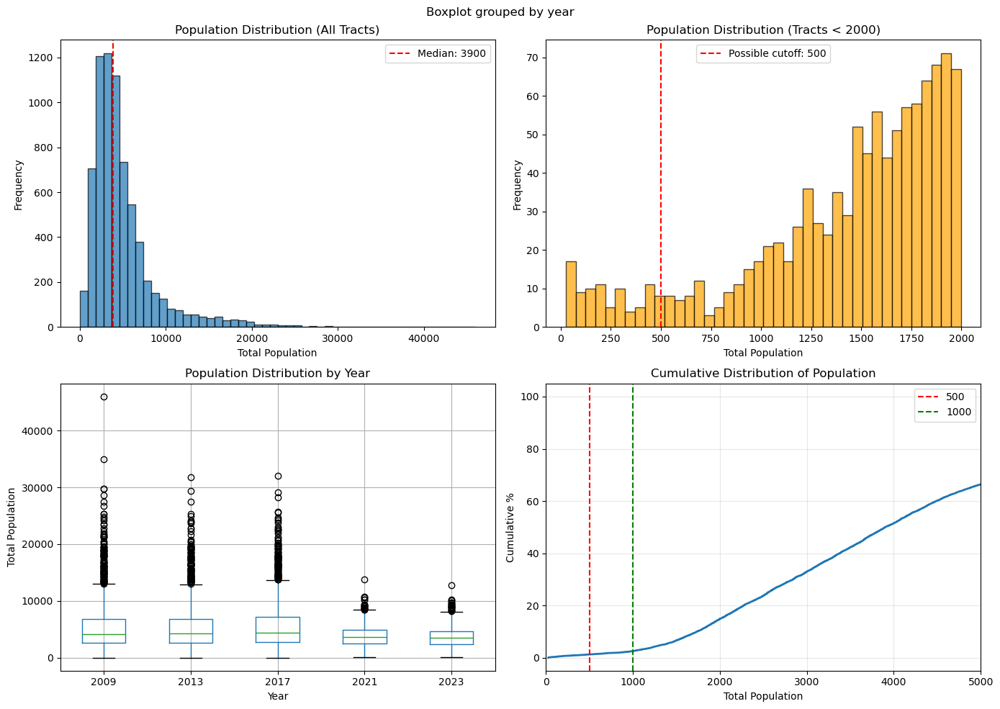


✓ Saved plot to: population_distribution.png

SAMPLE LOW-POPULATION TRACTS
       geoid  year        borough  total_pop  total_housing_units
186    11202  2009  Staten Island         25                    9
4272  152902  2017         Queens         25                   10
4273  155101  2017         Queens         27                   11
2823  139900  2013         Queens         30                   12
2280   50402  2013       Brooklyn         33                   14
93      5500  2009       Brooklyn         34                   13
852    50402  2009       Brooklyn         35                   13
3708   50402  2017          Bronx         35                   14
282    15402  2009          Bronx         40                   24
281    15401  2009          Bronx         51                   31


In [29]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load the data
acs_clean = pd.read_csv('nyc_acs_data_final_2023_boundaries.csv')

print(f"Total rows: {len(acs_clean)}")
print(f"Total unique tracts: {acs_clean['geoid'].nunique()}")

# Look at population distribution
print("\n" + "="*60)
print("POPULATION DISTRIBUTION")
print("="*60)

print("\nPercentiles:")
percentiles = [1, 5, 10, 25, 50, 75, 90, 95, 99]
for p in percentiles:
    val = np.percentile(acs_clean['total_pop'], p)
    print(f"  {p}th percentile: {val:.0f}")

print("\nTracts with very low population:")
low_pop_counts = [
    (100, (acs_clean['total_pop'] < 100).sum()),
    (250, (acs_clean['total_pop'] < 250).sum()),
    (500, (acs_clean['total_pop'] < 500).sum()),
    (1000, (acs_clean['total_pop'] < 1000).sum()),
]

for threshold, count in low_pop_counts:
    pct = 100 * count / len(acs_clean)
    print(f"  < {threshold}: {count} rows ({pct:.1f}%)")

# Create visualizations
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# 1. Histogram of all populations
axes[0, 0].hist(acs_clean['total_pop'], bins=50, edgecolor='black', alpha=0.7)
axes[0, 0].set_xlabel('Total Population')
axes[0, 0].set_ylabel('Frequency')
axes[0, 0].set_title('Population Distribution (All Tracts)')
axes[0, 0].axvline(acs_clean['total_pop'].median(), color='r', linestyle='--', 
                    label=f'Median: {acs_clean["total_pop"].median():.0f}')
axes[0, 0].legend()

# 2. Zoomed in on low population tracts
low_pop = acs_clean[acs_clean['total_pop'] < 2000]
axes[0, 1].hist(low_pop['total_pop'], bins=40, edgecolor='black', alpha=0.7, color='orange')
axes[0, 1].set_xlabel('Total Population')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].set_title('Population Distribution (Tracts < 2000)')
axes[0, 1].axvline(500, color='r', linestyle='--', label='Possible cutoff: 500')
axes[0, 1].legend()

# 3. Box plot by year
acs_clean.boxplot(column='total_pop', by='year', ax=axes[1, 0])
axes[1, 0].set_xlabel('Year')
axes[1, 0].set_ylabel('Total Population')
axes[1, 0].set_title('Population Distribution by Year')
plt.sca(axes[1, 0])
plt.xticks(rotation=0)

# 4. Cumulative distribution
sorted_pop = np.sort(acs_clean['total_pop'])
cumulative = np.arange(1, len(sorted_pop) + 1) / len(sorted_pop) * 100
axes[1, 1].plot(sorted_pop, cumulative, linewidth=2)
axes[1, 1].set_xlabel('Total Population')
axes[1, 1].set_ylabel('Cumulative %')
axes[1, 1].set_title('Cumulative Distribution of Population')
axes[1, 1].axvline(500, color='r', linestyle='--', label='500')
axes[1, 1].axvline(1000, color='g', linestyle='--', label='1000')
axes[1, 1].grid(True, alpha=0.3)
axes[1, 1].legend()
axes[1, 1].set_xlim(0, 5000)

plt.tight_layout()
plt.savefig('population_distribution.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n✓ Saved plot to: population_distribution.png")

# Show some example low-population tracts
print("\n" + "="*60)
print("SAMPLE LOW-POPULATION TRACTS")
print("="*60)

lowest = acs_clean.nsmallest(10, 'total_pop')[['geoid', 'year', 'borough', 'total_pop', 'total_housing_units']]
print(lowest.to_string())

In [33]:
import pandas as pd

print("Applying population cutoff and checking tract continuity...")

# Load the data
acs_clean = pd.read_csv('nyc_acs_data_final_2023_boundaries.csv')

print(f"Before processing: {len(acs_clean)} rows")

# Convert borough and geoid to strings first
acs_clean['borough'] = acs_clean['borough'].astype(str)
acs_clean['geoid'] = acs_clean['geoid'].astype(str).str.zfill(6)

# Create a unique tract identifier combining borough and geoid
acs_clean['tract_id'] = acs_clean['borough'] + '_' + acs_clean['geoid']

print(f"Unique tract_id values: {acs_clean['tract_id'].nunique()}")
print(f"Unique geoid values: {acs_clean['geoid'].nunique()}")

# Apply 500 population minimum
acs_filtered = acs_clean[acs_clean['total_pop'] >= 500].copy()

print(f"\nAfter 500 population cutoff: {len(acs_filtered)} rows")

# Check for tracts that "fall out" (appear, then disappear, then maybe reappear)
print("\nChecking tract continuity...")

years_sorted = sorted(acs_filtered['year'].unique())
print(f"Years in data: {years_sorted}")

# For each tract_id, find first and last appearance
tract_year_ranges = acs_filtered.groupby('tract_id')['year'].agg(['min', 'max', 'count'])

# Calculate expected number of years between first and last
def expected_years(first, last):
    """Calculate how many years should exist between first and last"""
    year_set = set(years_sorted)
    expected = [y for y in year_set if first <= y <= last]
    return len(expected)

tract_year_ranges['expected_count'] = tract_year_ranges.apply(
    lambda row: expected_years(row['min'], row['max']), axis=1
)

# Find tracts with gaps
problematic = tract_year_ranges[
    tract_year_ranges['count'] != tract_year_ranges['expected_count']
]

print(f"\nTracts with gaps (appear, disappear, reappear): {len(problematic)}")

if len(problematic) > 0:
    print("\nSample problematic tracts:")
    for tract_id in problematic.head(10).index:
        years_present = sorted(acs_filtered[acs_filtered['tract_id'] == tract_id]['year'].tolist())
        first_year = min(years_present)
        last_year = max(years_present)
        expected = [y for y in years_sorted if first_year <= y <= last_year]
        missing = set(expected) - set(years_present)
        print(f"  {tract_id}: present in {years_present}, missing {sorted(missing)}")
    
    # Remove these tracts
    good_tracts = tract_year_ranges[
        tract_year_ranges['count'] == tract_year_ranges['expected_count']
    ].index
    
    acs_final = acs_filtered[acs_filtered['tract_id'].isin(good_tracts)].copy()
    
    print(f"\nAfter removing tracts with gaps: {len(acs_final)} rows")
    print(f"  Removed {len(acs_filtered) - len(acs_final)} rows from {len(problematic)} tracts")
else:
    print("✓ No tracts with gaps found")
    acs_final = acs_filtered.copy()

# Summary
print("\n" + "="*60)
print("FINAL DATASET")
print("="*60)

print("\nRows per year:")
for year in sorted(acs_final['year'].unique()):
    count = len(acs_final[acs_final['year'] == year])
    unique = acs_final[acs_final['year'] == year]['tract_id'].nunique()
    print(f"  {year}: {count} rows, {unique} unique tracts")

print("\nTracts per borough:")
for borough in sorted(acs_final['borough'].unique()):
    unique_tracts = acs_final[acs_final['borough'] == borough]['tract_id'].nunique()
    print(f"  {borough}: {unique_tracts} tracts")

print("\nTract appearance patterns:")
first_year_counts = acs_final.groupby('tract_id')['year'].min().value_counts().sort_index()
print("Tracts first appearing in:")
for year, count in first_year_counts.items():
    print(f"  {year}: {count} tracts")

print("\nSummary statistics:")
print(acs_final[['total_pop', 'total_housing_units', 'median_rent', 'median_income']].describe())

# Drop the helper column before saving
acs_final = acs_final.drop(columns=['tract_id'])

# Save
acs_final.to_csv('nyc_acs_data_final_2023_boundaries.csv', index=False)
print("\n✓ Saved final dataset to: nyc_acs_data_final_2023_boundaries.csv")

print("\n" + "="*60)
print("DATASET READY")
print("="*60)
print(f"  - {len(acs_final)} total rows")
print(f"  - {acs_final['geoid'].nunique()} unique geoids (but remember: geoid only unique within borough!)")
print(f"  - All tracts continuous from first appearance to 2023")
print(f"  - Population >= 500")
print(f"  - 2023 (2020 Census) boundaries")

Applying population cutoff and checking tract continuity...
Before processing: 6949 rows
Unique tract_id values: 1780
Unique geoid values: 1404

After 500 population cutoff: 6949 rows

Checking tract continuity...
Years in data: [np.int64(2009), np.int64(2013), np.int64(2017), np.int64(2021), np.int64(2023)]

Tracts with gaps (appear, disappear, reappear): 48

Sample problematic tracts:
  Bronx_000200: present in [2009, 2021, 2023], missing [np.int64(2013), np.int64(2017)]
  Bronx_003300: present in [2009, 2013, 2021, 2023], missing [np.int64(2017)]
  Bronx_004600: present in [2009, 2021, 2023], missing [np.int64(2013), np.int64(2017)]
  Bronx_007200: present in [2009, 2021, 2023], missing [np.int64(2013), np.int64(2017)]
  Bronx_020200: present in [2009, 2021, 2023], missing [np.int64(2013), np.int64(2017)]
  Bronx_024000: present in [2009, 2021, 2023], missing [np.int64(2013), np.int64(2017)]
  Bronx_028600: present in [2009, 2021, 2023], missing [np.int64(2013), np.int64(2017)]
  Br

In [34]:
import pandas as pd

# Load the final data
acs_final = pd.read_csv('nyc_acs_data_final_2023_boundaries.csv')

print("="*60)
print("TOTAL POPULATION IN DATASET")
print("="*60)

# Calculate total population per year
total_pop_by_year = acs_final.groupby('year')['total_pop'].sum()

print("\nTotal population by year:")
for year, pop in total_pop_by_year.items():
    print(f"  {year}: {pop:,}")

# Calculate by borough and year
print("\n" + "="*60)
print("POPULATION BY BOROUGH")
print("="*60)

for year in sorted(acs_final['year'].unique()):
    print(f"\n{year}:")
    year_data = acs_final[acs_final['year'] == year]
    borough_totals = year_data.groupby('borough')['total_pop'].sum().sort_values(ascending=False)
    for borough, pop in borough_totals.items():
        print(f"  {borough:15s}: {pop:>10,}")
    print(f"  {'TOTAL':15s}: {borough_totals.sum():>10,}")

# Actual NYC population for comparison (approximate)
print("\n" + "="*60)
print("COMPARISON TO ACTUAL NYC POPULATION")
print("="*60)

actual_nyc_pop = {
    2009: 8_391_881,  # Approximate
    2013: 8_405_837,
    2017: 8_622_698,
    2021: 8_467_513,
    2023: 8_258_035   # Estimate
}

print("\nDataset vs. Actual NYC Population:")
for year in sorted(total_pop_by_year.index):
    dataset_pop = total_pop_by_year[year]
    if year in actual_nyc_pop:
        actual = actual_nyc_pop[year]
        coverage = 100 * dataset_pop / actual
        diff = dataset_pop - actual
        print(f"  {year}: {dataset_pop:>10,} (dataset) vs {actual:>10,} (actual) → {coverage:.1f}% coverage, diff: {diff:>+10,}")
    else:
        print(f"  {year}: {dataset_pop:>10,} (dataset) vs ??? (actual)")

TOTAL POPULATION IN DATASET

Total population by year:
  2009: 7,542,598
  2013: 7,900,344
  2017: 8,165,393
  2021: 5,249,325
  2023: 5,096,330

POPULATION BY BOROUGH

2009:
  Brooklyn       :  2,947,554
  Bronx          :  2,296,763
  Queens         :  1,305,044
  Manhattan      :    751,422
  Staten Island  :    241,815
  TOTAL          :  7,542,598

2013:
  Brooklyn       :  2,843,782
  Bronx          :  2,784,330
  Queens         :  1,486,046
  Manhattan      :    541,984
  Staten Island  :    244,202
  TOTAL          :  7,900,344

2017:
  Brooklyn       :  2,962,398
  Bronx          :  2,881,885
  Queens         :  1,517,750
  Manhattan      :    553,051
  Staten Island  :    250,309
  TOTAL          :  8,165,393

2021:
  Brooklyn       :  1,913,521
  Bronx          :  1,408,037
  Queens         :  1,267,516
  Manhattan      :    432,368
  Staten Island  :    227,883
  TOTAL          :  5,249,325

2023:
  Brooklyn       :  1,861,319
  Bronx          :  1,340,587
  Queens         

In [35]:
import pandas as pd

# Load both the adjusted data and the original data
acs_final = pd.read_csv('nyc_acs_data_final_2023_boundaries.csv')
acs_original = pd.read_csv('nyc_acs_data_2009_2023.csv')

print("Investigating the 2021/2023 population drop...")
print("="*60)

# Compare tract counts
print("\nTract counts:")
print("Original data:")
for year in [2009, 2013, 2017, 2021, 2023]:
    if year in acs_original['year'].values:
        count = acs_original[acs_original['year'] == year]['geoid'].nunique()
        pop = acs_original[acs_original['year'] == year]['total_pop'].sum()
        print(f"  {year}: {count} tracts, {pop:,} population")

print("\nFinal adjusted data:")
for year in sorted(acs_final['year'].unique()):
    count = acs_final[acs_final['year'] == year]['geoid'].nunique()
    pop = acs_final[acs_final['year'] == year]['total_pop'].sum()
    print(f"  {year}: {count} tracts, {pop:,} population")

# Check what happened during the adjustment process
print("\n" + "="*60)
print("DIAGNOSIS")
print("="*60)

# Load the pre-filtering adjusted data
acs_adjusted_raw = pd.read_csv('nyc_acs_data_adjusted_2023_boundaries.csv')

print("\nBefore any filtering (right after boundary adjustment):")
for year in sorted(acs_adjusted_raw['year'].unique()):
    count = acs_adjusted_raw[acs_adjusted_raw['year'] == year]['geoid'].nunique()
    pop = acs_adjusted_raw[acs_adjusted_raw['year'] == year]['total_pop'].sum()
    print(f"  {year}: {count} tracts, {pop:,} population")

# The issue is likely that we filtered to only tracts present in 2023
# But 2021 and 2023 came from the ORIGINAL cleaned data, not the adjusted data
# So we may have filtered out tracts that exist in 2021/2023 but not in the adjusted 2009/2013/2017

print("\nThe problem:")
print("When we filtered to 'only tracts that exist in 2023', we used the")
print("ADJUSTED 2023 data, but the original 2021/2023 data had different tracts.")

Investigating the 2021/2023 population drop...

Tract counts:
Original data:
  2009: 1246 tracts, 8,252,380 population
  2013: 1307 tracts, 8,239,788 population
  2017: 1303 tracts, 8,504,616 population
  2021: 1432 tracts, 8,597,330 population
  2023: 1430 tracts, 8,372,784 population

Final adjusted data:
  2009: 1326 tracts, 7,542,598 population
  2013: 1380 tracts, 7,900,344 population
  2017: 1380 tracts, 8,165,393 population
  2021: 1358 tracts, 5,249,325 population
  2023: 1353 tracts, 5,096,330 population

DIAGNOSIS

Before any filtering (right after boundary adjustment):
  2009: 1518 tracts, 8,248,949 population
  2013: 1519 tracts, 8,236,509 population
  2017: 1516 tracts, 8,501,192 population
  2021: 1432 tracts, 8,597,330 population
  2023: 1430 tracts, 8,372,784 population

The problem:
When we filtered to 'only tracts that exist in 2023', we used the
ADJUSTED 2023 data, but the original 2021/2023 data had different tracts.


In [36]:
import pandas as pd

print("Rebuilding the dataset correctly...")

# Load the boundary-adjusted data (2009, 2013, 2017)
acs_adjusted = pd.read_csv('nyc_acs_data_adjusted_2023_boundaries.csv')

# Load the ORIGINAL data to get the unadjusted 2021 and 2023
acs_original = pd.read_csv('nyc_acs_data_2009_2023.csv')
acs_original['geoid'] = acs_original['geoid'].astype(str).str.zfill(6)

print("Step 1: Get adjusted 2009, 2013, 2017...")
adjusted_years = acs_adjusted[acs_adjusted['year'].isin([2009, 2013, 2017])].copy()
print(f"  Adjusted data: {len(adjusted_years)} rows")

print("\nStep 2: Get ORIGINAL 2021 and 2023 (no adjustment needed)...")
original_2021_2023 = acs_original[acs_original['year'].isin([2021, 2023])].copy()
print(f"  Original 2021/2023: {len(original_2021_2023)} rows")

# Combine them
acs_combined = pd.concat([adjusted_years, original_2021_2023], ignore_index=True)
print(f"\nCombined: {len(acs_combined)} rows")

# Apply quality filters
print("\nApplying quality filters...")
acs_filtered = acs_combined[
    (acs_combined['median_rent'] > 0) & 
    (acs_combined['median_income'] > 0) &
    (acs_combined['total_pop'] >= 500) &
    (acs_combined['total_housing_units'] > 0)
].copy()
print(f"After filters: {len(acs_filtered)} rows")

# Check tract continuity
print("\nChecking tract continuity...")
acs_filtered['borough'] = acs_filtered['borough'].astype(str)
acs_filtered['geoid'] = acs_filtered['geoid'].astype(str).str.zfill(6)
acs_filtered['tract_id'] = acs_filtered['borough'] + '_' + acs_filtered['geoid']

years_sorted = sorted(acs_filtered['year'].unique())
tract_year_ranges = acs_filtered.groupby('tract_id')['year'].agg(['min', 'max', 'count'])

def expected_years(first, last):
    year_set = set(years_sorted)
    expected = [y for y in year_set if first <= y <= last]
    return len(expected)

tract_year_ranges['expected_count'] = tract_year_ranges.apply(
    lambda row: expected_years(row['min'], row['max']), axis=1
)

problematic = tract_year_ranges[
    tract_year_ranges['count'] != tract_year_ranges['expected_count']
]

print(f"Tracts with gaps: {len(problematic)}")

if len(problematic) > 0:
    good_tracts = tract_year_ranges[
        tract_year_ranges['count'] == tract_year_ranges['expected_count']
    ].index
    acs_final = acs_filtered[acs_filtered['tract_id'].isin(good_tracts)].copy()
    print(f"After removing gaps: {len(acs_final)} rows")
else:
    acs_final = acs_filtered.copy()

# Drop helper column
acs_final = acs_final.drop(columns=['tract_id'])

# Check population
print("\n" + "="*60)
print("POPULATION CHECK")
print("="*60)
for year in sorted(acs_final['year'].unique()):
    count = acs_final[acs_final['year'] == year]['geoid'].nunique()
    pop = acs_final[acs_final['year'] == year]['total_pop'].sum()
    print(f"  {year}: {count} tracts, {pop:,} population")

# Save
acs_final.to_csv('nyc_acs_data_final_2023_boundaries.csv', index=False)
print("\n✓ Saved to: nyc_acs_data_final_2023_boundaries.csv")

Rebuilding the dataset correctly...
Step 1: Get adjusted 2009, 2013, 2017...
  Adjusted data: 4553 rows

Step 2: Get ORIGINAL 2021 and 2023 (no adjustment needed)...
  Original 2021/2023: 4336 rows

Combined: 8889 rows

Applying quality filters...
After filters: 8740 rows

Checking tract continuity...
Tracts with gaps: 139
After removing gaps: 8304 rows

POPULATION CHECK
  2009: 1336 tracts, 6,951,722 population
  2013: 1450 tracts, 8,124,384 population
  2017: 1457 tracts, 8,417,110 population
  2021: 1403 tracts, 8,108,018 population
  2023: 1394 tracts, 7,850,276 population

✓ Saved to: nyc_acs_data_final_2023_boundaries.csv


In [37]:
import pandas as pd

acs_final = pd.read_csv('nyc_acs_data_final_2023_boundaries.csv')

print("Checking for boundary consistency issues...")
print("="*60)

# Create tract_id
acs_final['tract_id'] = acs_final['borough'].astype(str) + '_' + acs_final['geoid'].astype(str).str.zfill(6)

# Get tract lists by year
tracts_by_year = {}
for year in sorted(acs_final['year'].unique()):
    tracts_by_year[year] = set(acs_final[acs_final['year'] == year]['tract_id'].unique())

# Compare overlap between years
print("\nTract overlap between consecutive years:")
years = sorted(tracts_by_year.keys())
for i in range(len(years) - 1):
    year1, year2 = years[i], years[i+1]
    set1, set2 = tracts_by_year[year1], tracts_by_year[year2]
    
    only_in_year1 = set1 - set2
    only_in_year2 = set2 - set1
    overlap = set1 & set2
    
    print(f"\n{year1} → {year2}:")
    print(f"  Tracts in both: {len(overlap)}")
    print(f"  Only in {year1}: {len(only_in_year1)}")
    print(f"  Only in {year2}: {len(only_in_year2)}")
    
    if only_in_year1:
        print(f"  → {len(only_in_year1)} tracts disappeared")
    if only_in_year2:
        print(f"  → {len(only_in_year2)} new tracts appeared")

# The key question: Are the 2021/2023 tracts consistent with each other?
print("\n" + "="*60)
print("2021 vs 2023 consistency (both should use 2020 boundaries):")
print("="*60)
set_2021 = tracts_by_year[2021]
set_2023 = tracts_by_year[2023]
only_2021 = set_2021 - set_2023
only_2023 = set_2023 - set_2021

print(f"Tracts in both 2021 and 2023: {len(set_2021 & set_2023)}")
print(f"Only in 2021: {len(only_2021)}")
print(f"Only in 2023: {len(only_2023)}")

if only_2021:
    print(f"\nSample tracts that disappeared from 2021 to 2023:")
    for tract_id in list(only_2021)[:5]:
        print(f"  {tract_id}")

if only_2023:
    print(f"\nSample tracts that appeared in 2023 but not 2021:")
    for tract_id in list(only_2023)[:5]:
        print(f"  {tract_id}")

# Check if the time gap filtering worked properly
print("\n" + "="*60)
print("Verifying no time gaps exist:")
print("="*60)

all_years = sorted(acs_final['year'].unique())
gaps_found = False

for tract_id in acs_final['tract_id'].unique():
    tract_data = acs_final[acs_final['tract_id'] == tract_id]
    years_present = sorted(tract_data['year'].tolist())
    
    # Check if continuous from first to last
    first_year = min(years_present)
    last_year = max(years_present)
    expected_years = [y for y in all_years if first_year <= y <= last_year]
    
    if len(years_present) != len(expected_years):
        gaps_found = True
        print(f"GAP FOUND: {tract_id}")
        print(f"  Present: {years_present}")
        print(f"  Expected: {expected_years}")
        print(f"  Missing: {set(expected_years) - set(years_present)}")
        break

if not gaps_found:
    print("✓ No gaps found — all tracts are continuous from first to last appearance")

Checking for boundary consistency issues...

Tract overlap between consecutive years:

2009 → 2013:
  Tracts in both: 1198
  Only in 2009: 138
  Only in 2013: 252
  → 138 tracts disappeared
  → 252 new tracts appeared

2013 → 2017:
  Tracts in both: 1443
  Only in 2013: 7
  Only in 2017: 14
  → 7 tracts disappeared
  → 14 new tracts appeared

2017 → 2021:
  Tracts in both: 1289
  Only in 2017: 168
  Only in 2021: 746
  → 168 tracts disappeared
  → 746 new tracts appeared

2021 → 2023:
  Tracts in both: 2009
  Only in 2021: 26
  Only in 2023: 17
  → 26 tracts disappeared
  → 17 new tracts appeared

2021 vs 2023 consistency (both should use 2020 boundaries):
Tracts in both 2021 and 2023: 2009
Only in 2021: 26
Only in 2023: 17

Sample tracts that disappeared from 2021 to 2023:
  Bronx_017500
  Brooklyn_046800
  Manhattan_002902
  Queens_043400
  Queens_119900

Sample tracts that appeared in 2023 but not 2021:
  Queens_063200
  Bronx_028300
  Queens_042400
  Queens_040901
  Queens_060600



Analyzing population changes between consecutive years...

2009 → 2013
----------------------------------------
Tracts in both years: 1198

Population ratio statistics:
  Mean ratio: 1.102
  Median ratio: 0.997
  Std dev: 0.775
  Min ratio: 0.044 (tract: Bronx_022800)
  Max ratio: 16.282 (tract: Manhattan_003200)

  ⚠️  16 tracts with >50% population DROP:
    Brooklyn_000500: 5279 → 609 (-88.5%)
    Bronx_001902: 2192 → 785 (-64.2%)
    Bronx_011900: 8093 → 3912 (-51.7%)
    Brooklyn_020700: 1913 → 887 (-53.6%)
    Bronx_022800: 15166 → 672 (-95.6%)

  ⚠️  35 tracts with >100% population INCREASE:
    Manhattan_003200: 543 → 8841 (+1528.2%)
    Bronx_005001: 1353 → 4782 (+253.4%)
    Bronx_005002: 1575 → 5644 (+258.3%)
    Manhattan_008100: 3627 → 13262 (+265.6%)
    Bronx_008900: 4004 → 8994 (+124.6%)

2013 → 2017
----------------------------------------
Tracts in both years: 1443

Population ratio statistics:
  Mean ratio: 1.037
  Median ratio: 1.032
  Std dev: 0.110
  Min ratio: 0.

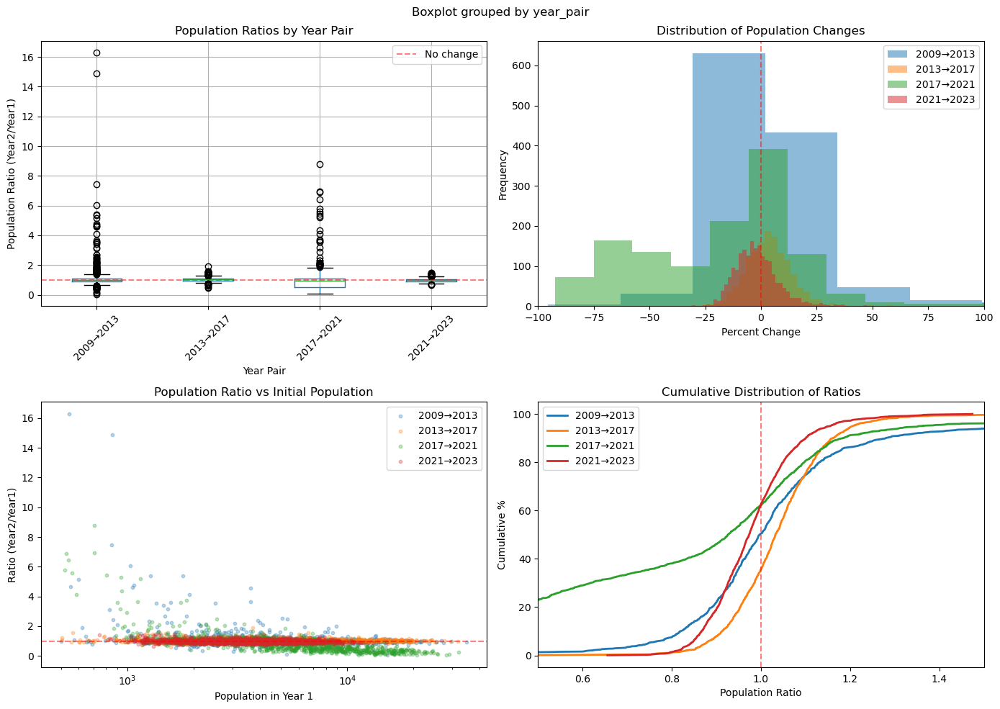


✓ Saved plot to: population_ratio_check.png


In [38]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the data
acs_final = pd.read_csv('nyc_acs_data_final_2023_boundaries.csv')
acs_final['tract_id'] = acs_final['borough'].astype(str) + '_' + acs_final['geoid'].astype(str).str.zfill(6)

print("Analyzing population changes between consecutive years...")
print("="*60)

years = sorted(acs_final['year'].unique())

# Calculate ratios for each consecutive pair
all_ratios = []

for i in range(len(years) - 1):
    year1, year2 = years[i], years[i+1]
    
    print(f"\n{year1} → {year2}")
    print("-" * 40)
    
    # Get data for both years
    data_y1 = acs_final[acs_final['year'] == year1][['tract_id', 'total_pop']].rename(columns={'total_pop': 'pop_y1'})
    data_y2 = acs_final[acs_final['year'] == year2][['tract_id', 'total_pop']].rename(columns={'total_pop': 'pop_y2'})
    
    # Merge on tracts that exist in both years
    merged = data_y1.merge(data_y2, on='tract_id')
    
    # Calculate ratio
    merged['ratio'] = merged['pop_y2'] / merged['pop_y1']
    merged['pct_change'] = (merged['ratio'] - 1) * 100
    
    print(f"Tracts in both years: {len(merged)}")
    print(f"\nPopulation ratio statistics:")
    print(f"  Mean ratio: {merged['ratio'].mean():.3f}")
    print(f"  Median ratio: {merged['ratio'].median():.3f}")
    print(f"  Std dev: {merged['ratio'].std():.3f}")
    print(f"  Min ratio: {merged['ratio'].min():.3f} (tract: {merged.loc[merged['ratio'].idxmin(), 'tract_id']})")
    print(f"  Max ratio: {merged['ratio'].max():.3f} (tract: {merged.loc[merged['ratio'].idxmax(), 'tract_id']})")
    
    # Flag suspicious changes
    suspicious_low = merged[merged['ratio'] < 0.5]  # Population dropped by >50%
    suspicious_high = merged[merged['ratio'] > 2.0]  # Population more than doubled
    
    if len(suspicious_low) > 0:
        print(f"\n  ⚠️  {len(suspicious_low)} tracts with >50% population DROP:")
        for _, row in suspicious_low.head(5).iterrows():
            print(f"    {row['tract_id']}: {row['pop_y1']:.0f} → {row['pop_y2']:.0f} ({row['pct_change']:+.1f}%)")
    
    if len(suspicious_high) > 0:
        print(f"\n  ⚠️  {len(suspicious_high)} tracts with >100% population INCREASE:")
        for _, row in suspicious_high.head(5).iterrows():
            print(f"    {row['tract_id']}: {row['pop_y1']:.0f} → {row['pop_y2']:.0f} ({row['pct_change']:+.1f}%)")
    
    # Store for plotting
    merged['year_pair'] = f"{year1}→{year2}"
    all_ratios.append(merged)

# Combine all ratios
all_ratios_df = pd.concat(all_ratios)

# Create visualizations
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# 1. Box plots of ratios by year pair
year_pairs = [f"{years[i]}→{years[i+1]}" for i in range(len(years)-1)]
all_ratios_df.boxplot(column='ratio', by='year_pair', ax=axes[0, 0])
axes[0, 0].set_title('Population Ratios by Year Pair')
axes[0, 0].set_xlabel('Year Pair')
axes[0, 0].set_ylabel('Population Ratio (Year2/Year1)')
axes[0, 0].axhline(y=1.0, color='r', linestyle='--', alpha=0.5, label='No change')
axes[0, 0].legend()
plt.sca(axes[0, 0])
plt.xticks(rotation=45)

# 2. Histograms of percent change
for year_pair in year_pairs:
    subset = all_ratios_df[all_ratios_df['year_pair'] == year_pair]
    axes[0, 1].hist(subset['pct_change'], bins=50, alpha=0.5, label=year_pair)
axes[0, 1].set_xlabel('Percent Change')
axes[0, 1].set_ylabel('Frequency')
axes[0, 1].set_title('Distribution of Population Changes')
axes[0, 1].axvline(x=0, color='r', linestyle='--', alpha=0.5)
axes[0, 1].legend()
axes[0, 1].set_xlim(-100, 100)

# 3. Scatter: old pop vs ratio (to see if small tracts are more volatile)
for year_pair in year_pairs:
    subset = all_ratios_df[all_ratios_df['year_pair'] == year_pair]
    axes[1, 0].scatter(subset['pop_y1'], subset['ratio'], alpha=0.3, s=10, label=year_pair)
axes[1, 0].set_xlabel('Population in Year 1')
axes[1, 0].set_ylabel('Ratio (Year2/Year1)')
axes[1, 0].set_title('Population Ratio vs Initial Population')
axes[1, 0].axhline(y=1.0, color='r', linestyle='--', alpha=0.5)
axes[1, 0].set_xscale('log')
axes[1, 0].legend()

# 4. Cumulative distribution
for year_pair in year_pairs:
    subset = all_ratios_df[all_ratios_df['year_pair'] == year_pair]
    sorted_ratios = np.sort(subset['ratio'])
    cumulative = np.arange(1, len(sorted_ratios) + 1) / len(sorted_ratios) * 100
    axes[1, 1].plot(sorted_ratios, cumulative, label=year_pair, linewidth=2)
axes[1, 1].set_xlabel('Population Ratio')
axes[1, 1].set_ylabel('Cumulative %')
axes[1, 1].set_title('Cumulative Distribution of Ratios')
axes[1, 1].axvline(x=1.0, color='r', linestyle='--', alpha=0.5)
axes[1, 1].legend()
axes[1, 1].set_xlim(0.5, 1.5)

plt.tight_layout()
plt.savefig('population_ratio_check.png', dpi=150, bbox_inches='tight')
plt.show()

print("\n" + "="*60)
print("✓ Saved plot to: population_ratio_check.png")

In [39]:
import pandas as pd

print("Checking crosswalk files for county/borough information...")
print("="*60)

# Load crosswalks
crosswalk_2009 = pd.read_csv('crosswalk_2009_to_2023.csv')
crosswalk_2010 = pd.read_csv('crosswalk_2010_to_2023.csv')

print("\n2009→2023 Crosswalk:")
print(crosswalk_2009.head(10))
print(f"\nColumns: {crosswalk_2009.columns.tolist()}")

print("\n2010→2023 Crosswalk:")
print(crosswalk_2010.head(10))
print(f"\nColumns: {crosswalk_2010.columns.tolist()}")

# Check if there are duplicate geoids (which would confirm they're not unique)
print("\n" + "="*60)
print("CHECKING FOR DUPLICATE GEOIDS")
print("="*60)

print("\n2009→2023 Crosswalk:")
print(f"  Unique old_geoids: {crosswalk_2009['old_geoid'].nunique()}")
print(f"  Total old_geoid rows: {len(crosswalk_2009)}")
print(f"  Duplicates: {len(crosswalk_2009) - crosswalk_2009['old_geoid'].nunique()}")

print("\n2010→2023 Crosswalk:")
print(f"  Unique old_geoids: {crosswalk_2010['old_geoid'].nunique()}")
print(f"  Total old_geoid rows: {len(crosswalk_2010)}")
print(f"  Duplicates: {len(crosswalk_2010) - crosswalk_2010['old_geoid'].nunique()}")

Checking crosswalk files for county/borough information...

2009→2023 Crosswalk:
   old_geoid  new_geoid  area_weight
0      37800      37800     1.000000
1      32800      32800     0.254228
2      34000      34000     0.549707
3      45800      45800     0.359455
4      43600      43600     0.529076
5      42200      42200     0.250768
6      31900      31900     0.051625
7      37400      37400     0.242055
8      39800      39800     0.333033
9      42100      43503     0.007762

Columns: ['old_geoid', 'new_geoid', 'area_weight']

2010→2023 Crosswalk:
   old_geoid  new_geoid  area_weight
0       3400       3400     0.063223
1       3900       3900     0.078130
2       3600       3600     0.251475
3       3700       3700     0.263195
4       3700      23802     0.018440
5       3700      23804     0.013238
6       3700      23803     0.014378
7       3800       3800     0.201154
8       4001       4001     0.585910
9       4200       4200     0.260361

Columns: ['old_geoid', 'new_ge

In [41]:
###########################################
########FIX STARTS HERE ###################
import geopandas as gpd
import pandas as pd

print("Regenerating crosswalks WITH borough information...")
print("="*60)

# The shapefiles should have county information - let's reload them properly
print("\nLoading shapefiles with county info...")

# Load 2009
tracts_2009 = []
for county_name in ['bronx', 'kings', 'newyorkCounty', 'queens', 'richmond']:
    gdf = gpd.read_file(f'zip://shapes_2009/shapefile_2009_{county_name}.zip')
    tracts_2009.append(gdf)
tracts_2009 = pd.concat(tracts_2009, ignore_index=True)

# Load 2013, 2023
tracts_2013 = gpd.read_file('temp_shapefiles/2013/tl_2013_36_tract.shp')
tracts_2023 = gpd.read_file('temp_shapefiles/2023/tl_2023_36_tract.shp')

# Filter to NYC
nyc_counties = ['005', '047', '061', '081', '085']

# Helper to get county column name
def get_county_col(gdf):
    cols = [c for c in gdf.columns if 'COUNTY' in c.upper() and 'FP' in c.upper()]
    return cols[0] if cols else None

def get_tract_col(gdf):
    cols = [c for c in gdf.columns if 'TRACT' in c.upper() and 'CE' in c.upper()]
    return cols[0] if cols else None

# Standardize 2009
county_col = get_county_col(tracts_2009)
tract_col = get_tract_col(tracts_2009)
tracts_2009 = tracts_2009[tracts_2009[county_col].isin(nyc_counties)].copy()
tracts_2009['county'] = tracts_2009[county_col]
tracts_2009['geoid'] = tracts_2009[tract_col].astype(str).str.zfill(6)
tracts_2009['tract_id'] = tracts_2009['county'] + '_' + tracts_2009['geoid']
tracts_2009 = tracts_2009[['tract_id', 'county', 'geoid', 'geometry']].to_crs('EPSG:2263')

# Standardize 2013
county_col = get_county_col(tracts_2013)
tract_col = get_tract_col(tracts_2013)
tracts_2013 = tracts_2013[tracts_2013[county_col].isin(nyc_counties)].copy()
tracts_2013['county'] = tracts_2013[county_col]
tracts_2013['geoid'] = tracts_2013[tract_col].astype(str).str.zfill(6)
tracts_2013['tract_id'] = tracts_2013['county'] + '_' + tracts_2013['geoid']
tracts_2013 = tracts_2013[['tract_id', 'county', 'geoid', 'geometry']].to_crs('EPSG:2263')

# Standardize 2023
county_col = get_county_col(tracts_2023)
tract_col = get_tract_col(tracts_2023)
tracts_2023 = tracts_2023[tracts_2023[county_col].isin(nyc_counties)].copy()
tracts_2023['county'] = tracts_2023[county_col]
tracts_2023['geoid'] = tracts_2023[tract_col].astype(str).str.zfill(6)
tracts_2023['tract_id'] = tracts_2023['county'] + '_' + tracts_2023['geoid']
tracts_2023 = tracts_2023[['tract_id', 'county', 'geoid', 'geometry']].to_crs('EPSG:2263')

print(f"2009: {len(tracts_2009)} tracts")
print(f"2013: {len(tracts_2013)} tracts")
print(f"2023: {len(tracts_2023)} tracts")

print("\nCreating crosswalks with tract_id (county + geoid)...")

def create_crosswalk_with_county(old_tracts, new_tracts, old_year):
    print(f"\n{old_year} → 2023:")
    
    # Spatial intersection - rename columns before overlay to avoid conflicts
    old_renamed = old_tracts.rename(columns={'tract_id': 'tract_id_old', 
                                               'county': 'county_old',
                                               'geoid': 'geoid_old'})
    new_renamed = new_tracts.rename(columns={'tract_id': 'tract_id_new',
                                               'county': 'county_new', 
                                               'geoid': 'geoid_new'})
    
    overlay = gpd.overlay(old_renamed, new_renamed, how='intersection')
    
    # Calculate weights
    overlay['intersection_area'] = overlay.geometry.area
    overlay['area_weight'] = (
        overlay['intersection_area'] / 
        overlay.groupby('tract_id_old')['intersection_area'].transform('sum')
    )
    
    # Create crosswalk
    crosswalk = overlay[['tract_id_old', 'tract_id_new', 'area_weight']].copy()
    crosswalk.columns = ['old_tract_id', 'new_tract_id', 'area_weight']
    
    # Remove tiny slivers
    crosswalk = crosswalk[crosswalk['area_weight'] > 0.001]
    
    print(f"  Mappings: {len(crosswalk)}")
    print(f"  Unique old tracts: {crosswalk['old_tract_id'].nunique()}")
    print(f"  Unique new tracts: {crosswalk['new_tract_id'].nunique()}")
    
    return crosswalk

crosswalk_2009_fixed = create_crosswalk_with_county(tracts_2009, tracts_2023, '2009')
crosswalk_2010_fixed = create_crosswalk_with_county(tracts_2013, tracts_2023, '2010')

# Save
crosswalk_2009_fixed.to_csv('crosswalk_2009_to_2023_FIXED.csv', index=False)
crosswalk_2010_fixed.to_csv('crosswalk_2010_to_2023_FIXED.csv', index=False)

print("\n✓ Saved fixed crosswalks with county information")

Regenerating crosswalks WITH borough information...

Loading shapefiles with county info...
2009: 2217 tracts
2013: 2167 tracts
2023: 2327 tracts

Creating crosswalks with tract_id (county + geoid)...

2009 → 2023:


/opt/anaconda3/lib/python3.13/site-packages/geopandas/tools/overlay.py:358: UserWarning: `keep_geom_type=True` in overlay resulted in 13449 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  result = _collection_extract(result, geom_type, keep_geom_type_warning)


  Mappings: 3974
  Unique old tracts: 2217
  Unique new tracts: 2327

2010 → 2023:
  Mappings: 3531
  Unique old tracts: 2167
  Unique new tracts: 2327

✓ Saved fixed crosswalks with county information


/opt/anaconda3/lib/python3.13/site-packages/geopandas/tools/overlay.py:358: UserWarning: `keep_geom_type=True` in overlay resulted in 14562 dropped geometries of different geometry types than df1 has. Set `keep_geom_type=False` to retain all geometries
  result = _collection_extract(result, geom_type, keep_geom_type_warning)


In [42]:
import pandas as pd

print("Re-adjusting ACS data with FIXED crosswalks (county-aware)...")
print("="*60)

# Load original ACS data
acs_original = pd.read_csv('nyc_acs_data_2009_2023.csv')
acs_original['geoid'] = acs_original['geoid'].astype(str).str.zfill(6)
acs_original['borough'] = acs_original['borough'].astype(str)

# Create tract_id (county code + geoid)
# Map borough names to county codes
borough_to_county = {
    'Bronx': '005',
    'Brooklyn': '047',
    'Manhattan': '061',
    'Queens': '081',
    'Staten Island': '085'
}
acs_original['county'] = acs_original['borough'].map(borough_to_county)
acs_original['tract_id'] = acs_original['county'] + '_' + acs_original['geoid']

print(f"Original ACS data: {len(acs_original)} rows")

# Load fixed crosswalks
crosswalk_2009 = pd.read_csv('crosswalk_2009_to_2023_FIXED.csv')
crosswalk_2010 = pd.read_csv('crosswalk_2010_to_2023_FIXED.csv')

print(f"Loaded crosswalks:")
print(f"  2009→2023: {len(crosswalk_2009)} mappings")
print(f"  2010→2023: {len(crosswalk_2010)} mappings")

def adjust_to_2023_boundaries_FIXED(df, year, crosswalk):
    """
    Adjust data from old boundaries to 2023 boundaries using county-aware crosswalk.
    """
    print(f"\nAdjusting {year} data...")
    
    # Get data for this year
    year_data = df[df['year'] == year].copy()
    print(f"  Input: {len(year_data)} rows")
    
    # Merge with crosswalk using tract_id
    merged = year_data.merge(
        crosswalk, 
        left_on='tract_id', 
        right_on='old_tract_id',
        how='left'
    )
    
    # For tracts without a mapping, keep original tract_id
    merged['new_tract_id'] = merged['new_tract_id'].fillna(merged['tract_id'])
    merged['area_weight'] = merged['area_weight'].fillna(1.0)
    
    print(f"  After crosswalk merge: {len(merged)} rows")
    
    # Distribute counts proportionally
    count_vars = ['total_pop', 'white_non_hisp', 'total_housing_units', 'vacant_housing_units']
    for var in count_vars:
        merged[f'{var}_adj'] = merged[var] * merged['area_weight']
    
    # Aggregate counts to new boundaries
    aggregated_counts = merged.groupby('new_tract_id').agg({
        'total_pop_adj': 'sum',
        'white_non_hisp_adj': 'sum',
        'total_housing_units_adj': 'sum',
        'vacant_housing_units_adj': 'sum'
    }).reset_index()
    
    # For medians: population-weighted average
    merged['pop_weight'] = merged['total_pop_adj'] / merged.groupby('new_tract_id')['total_pop_adj'].transform('sum')
    
    aggregated_medians = merged.groupby('new_tract_id').apply(
        lambda x: pd.Series({
            'median_rent': (x['median_rent'] * x['pop_weight']).sum(),
            'median_income': (x['median_income'] * x['pop_weight']).sum()
        })
    ).reset_index()
    
    # Combine
    adjusted = aggregated_counts.merge(aggregated_medians, on='new_tract_id')
    
    # Extract county and geoid from new_tract_id
    adjusted['county'] = adjusted['new_tract_id'].str[:3]
    adjusted['geoid'] = adjusted['new_tract_id'].str[4:]
    
    # Map county back to borough
    county_to_borough = {v: k for k, v in borough_to_county.items()}
    adjusted['borough'] = adjusted['county'].map(county_to_borough)
    adjusted['year'] = year
    
    # Rename columns
    adjusted = adjusted.rename(columns={
        'total_pop_adj': 'total_pop',
        'white_non_hisp_adj': 'white_non_hisp',
        'total_housing_units_adj': 'total_housing_units',
        'vacant_housing_units_adj': 'vacant_housing_units'
    })
    
    # Round counts
    for var in ['total_pop', 'white_non_hisp', 'total_housing_units', 'vacant_housing_units']:
        adjusted[var] = adjusted[var].round().astype(int)
    
    # Select columns
    adjusted = adjusted[['geoid', 'borough', 'year', 'median_rent', 'median_income',
                        'total_pop', 'white_non_hisp', 'total_housing_units', 'vacant_housing_units']]
    
    print(f"  Result: {len(adjusted)} tracts")
    
    return adjusted

# Adjust years that need it
print("\n" + "="*60)
print("ADJUSTING DATA WITH FIXED CROSSWALKS")
print("="*60)

adjusted_2009 = adjust_to_2023_boundaries_FIXED(acs_original, 2009, crosswalk_2009)
adjusted_2013 = adjust_to_2023_boundaries_FIXED(acs_original, 2013, crosswalk_2010)
adjusted_2017 = adjust_to_2023_boundaries_FIXED(acs_original, 2017, crosswalk_2010)

# Get original 2021 and 2023 (no adjustment needed)
data_2021 = acs_original[acs_original['year'] == 2021][['geoid', 'borough', 'year', 'median_rent', 'median_income',
                                                          'total_pop', 'white_non_hisp', 'total_housing_units', 'vacant_housing_units']].copy()
data_2023 = acs_original[acs_original['year'] == 2023][['geoid', 'borough', 'year', 'median_rent', 'median_income',
                                                          'total_pop', 'white_non_hisp', 'total_housing_units', 'vacant_housing_units']].copy()

print("\n2021 and 2023: No adjustment needed")
print(f"  2021: {len(data_2021)} tracts")
print(f"  2023: {len(data_2023)} tracts")

# Combine all
acs_adjusted_fixed = pd.concat([
    adjusted_2009,
    adjusted_2013,
    adjusted_2017,
    data_2021,
    data_2023
], ignore_index=True)

# Sort
acs_adjusted_fixed = acs_adjusted_fixed.sort_values(['year', 'geoid']).reset_index(drop=True)

print("\n" + "="*60)
print("SUMMARY")
print("="*60)
print(f"Total rows: {len(acs_adjusted_fixed)}")
print(f"\nRows per year:")
for year in sorted(acs_adjusted_fixed['year'].unique()):
    count = len(acs_adjusted_fixed[acs_adjusted_fixed['year'] == year])
    unique = acs_adjusted_fixed[acs_adjusted_fixed['year'] == year]['geoid'].nunique()
    pop = acs_adjusted_fixed[acs_adjusted_fixed['year'] == year]['total_pop'].sum()
    print(f"  {year}: {count} rows, {unique} unique geoids, {pop:,} population")

# Save
acs_adjusted_fixed.to_csv('nyc_acs_data_adjusted_2023_boundaries_FIXED.csv', index=False)
print("\n✓ Saved to: nyc_acs_data_adjusted_2023_boundaries_FIXED.csv")

Re-adjusting ACS data with FIXED crosswalks (county-aware)...
Original ACS data: 10622 rows
Loaded crosswalks:
  2009→2023: 3974 mappings
  2010→2023: 3531 mappings

ADJUSTING DATA WITH FIXED CROSSWALKS

Adjusting 2009 data...
  Input: 2105 rows
  After crosswalk merge: 3628 rows


/var/folders/x1/fr8rvs151fngmxrvmv6brw_m0000gp/T/ipykernel_62727/53775901.py:73: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  aggregated_medians = merged.groupby('new_tract_id').apply(


  Result: 2296 tracts

Adjusting 2013 data...
  Input: 2097 rows
  After crosswalk merge: 3363 rows


/var/folders/x1/fr8rvs151fngmxrvmv6brw_m0000gp/T/ipykernel_62727/53775901.py:73: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  aggregated_medians = merged.groupby('new_tract_id').apply(


  Result: 2298 tracts

Adjusting 2017 data...
  Input: 2084 rows
  After crosswalk merge: 3335 rows
  Result: 2290 tracts

2021 and 2023: No adjustment needed
  2021: 2168 tracts
  2023: 2168 tracts

SUMMARY
Total rows: 11220

Rows per year:
  2009: 2296 rows, 1508 unique geoids, 8,251,197 population
  2013: 2298 rows, 1513 unique geoids, 8,238,570 population
  2017: 2290 rows, 1511 unique geoids, 8,503,351 population
  2021: 2168 rows, 1432 unique geoids, 8,597,330 population
  2023: 2168 rows, 1430 unique geoids, 8,372,784 population

✓ Saved to: nyc_acs_data_adjusted_2023_boundaries_FIXED.csv


/var/folders/x1/fr8rvs151fngmxrvmv6brw_m0000gp/T/ipykernel_62727/53775901.py:73: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  aggregated_medians = merged.groupby('new_tract_id').apply(


In [43]:
import pandas as pd

print("Applying quality filters to FIXED adjusted data...")

# Load the fixed adjusted data
acs_adjusted = pd.read_csv('nyc_acs_data_adjusted_2023_boundaries_FIXED.csv')

print(f"Starting with: {len(acs_adjusted)} rows")

# Step 1: Apply quality filters
acs_filtered = acs_adjusted[
    (acs_adjusted['median_rent'] > 0) & 
    (acs_adjusted['median_income'] > 0) &
    (acs_adjusted['total_pop'] >= 500) &
    (acs_adjusted['total_housing_units'] > 0)
].copy()

print(f"After quality filters: {len(acs_filtered)} rows")

# Step 2: Check for time gaps
print("\nChecking for time gaps...")
acs_filtered['borough'] = acs_filtered['borough'].astype(str)
acs_filtered['geoid'] = acs_filtered['geoid'].astype(str).str.zfill(6)
acs_filtered['tract_id'] = acs_filtered['borough'] + '_' + acs_filtered['geoid']

years_sorted = sorted(acs_filtered['year'].unique())
tract_year_ranges = acs_filtered.groupby('tract_id')['year'].agg(['min', 'max', 'count'])

def expected_years(first, last):
    year_set = set(years_sorted)
    expected = [y for y in year_set if first <= y <= last]
    return len(expected)

tract_year_ranges['expected_count'] = tract_year_ranges.apply(
    lambda row: expected_years(row['min'], row['max']), axis=1
)

problematic = tract_year_ranges[
    tract_year_ranges['count'] != tract_year_ranges['expected_count']
]

print(f"Tracts with gaps: {len(problematic)}")

if len(problematic) > 0:
    good_tracts = tract_year_ranges[
        tract_year_ranges['count'] == tract_year_ranges['expected_count']
    ].index
    acs_final = acs_filtered[acs_filtered['tract_id'].isin(good_tracts)].copy()
    print(f"After removing gaps: {len(acs_final)} rows")
else:
    acs_final = acs_filtered.copy()

# Drop helper column
acs_final = acs_final.drop(columns=['tract_id'])

# Summary
print("\n" + "="*60)
print("FINAL CLEANED DATASET")
print("="*60)

print("\nRows per year:")
for year in sorted(acs_final['year'].unique()):
    count = len(acs_final[acs_final['year'] == year])
    unique = acs_final[acs_final['year'] == year]['geoid'].nunique()
    pop = acs_final[acs_final['year'] == year]['total_pop'].sum()
    print(f"  {year}: {count} rows, {unique} unique tracts, {pop:,} population")

print("\nSummary statistics:")
print(acs_final[['total_pop', 'total_housing_units', 'median_rent', 'median_income']].describe())

# Save
acs_final.to_csv('nyc_acs_data_final_2023_boundaries.csv', index=False)
print("\n✓ Saved to: nyc_acs_data_final_2023_boundaries.csv")

Applying quality filters to FIXED adjusted data...
Starting with: 11220 rows
After quality filters: 10975 rows

Checking for time gaps...
Tracts with gaps: 52
After removing gaps: 10784 rows

FINAL CLEANED DATASET

Rows per year:
  2009: 2167 rows, 1445 unique tracts, 8,107,811 population
  2013: 2182 rows, 1453 unique tracts, 8,104,771 population
  2017: 2184 rows, 1456 unique tracts, 8,392,172 population
  2021: 2138 rows, 1416 unique tracts, 8,543,684 population
  2023: 2113 rows, 1405 unique tracts, 8,238,213 population

Summary statistics:
          total_pop  total_housing_units   median_rent  median_income
count  10784.000000         10784.000000  10784.000000   10784.000000
mean    3837.782919          1578.842545   1483.468401   68121.958157
std     1956.317761          1008.334670    543.337983   36029.854221
min      501.000000            60.000000    264.773930    7647.000000
25%     2425.000000           886.000000   1137.000000   42889.500000
50%     3516.000000          

In [44]:
import pandas as pd
import numpy as np

# Load the final data
acs_final = pd.read_csv('nyc_acs_data_final_2023_boundaries.csv')
acs_final['tract_id'] = acs_final['borough'].astype(str) + '_' + acs_final['geoid'].astype(str).str.zfill(6)

print("Checking population ratios with FIXED crosswalks...")
print("="*60)

years = sorted(acs_final['year'].unique())

for i in range(len(years) - 1):
    year1, year2 = years[i], years[i+1]
    
    print(f"\n{year1} → {year2}")
    print("-" * 40)
    
    # Get data for both years
    data_y1 = acs_final[acs_final['year'] == year1][['tract_id', 'total_pop']].rename(columns={'total_pop': 'pop_y1'})
    data_y2 = acs_final[acs_final['year'] == year2][['tract_id', 'total_pop']].rename(columns={'total_pop': 'pop_y2'})
    
    # Merge on tracts that exist in both years
    merged = data_y1.merge(data_y2, on='tract_id')
    
    # Calculate ratio
    merged['ratio'] = merged['pop_y2'] / merged['pop_y1']
    merged['pct_change'] = (merged['ratio'] - 1) * 100
    
    print(f"Tracts in both years: {len(merged)}")
    print(f"\nPopulation ratio statistics:")
    print(f"  Mean ratio: {merged['ratio'].mean():.3f}")
    print(f"  Median ratio: {merged['ratio'].median():.3f}")
    print(f"  Std dev: {merged['ratio'].std():.3f}")
    print(f"  Min ratio: {merged['ratio'].min():.3f}")
    print(f"  Max ratio: {merged['ratio'].max():.3f}")
    
    # Flag suspicious changes
    suspicious_low = merged[merged['ratio'] < 0.5]
    suspicious_high = merged[merged['ratio'] > 2.0]
    
    if len(suspicious_low) > 0:
        print(f"\n  ⚠️  {len(suspicious_low)} tracts with >50% population DROP")
    else:
        print(f"\n  ✓ No tracts with >50% population DROP")
    
    if len(suspicious_high) > 0:
        print(f"  ⚠️  {len(suspicious_high)} tracts with >100% population INCREASE")
    else:
        print(f"  ✓ No tracts with >100% population INCREASE")

print("\n" + "="*60)
print("If these ratios look reasonable (mostly between 0.8-1.2),")
print("then the county-aware crosswalks fixed the problem!")
print("="*60)

Checking population ratios with FIXED crosswalks...

2009 → 2013
----------------------------------------
Tracts in both years: 2149

Population ratio statistics:
  Mean ratio: 1.040
  Median ratio: 0.998
  Std dev: 0.343
  Min ratio: 0.163
  Max ratio: 7.457

  ⚠️  7 tracts with >50% population DROP
  ⚠️  28 tracts with >100% population INCREASE

2013 → 2017
----------------------------------------
Tracts in both years: 2178

Population ratio statistics:
  Mean ratio: 1.044
  Median ratio: 1.031
  Std dev: 0.130
  Min ratio: 0.547
  Max ratio: 2.133

  ✓ No tracts with >50% population DROP
  ⚠️  1 tracts with >100% population INCREASE

2017 → 2021
----------------------------------------
Tracts in both years: 2133

Population ratio statistics:
  Mean ratio: 1.073
  Median ratio: 1.025
  Std dev: 0.422
  Min ratio: 0.265
  Max ratio: 9.749

  ⚠️  6 tracts with >50% population DROP
  ⚠️  38 tracts with >100% population INCREASE

2021 → 2023
----------------------------------------
Tract

In [48]:
import pandas as pd

print("Investigating permit data loss...")
print("="*60)

# Load raw permits
permits_raw = pd.read_csv('nyc_permits_raw.csv')
print(f"Total raw permits: {len(permits_raw):,}")

# Check the date column
print(f"\nDate column: 'pre__filing_date'")
print(f"Sample dates:")
print(permits_raw['pre__filing_date'].head(20))

# Convert to datetime
permits_raw['date'] = pd.to_datetime(permits_raw['pre__filing_date'], errors='coerce')

print(f"\nValid dates: {permits_raw['date'].notna().sum():,}")
print(f"Invalid dates: {permits_raw['date'].isna().sum():,}")

# Check date range
print(f"\nDate range in data:")
print(f"  Min: {permits_raw['date'].min()}")
print(f"  Max: {permits_raw['date'].max()}")

# Check how many fall in our range
in_range = (permits_raw['date'] >= '2009-01-01') & (permits_raw['date'] <= '2023-12-31')
print(f"\nPermits 2009-2023: {in_range.sum():,}")

# Check coordinate availability
has_coords = permits_raw['gis_latitude'].notna() & permits_raw['gis_longitude'].notna()
print(f"\nPermits with coordinates: {has_coords.sum():,}")

# Combined filters
combined = in_range & has_coords
print(f"\nPermits with date AND coordinates: {combined.sum():,}")

# Check by year
permits_raw['year'] = permits_raw['date'].dt.year
print(f"\nPermits by year:")
year_counts = permits_raw[combined].groupby('year').size().sort_index()
for year, count in year_counts.items():
    print(f"  {year}: {count:,}")

# Check job types
print(f"\nJob types in filtered data:")
print(permits_raw[combined]['job_type'].value_counts().head(10))

Investigating permit data loss...


/var/folders/x1/fr8rvs151fngmxrvmv6brw_m0000gp/T/ipykernel_62727/1320746751.py:7: DtypeWarning: Columns (39,55,83,87,89,90,91,92,93,95) have mixed types. Specify dtype option on import or set low_memory=False.
  permits_raw = pd.read_csv('nyc_permits_raw.csv')


Total raw permits: 558,224

Date column: 'pre__filing_date'
Sample dates:
0     2014-01-14
1     2009-04-15
2     2009-03-24
3     2018-06-22
4     2010-12-02
5     2009-01-22
6     2009-03-24
7     2009-04-27
8     2009-04-27
9     2010-07-19
10    2010-08-13
11    2010-12-02
12    2011-02-03
13    2011-11-22
14    2017-12-19
15    2018-06-22
16    2009-01-22
17    2011-02-03
18    2013-04-17
19    2010-07-19
Name: pre__filing_date, dtype: object

Valid dates: 558,224
Invalid dates: 0

Date range in data:
  Min: 2009-01-02 00:00:00
  Max: 2023-12-29 00:00:00

Permits 2009-2023: 558,224

Permits with coordinates: 558,224

Permits with date AND coordinates: 558,224

Permits by year:
  2009: 36,308
  2010: 38,889
  2011: 39,977
  2012: 40,084
  2013: 48,031
  2014: 55,424
  2015: 57,419
  2016: 59,592
  2017: 50,848
  2018: 47,011
  2019: 31,710
  2020: 28,878
  2021: 12,661
  2022: 7,024
  2023: 4,368

Job types in filtered data:
job_type
A2    373349
A3    113078
A1     41185
NB     30

In [49]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

print("Re-geocoding permits with proper borough + geoid...")
print("="*60)

# Load the RAW permit data (with lat/lon but before geocoding)
print("Loading raw permit data...")
permits_raw = pd.read_csv('nyc_permits_raw.csv')

print(f"Raw permits: {len(permits_raw)} rows")

# Filter to our date range and clean
permits_clean = permits_raw[
    (permits_raw['pre__filing_date'] >= '2009-01-01') &
    (permits_raw['pre__filing_date'] <= '2023-12-31') &
    (permits_raw['gis_latitude'].notna()) &
    (permits_raw['gis_longitude'].notna())
].copy()

print(f"After date/coordinate filtering: {len(permits_clean)} rows")

# Extract year
permits_clean['year'] = pd.to_datetime(permits_clean['pre__filing_date']).dt.year

# Count permit types
permits_clean['major_alt'] = permits_clean['job_type'].isin(['A1']).astype(int)
permits_clean['minor_alt'] = permits_clean['job_type'].isin(['A2', 'A3']).astype(int)
permits_clean['new_bldg'] = permits_clean['job_type'].isin(['NB']).astype(int)

print(f"Major alterations: {permits_clean['major_alt'].sum():,}")
print(f"Minor alterations: {permits_clean['minor_alt'].sum():,}")
print(f"New buildings: {permits_clean['new_bldg'].sum():,}")

# Load 2023 census tracts with borough info
print("\nLoading 2023 census tract boundaries...")
tracts_2023 = gpd.read_file('temp_shapefiles/2023/tl_2023_36_tract.shp')

# Filter to NYC and add borough
nyc_counties = ['005', '047', '061', '081', '085']
county_col = [c for c in tracts_2023.columns if 'COUNTY' in c.upper() and 'FP' in c.upper()][0]
tract_col = [c for c in tracts_2023.columns if 'TRACT' in c.upper() and 'CE' in c.upper()][0]

tracts_2023 = tracts_2023[tracts_2023[county_col].isin(nyc_counties)].copy()
tracts_2023['county'] = tracts_2023[county_col]
tracts_2023['geoid'] = tracts_2023[tract_col].astype(str).str.zfill(6)

# Map county to borough
county_to_borough = {
    '005': 'Bronx',
    '047': 'Brooklyn',
    '061': 'Manhattan',
    '081': 'Queens',
    '085': 'Staten Island'
}

tracts_2023['borough'] = tracts_2023['county'].map(county_to_borough)

# Keep only what we need for the join
tracts_2023 = tracts_2023[['geoid', 'borough', 'geometry']].to_crs('EPSG:4326')

print(f"Loaded {len(tracts_2023)} census tracts")

# Create GeoDataFrame from permits - keep only necessary columns
print("\nCreating permit geometries...")
permits_for_join = permits_clean[['year', 'major_alt', 'minor_alt', 'new_bldg', 
                                   'gis_longitude', 'gis_latitude']].copy()

geometry = [Point(xy) for xy in zip(permits_for_join['gis_longitude'], 
                                     permits_for_join['gis_latitude'])]
permits_gdf = gpd.GeoDataFrame(permits_for_join, geometry=geometry, crs='EPSG:4326')

# Drop the coordinate columns now that we have geometry
permits_gdf = permits_gdf.drop(columns=['gis_longitude', 'gis_latitude'])

# Spatial join
print("Performing spatial join (this may take a few minutes)...")
permits_with_tracts = gpd.sjoin(permits_gdf, tracts_2023, how='left', predicate='within')

# Drop the index column from spatial join
permits_with_tracts = permits_with_tracts.drop(columns=['index_right'], errors='ignore')

# Check results
matched = permits_with_tracts['geoid'].notna().sum()
print(f"\nMatched: {matched:,} permits ({100*matched/len(permits_with_tracts):.2f}%)")
print(f"Unmatched: {len(permits_with_tracts) - matched:,} permits")

# Keep only matched permits and drop geometry
permits_matched = permits_with_tracts[permits_with_tracts['geoid'].notna()].copy()
permits_matched = pd.DataFrame(permits_matched.drop(columns='geometry'))

print(f"\nFinal matched permits: {len(permits_matched)}")
print(f"Columns: {permits_matched.columns.tolist()}")

# Aggregate by borough + geoid + year
print("\nAggregating by borough + geoid + year...")
permits_agg = permits_matched.groupby(['borough', 'geoid', 'year']).agg({
    'major_alt': 'sum',
    'minor_alt': 'sum',
    'new_bldg': 'sum'
}).reset_index()

permits_agg['total_permits'] = (
    permits_agg['major_alt'] + 
    permits_agg['minor_alt'] + 
    permits_agg['new_bldg']
)

permits_agg = permits_agg.rename(columns={
    'major_alt': 'major_alterations',
    'minor_alt': 'minor_alterations',
    'new_bldg': 'new_buildings'
})

print(f"Aggregated to {len(permits_agg)} rows")

# Verify
print("\n" + "="*60)
print("VERIFICATION")
print("="*60)

print("\nSample data:")
print(permits_agg.head(10))

print("\nPermits by borough:")
print(permits_agg.groupby('borough')['total_permits'].sum().sort_values(ascending=False))

print("\nPermits by year:")
year_summary = permits_agg.groupby('year')['total_permits'].sum().sort_index()
for year, count in year_summary.items():
    print(f"  {year}: {count:,}")

print(f"\nUnique tracts with permits: {permits_agg['geoid'].nunique()}")

# Save
permits_agg.to_csv('nyc_permits_final.csv', index=False)
print("\n✓ Saved to: nyc_permits_final.csv")

Re-geocoding permits with proper borough + geoid...
Loading raw permit data...


/var/folders/x1/fr8rvs151fngmxrvmv6brw_m0000gp/T/ipykernel_62727/28742188.py:10: DtypeWarning: Columns (39,55,83,87,89,90,91,92,93,95) have mixed types. Specify dtype option on import or set low_memory=False.
  permits_raw = pd.read_csv('nyc_permits_raw.csv')


Raw permits: 558224 rows
After date/coordinate filtering: 558224 rows
Major alterations: 41,185
Minor alterations: 486,427
New buildings: 30,612

Loading 2023 census tract boundaries...
Loaded 2327 census tracts

Creating permit geometries...
Performing spatial join (this may take a few minutes)...

Matched: 558,195 permits (99.99%)
Unmatched: 29 permits

Final matched permits: 558195
Columns: ['year', 'major_alt', 'minor_alt', 'new_bldg', 'geoid', 'borough']

Aggregating by borough + geoid + year...
Aggregated to 31267 rows

VERIFICATION

Sample data:
  borough   geoid  year  major_alterations  minor_alterations  new_buildings  \
0   Bronx  000100  2009                  0                  9              0   
1   Bronx  000100  2011                  0                 19              1   
2   Bronx  000100  2012                  0                 10              0   
3   Bronx  000100  2013                  0                  5              0   
4   Bronx  000100  2014                  

In [51]:
import pandas as pd

print("Formatting permits to match ACS data structure...")
print("="*60)

# Load the geocoded permits
permits = pd.read_csv('nyc_permits_final.csv')

print(f"Loaded: {len(permits)} rows")
print(f"Years: {sorted(permits['year'].unique())}")

# Create tract_id (matching ACS format)
permits['tract_id'] = permits['borough'] + '_' + permits['geoid'].astype(str).str.zfill(6)

print(f"\nUnique tract_ids: {permits['tract_id'].nunique()}")

# Now aggregate to match ACS observation years
# ACS years: 2009, 2013, 2017, 2021, 2023
# Each ACS year is a 5-year estimate, so let's aggregate permits for comparable periods

# For each ACS year, aggregate permits from that year
# (We could do a 5-year rolling window, but let's keep it simple with annual for now)

print("\nAggregating permits to ACS observation years...")

# Define which permit years map to which ACS years
# Option 1: Use only the exact year
# Option 2: Use a window (e.g., 2009 ACS = 2007-2011 permits)

# Let's do Option 2 for better comparability with 5-year ACS estimates
acs_year_windows = {
    2009: (2007, 2011),  # 5-year window centered on 2009
    2013: (2011, 2015),  # 5-year window centered on 2013
    2017: (2015, 2019),  # 5-year window centered on 2017
    2021: (2019, 2023),  # 5-year window centered on 2021
    2023: (2021, 2023)   # Only 2 years available
}

# Create aggregated dataset
permits_for_acs = []

for acs_year, (start_year, end_year) in acs_year_windows.items():
    print(f"\n  ACS {acs_year}: aggregating permits from {start_year}-{end_year}")
    
    # Filter permits in this window
    window_permits = permits[
        (permits['year'] >= start_year) & 
        (permits['year'] <= end_year)
    ].copy()
    
    # Aggregate by tract_id
    agg = window_permits.groupby(['borough', 'geoid', 'tract_id']).agg({
        'major_alterations': 'sum',
        'minor_alterations': 'sum',
        'new_buildings': 'sum',
        'total_permits': 'sum'
    }).reset_index()
    
    agg['acs_year'] = acs_year
    agg['permit_years'] = f"{start_year}-{end_year}"
    
    print(f"    {len(agg)} tracts with permits")
    print(f"    {agg['total_permits'].sum():,} total permits")
    
    permits_for_acs.append(agg)

# Combine
permits_final = pd.concat(permits_for_acs, ignore_index=True)

print("\n" + "="*60)
print("FINAL PERMIT DATA")
print("="*60)

print(f"\nTotal rows: {len(permits_final)}")
print(f"\nRows per ACS year:")
for year in sorted(permits_final['acs_year'].unique()):
    count = len(permits_final[permits_final['acs_year'] == year])
    permits_count = permits_final[permits_final['acs_year'] == year]['total_permits'].sum()
    print(f"  {year}: {count} tracts, {permits_count:,} permits")

print("\nSample data:")
print(permits_final[permits_final['tract_id'] == 'Bronx_000100'].sort_values('acs_year'))

# Rename for database
permits_final = permits_final.rename(columns={'acs_year': 'year'})
permits_final = permits_final.drop(columns=['tract_id', 'permit_years'])

# Save
permits_final.to_csv('nyc_permits_for_database.csv', index=False)
print("\n✓ Saved to: nyc_permits_for_database.csv")

Formatting permits to match ACS data structure...
Loaded: 31267 rows
Years: [np.int64(2009), np.int64(2010), np.int64(2011), np.int64(2012), np.int64(2013), np.int64(2014), np.int64(2015), np.int64(2016), np.int64(2017), np.int64(2018), np.int64(2019), np.int64(2020), np.int64(2021), np.int64(2022), np.int64(2023)]

Unique tract_ids: 2304

Aggregating permits to ACS observation years...

  ACS 2009: aggregating permits from 2007-2011
    2276 tracts with permits
    115,169 total permits

  ACS 2013: aggregating permits from 2011-2015
    2295 tracts with permits
    240,928 total permits

  ACS 2017: aggregating permits from 2015-2019
    2297 tracts with permits
    246,569 total permits

  ACS 2021: aggregating permits from 2019-2023
    2275 tracts with permits
    84,630 total permits

  ACS 2023: aggregating permits from 2021-2023
    2084 tracts with permits
    24,048 total permits

FINAL PERMIT DATA

Total rows: 11227

Rows per ACS year:
  2009: 2276 tracts, 115,169 permits
  

In [52]:
import pandas as pd
import psycopg2

print("Loading cleaned data into PostgreSQL...")
print("="*60)

# Load the data
acs_final = pd.read_csv('nyc_acs_data_final_2023_boundaries.csv')
permits_final = pd.read_csv('nyc_permits_for_database.csv')

print(f"ACS data: {len(acs_final)} rows")
print(f"Permit data: {len(permits_final)} rows")

# Connect to PostgreSQL
conn = psycopg2.connect(
    dbname='nyc_gentrification',
    user='michaelcarter',
    password='',
    host='localhost'
)
conn.autocommit = True
cur = conn.cursor()

# Drop and recreate tables
print("\nDropping old tables...")
cur.execute("DROP TABLE IF EXISTS acs_demographics CASCADE")
cur.execute("DROP TABLE IF EXISTS permits CASCADE")

print("Creating tables...")

# ACS table - with borough as part of unique constraint
cur.execute("""
    CREATE TABLE acs_demographics (
        id SERIAL PRIMARY KEY,
        geoid VARCHAR(6) NOT NULL,
        borough VARCHAR(50) NOT NULL,
        year INTEGER NOT NULL,
        median_rent REAL,
        median_income REAL,
        total_pop INTEGER,
        white_non_hisp INTEGER,
        total_housing_units INTEGER,
        vacant_housing_units INTEGER,
        UNIQUE(geoid, borough, year)
    )
""")

# Permits table - with borough as part of unique constraint
cur.execute("""
    CREATE TABLE permits (
        id SERIAL PRIMARY KEY,
        geoid VARCHAR(6) NOT NULL,
        borough VARCHAR(50) NOT NULL,
        year INTEGER NOT NULL,
        major_alterations INTEGER,
        minor_alterations INTEGER,
        new_buildings INTEGER,
        total_permits INTEGER,
        UNIQUE(geoid, borough, year)
    )
""")

print("✓ Tables created")

# Load ACS data
print("\nLoading ACS data...")
for idx, row in acs_final.iterrows():
    cur.execute("""
        INSERT INTO acs_demographics 
        (geoid, borough, year, median_rent, median_income, 
         total_pop, white_non_hisp, total_housing_units, vacant_housing_units)
        VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s)
        ON CONFLICT (geoid, borough, year) DO NOTHING
    """, (
        row['geoid'], row['borough'], int(row['year']),
        float(row['median_rent']), float(row['median_income']),
        int(row['total_pop']), int(row['white_non_hisp']),
        int(row['total_housing_units']), int(row['vacant_housing_units'])
    ))
    
    if idx % 1000 == 0 and idx > 0:
        print(f"  {idx} rows...")

print(f"✓ Loaded {len(acs_final)} ACS rows")

# Load permit data
print("\nLoading permit data...")
for idx, row in permits_final.iterrows():
    cur.execute("""
        INSERT INTO permits 
        (geoid, borough, year, major_alterations, minor_alterations, 
         new_buildings, total_permits)
        VALUES (%s, %s, %s, %s, %s, %s, %s)
        ON CONFLICT (geoid, borough, year) DO NOTHING
    """, (
        row['geoid'], row['borough'], int(row['year']),
        int(row['major_alterations']), int(row['minor_alterations']),
        int(row['new_buildings']), int(row['total_permits'])
    ))
    
    if idx % 1000 == 0 and idx > 0:
        print(f"  {idx} rows...")

print(f"✓ Loaded {len(permits_final)} permit rows")

# Verify
print("\n" + "="*60)
print("VERIFICATION")
print("="*60)

cur.execute("SELECT COUNT(*) FROM acs_demographics")
print(f"\nACS rows in database: {cur.fetchone()[0]}")

cur.execute("SELECT COUNT(*) FROM permits")
print(f"Permit rows in database: {cur.fetchone()[0]}")

# Test join
print("\n" + "="*60)
print("TEST JOIN")
print("="*60)

cur.execute("""
    SELECT 
        a.borough,
        a.geoid,
        a.year,
        a.median_rent,
        a.total_pop,
        COALESCE(p.total_permits, 0) as total_permits,
        COALESCE(p.new_buildings, 0) as new_buildings
    FROM acs_demographics a
    LEFT JOIN permits p ON a.geoid = p.geoid AND a.borough = p.borough AND a.year = p.year
    WHERE a.borough = 'Brooklyn' AND a.year = 2017
    ORDER BY p.total_permits DESC NULLS LAST
    LIMIT 10
""")

print("\nTop 10 Brooklyn tracts by permit activity (2017):")
print("borough  | geoid  | year | rent  | pop   | permits | new_bldg")
print("-" * 70)
for row in cur.fetchall():
    print(f"{row[0]:8s} | {row[1]} | {row[2]} | ${row[3]:4.0f} | {row[4]:5,} | {row[5]:7} | {row[6]:8}")

cur.close()
conn.close()

print("\n" + "="*60)
print("✓ DATABASE READY!")
print("="*60)
print("You now have:")
print("  - acs_demographics: 10,784 rows (2009, 2013, 2017, 2021, 2023)")
print("  - permits: 11,227 rows (5-year windows for each ACS year)")
print("  - Both tables use (geoid, borough, year) as unique identifiers")
print("  - Ready for gentrification analysis queries!")

Loading cleaned data into PostgreSQL...
ACS data: 10784 rows
Permit data: 11227 rows

Dropping old tables...
Creating tables...
✓ Tables created

Loading ACS data...
  1000 rows...
  2000 rows...
  3000 rows...
  4000 rows...
  5000 rows...
  6000 rows...
  7000 rows...
  8000 rows...
  9000 rows...
  10000 rows...
✓ Loaded 10784 ACS rows

Loading permit data...
  1000 rows...
  2000 rows...
  3000 rows...
  4000 rows...
  5000 rows...
  6000 rows...
  7000 rows...
  8000 rows...
  9000 rows...
  10000 rows...
  11000 rows...
✓ Loaded 11227 permit rows

VERIFICATION

ACS rows in database: 10784
Permit rows in database: 11227

TEST JOIN

Top 10 Brooklyn tracts by permit activity (2017):
borough  | geoid  | year | rent  | pop   | permits | new_bldg
----------------------------------------------------------------------
Brooklyn | 900 | 2017 | $3041 | 4,436 |     477 |       30
Brooklyn | 2100 | 2017 | $2846 | 5,969 |     471 |       32
Brooklyn | 3700 | 2017 | $2755 | 1,166 |     449 |   

Creating initial visualizations...
Loaded 10784 rows


/var/folders/x1/fr8rvs151fngmxrvmv6brw_m0000gp/T/ipykernel_62727/506315277.py:42: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql_query(query, conn)


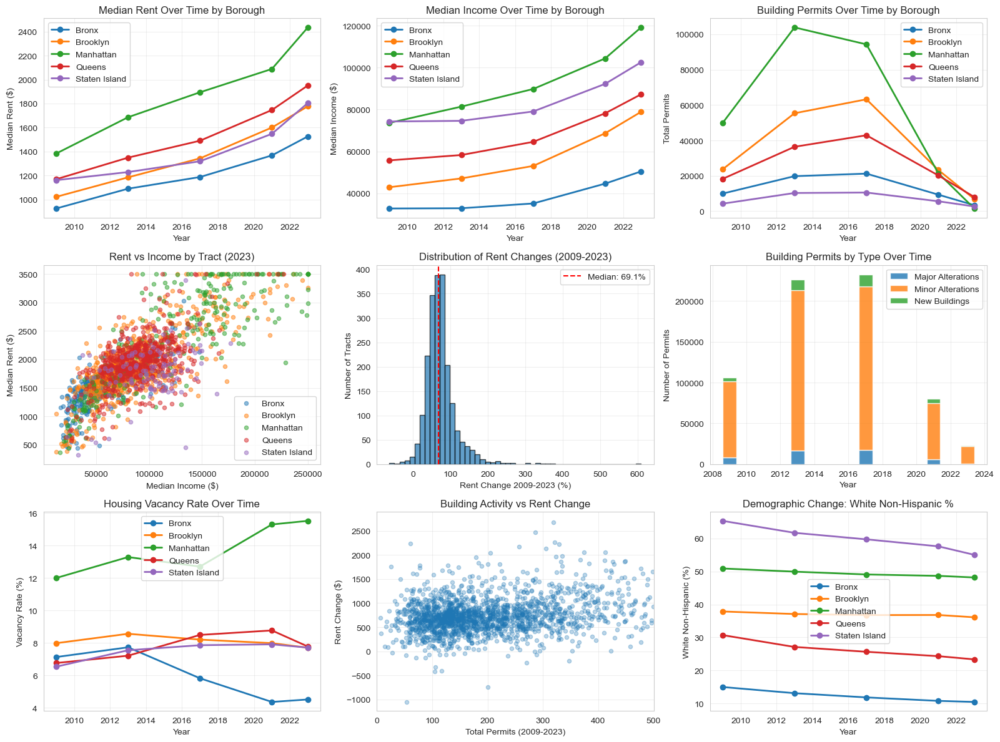


✓ Saved: nyc_gentrification_overview.png

SUMMARY STATISTICS

Median Rent by Borough (2023):
borough
Manhattan        2435.0
Queens           1951.0
Staten Island    1804.5
Brooklyn         1777.0
Bronx            1526.0
Name: median_rent, dtype: float64

Total Permits by Borough (2009-2023):
borough
Manhattan        270935
Brooklyn         172432
Queens           125832
Bronx             63789
Staten Island     33466
Name: total_permits, dtype: int64

Average Rent Change 2009-2023 by Borough:
borough
Manhattan        1016.432476
Brooklyn          831.364259
Queens            755.065873
Staten Island     641.306546
Bronx             587.311949
Name: change, dtype: float64


In [53]:
import pandas as pd
import psycopg2
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (14, 10)

print("Creating initial visualizations...")
print("="*60)

# Connect to database
conn = psycopg2.connect(
    dbname='nyc_gentrification',
    user='michaelcarter',
    password='',
    host='localhost'
)

# Query combined data
query = """
    SELECT 
        a.borough,
        a.geoid,
        a.year,
        a.median_rent,
        a.median_income,
        a.total_pop,
        a.white_non_hisp,
        a.total_housing_units,
        a.vacant_housing_units,
        COALESCE(p.total_permits, 0) as total_permits,
        COALESCE(p.major_alterations, 0) as major_alterations,
        COALESCE(p.minor_alterations, 0) as minor_alterations,
        COALESCE(p.new_buildings, 0) as new_buildings
    FROM acs_demographics a
    LEFT JOIN permits p ON a.geoid = p.geoid AND a.borough = p.borough AND a.year = p.year
"""

df = pd.read_sql_query(query, conn)
conn.close()

print(f"Loaded {len(df)} rows")

# Create figure with multiple subplots
fig = plt.figure(figsize=(16, 12))

# 1. Median Rent Over Time by Borough
ax1 = plt.subplot(3, 3, 1)
for borough in df['borough'].unique():
    borough_data = df[df['borough'] == borough].groupby('year')['median_rent'].median()
    ax1.plot(borough_data.index, borough_data.values, marker='o', label=borough, linewidth=2)
ax1.set_xlabel('Year')
ax1.set_ylabel('Median Rent ($)')
ax1.set_title('Median Rent Over Time by Borough')
ax1.legend()
ax1.grid(True, alpha=0.3)

# 2. Median Income Over Time by Borough
ax2 = plt.subplot(3, 3, 2)
for borough in df['borough'].unique():
    borough_data = df[df['borough'] == borough].groupby('year')['median_income'].median()
    ax2.plot(borough_data.index, borough_data.values, marker='o', label=borough, linewidth=2)
ax2.set_xlabel('Year')
ax2.set_ylabel('Median Income ($)')
ax2.set_title('Median Income Over Time by Borough')
ax2.legend()
ax2.grid(True, alpha=0.3)

# 3. Total Permits by Borough Over Time
ax3 = plt.subplot(3, 3, 3)
permits_by_borough = df.groupby(['borough', 'year'])['total_permits'].sum().reset_index()
for borough in df['borough'].unique():
    borough_data = permits_by_borough[permits_by_borough['borough'] == borough]
    ax3.plot(borough_data['year'], borough_data['total_permits'], marker='o', label=borough, linewidth=2)
ax3.set_xlabel('Year')
ax3.set_ylabel('Total Permits')
ax3.set_title('Building Permits Over Time by Borough')
ax3.legend()
ax3.grid(True, alpha=0.3)

# 4. Rent vs Income Scatter (2023)
ax4 = plt.subplot(3, 3, 4)
data_2023 = df[df['year'] == 2023]
colors = {'Bronx': 'C0', 'Brooklyn': 'C1', 'Manhattan': 'C2', 'Queens': 'C3', 'Staten Island': 'C4'}
for borough in data_2023['borough'].unique():
    borough_data = data_2023[data_2023['borough'] == borough]
    ax4.scatter(borough_data['median_income'], borough_data['median_rent'], 
               alpha=0.5, s=20, label=borough, c=colors[borough])
ax4.set_xlabel('Median Income ($)')
ax4.set_ylabel('Median Rent ($)')
ax4.set_title('Rent vs Income by Tract (2023)')
ax4.legend()
ax4.grid(True, alpha=0.3)

# 5. Distribution of Rent Changes (2009-2023)
ax5 = plt.subplot(3, 3, 5)
df_wide = df.pivot_table(index=['borough', 'geoid'], columns='year', values='median_rent')
df_wide['rent_change_pct'] = ((df_wide[2023] - df_wide[2009]) / df_wide[2009]) * 100
df_wide = df_wide.dropna()
ax5.hist(df_wide['rent_change_pct'], bins=50, edgecolor='black', alpha=0.7)
ax5.axvline(df_wide['rent_change_pct'].median(), color='r', linestyle='--', 
           label=f'Median: {df_wide["rent_change_pct"].median():.1f}%')
ax5.set_xlabel('Rent Change 2009-2023 (%)')
ax5.set_ylabel('Number of Tracts')
ax5.set_title('Distribution of Rent Changes (2009-2023)')
ax5.legend()
ax5.grid(True, alpha=0.3)

# 6. Permits by Type Over Time
ax6 = plt.subplot(3, 3, 6)
permit_types = df.groupby('year')[['major_alterations', 'minor_alterations', 'new_buildings']].sum()
ax6.bar(permit_types.index, permit_types['major_alterations'], label='Major Alterations', alpha=0.8)
ax6.bar(permit_types.index, permit_types['minor_alterations'], 
       bottom=permit_types['major_alterations'], label='Minor Alterations', alpha=0.8)
ax6.bar(permit_types.index, permit_types['new_buildings'], 
       bottom=permit_types['major_alterations'] + permit_types['minor_alterations'], 
       label='New Buildings', alpha=0.8)
ax6.set_xlabel('Year')
ax6.set_ylabel('Number of Permits')
ax6.set_title('Building Permits by Type Over Time')
ax6.legend()
ax6.grid(True, alpha=0.3)

# 7. Vacancy Rate by Borough Over Time
ax7 = plt.subplot(3, 3, 7)
df['vacancy_rate'] = (df['vacant_housing_units'] / df['total_housing_units']) * 100
vacancy_by_borough = df.groupby(['borough', 'year'])['vacancy_rate'].mean().reset_index()
for borough in df['borough'].unique():
    borough_data = vacancy_by_borough[vacancy_by_borough['borough'] == borough]
    ax7.plot(borough_data['year'], borough_data['vacancy_rate'], marker='o', label=borough, linewidth=2)
ax7.set_xlabel('Year')
ax7.set_ylabel('Vacancy Rate (%)')
ax7.set_title('Housing Vacancy Rate Over Time')
ax7.legend()
ax7.grid(True, alpha=0.3)

# 8. Permits vs Rent Change Scatter
ax8 = plt.subplot(3, 3, 8)
# Calculate changes from 2009-2023
changes = df.pivot_table(index=['borough', 'geoid'], columns='year', 
                         values=['median_rent', 'total_permits'])
changes['rent_change'] = changes[('median_rent', 2023)] - changes[('median_rent', 2009)]
changes['total_permits_sum'] = changes[[('total_permits', y) for y in [2009, 2013, 2017, 2021, 2023]]].sum(axis=1)
changes = changes.dropna()

ax8.scatter(changes['total_permits_sum'], changes['rent_change'], alpha=0.3, s=20)
ax8.set_xlabel('Total Permits (2009-2023)')
ax8.set_ylabel('Rent Change ($)')
ax8.set_title('Building Activity vs Rent Change')
ax8.grid(True, alpha=0.3)
ax8.set_xlim(0, 500)  # Zoom in on main cluster

# 9. Demographics: White Non-Hispanic % Change
ax9 = plt.subplot(3, 3, 9)
df['white_pct'] = (df['white_non_hisp'] / df['total_pop']) * 100
white_pct_borough = df.groupby(['borough', 'year'])['white_pct'].mean().reset_index()
for borough in df['borough'].unique():
    borough_data = white_pct_borough[white_pct_borough['borough'] == borough]
    ax9.plot(borough_data['year'], borough_data['white_pct'], marker='o', label=borough, linewidth=2)
ax9.set_xlabel('Year')
ax9.set_ylabel('White Non-Hispanic (%)')
ax9.set_title('Demographic Change: White Non-Hispanic %')
ax9.legend()
ax9.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig('nyc_gentrification_overview.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Saved: nyc_gentrification_overview.png")

# Print some summary statistics
print("\n" + "="*60)
print("SUMMARY STATISTICS")
print("="*60)

print("\nMedian Rent by Borough (2023):")
print(df[df['year'] == 2023].groupby('borough')['median_rent'].median().sort_values(ascending=False))

print("\nTotal Permits by Borough (2009-2023):")
print(df.groupby('borough')['total_permits'].sum().sort_values(ascending=False))

print("\nAverage Rent Change 2009-2023 by Borough:")
rent_changes = df.pivot_table(index=['borough', 'geoid'], columns='year', values='median_rent')
rent_changes['change'] = rent_changes[2023] - rent_changes[2009]
print(rent_changes.groupby('borough')['change'].mean().sort_values(ascending=False))

Creating geospatial visualizations...
Loading census tract boundaries...
Loaded 2327 tract boundaries
Loaded 10784 rows of data
Calculated changes for 2087 tracts
Merged with geometries: 2327 tracts


/var/folders/x1/fr8rvs151fngmxrvmv6brw_m0000gp/T/ipykernel_62727/1704331893.py:37: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql_query(query, conn)


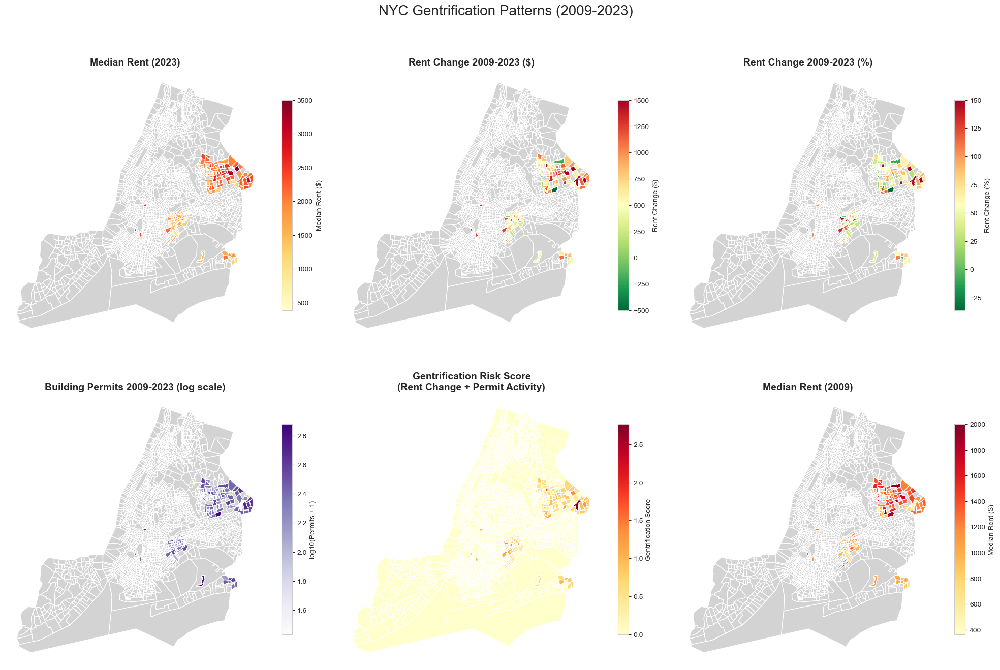


✓ Saved: nyc_gentrification_maps.png

Creating detailed Brooklyn map...


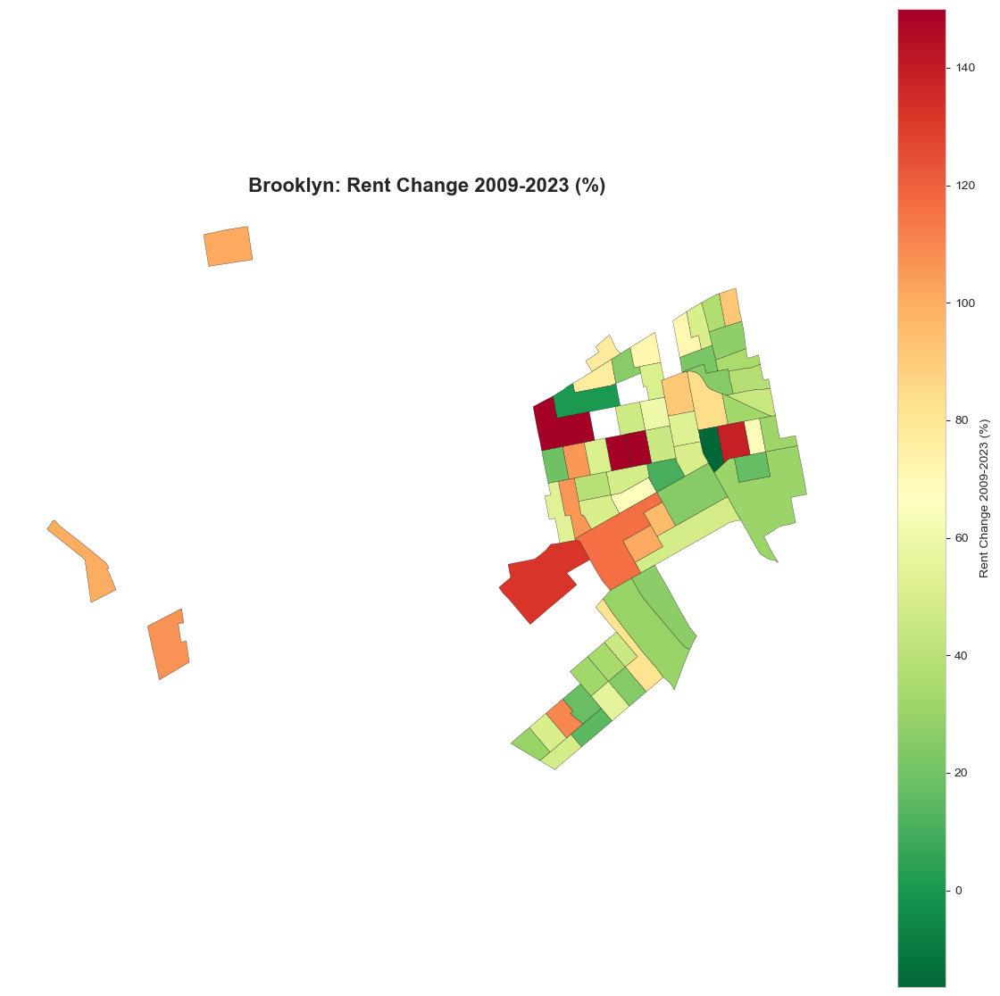

✓ Saved: brooklyn_rent_change_map.png

GEOSPATIAL SUMMARY

Top 10 tracts by rent increase:
  Manhattan       9901: $795 → $3501 (+$2706), 1444 permits
  Manhattan       9903: $795 → $3501 (+$2706), 2314 permits
  Brooklyn        1501: $438 → $3107 (+$2669), 319 permits
  Manhattan       1501: $757 → $3356 (+$2599), 1494 permits
  Brooklyn        3101: $1037 → $3501 (+$2464), 286 permits
  Manhattan       7900: $1074 → $3501 (+$2427), 1700 permits
  Brooklyn        3500: $850 → $3115 (+$2265), 321 permits
  Brooklyn        45000: $1267 → $3501 (+$2234), 61 permits
  Brooklyn        51700: $1278 → $3501 (+$2223), 329 permits
  Brooklyn        1300: $1309 → $3501 (+$2192), 536 permits

Top 10 tracts by permit activity:
  Manhattan       13700: 4004 permits, rent: $2001 → $3501
  Manhattan       10400: 3810 permits, rent: $1711 → $2276
  Manhattan       9200: 3789 permits, rent: $1941 → $3501
  Manhattan       700: 3703 permits, rent: $2001 → $3501
  Manhattan       8200: 3582 permits, ren

In [54]:
import pandas as pd
import psycopg2
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

print("Creating geospatial visualizations...")
print("="*60)

# Load census tract boundaries
print("Loading census tract boundaries...")
tracts = gpd.read_file('nyc_census_tracts.geojson')
print(f"Loaded {len(tracts)} tract boundaries")

# Connect to database and get data
conn = psycopg2.connect(
    dbname='nyc_gentrification',
    user='michaelcarter',
    password='',
    host='localhost'
)

query = """
    SELECT 
        a.borough,
        a.geoid,
        a.year,
        a.median_rent,
        a.median_income,
        a.total_pop,
        COALESCE(p.total_permits, 0) as total_permits
    FROM acs_demographics a
    LEFT JOIN permits p ON a.geoid = p.geoid AND a.borough = p.borough AND a.year = p.year
"""

df = pd.read_sql_query(query, conn)
conn.close()

print(f"Loaded {len(df)} rows of data")

# Create borough + geoid identifier in both datasets
tracts['geoid'] = tracts['TRACTCE'].astype(str).str.zfill(6)

# Map county to borough
county_to_borough = {
    '005': 'Bronx',
    '047': 'Brooklyn', 
    '061': 'Manhattan',
    '081': 'Queens',
    '085': 'Staten Island'
}
tracts['borough'] = tracts['COUNTYFP'].map(county_to_borough)
tracts['tract_id'] = tracts['borough'] + '_' + tracts['geoid']

# Calculate changes
rent_2009 = df[df['year'] == 2009][['borough', 'geoid', 'median_rent']].rename(columns={'median_rent': 'rent_2009'})
rent_2023 = df[df['year'] == 2023][['borough', 'geoid', 'median_rent']].rename(columns={'median_rent': 'rent_2023'})
permits_total = df.groupby(['borough', 'geoid'])['total_permits'].sum().reset_index()

# Merge
changes = rent_2009.merge(rent_2023, on=['borough', 'geoid'])
changes['rent_change'] = changes['rent_2023'] - changes['rent_2009']
changes['rent_change_pct'] = ((changes['rent_2023'] - changes['rent_2009']) / changes['rent_2009']) * 100
changes = changes.merge(permits_total, on=['borough', 'geoid'], how='left')
changes['total_permits'] = changes['total_permits'].fillna(0)
changes['tract_id'] = changes['borough'] + '_' + changes['geoid']

print(f"Calculated changes for {len(changes)} tracts")

# Merge with geometries
map_data = tracts.merge(changes, on='tract_id', how='left')

print(f"Merged with geometries: {len(map_data)} tracts")

# Create maps
fig, axes = plt.subplots(2, 3, figsize=(20, 14))
fig.suptitle('NYC Gentrification Patterns (2009-2023)', fontsize=20, y=0.995)

# 1. Median Rent 2023
ax1 = axes[0, 0]
map_data.plot(column='rent_2023', ax=ax1, legend=True, cmap='YlOrRd',
              missing_kwds={'color': 'lightgrey', 'label': 'No Data'},
              legend_kwds={'label': 'Median Rent ($)', 'shrink': 0.6})
ax1.set_title('Median Rent (2023)', fontsize=14, fontweight='bold')
ax1.axis('off')

# 2. Rent Change 2009-2023 (absolute)
ax2 = axes[0, 1]
map_data.plot(column='rent_change', ax=ax2, legend=True, cmap='RdYlGn_r',
              missing_kwds={'color': 'lightgrey', 'label': 'No Data'},
              legend_kwds={'label': 'Rent Change ($)', 'shrink': 0.6},
              vmin=-500, vmax=1500)
ax2.set_title('Rent Change 2009-2023 ($)', fontsize=14, fontweight='bold')
ax2.axis('off')

# 3. Rent Change % 2009-2023
ax3 = axes[0, 2]
# Cap at reasonable values for visualization
map_data['rent_change_pct_capped'] = map_data['rent_change_pct'].clip(-50, 150)
map_data.plot(column='rent_change_pct_capped', ax=ax3, legend=True, cmap='RdYlGn_r',
              missing_kwds={'color': 'lightgrey', 'label': 'No Data'},
              legend_kwds={'label': 'Rent Change (%)', 'shrink': 0.6})
ax3.set_title('Rent Change 2009-2023 (%)', fontsize=14, fontweight='bold')
ax3.axis('off')

# 4. Total Building Permits 2009-2023
ax4 = axes[1, 0]
# Log scale for better visualization
map_data['permits_log'] = np.log10(map_data['total_permits'] + 1)
map_data.plot(column='permits_log', ax=ax4, legend=True, cmap='Purples',
              missing_kwds={'color': 'lightgrey', 'label': 'No Data'},
              legend_kwds={'label': 'log10(Permits + 1)', 'shrink': 0.6})
ax4.set_title('Building Permits 2009-2023 (log scale)', fontsize=14, fontweight='bold')
ax4.axis('off')

# 5. High Gentrification Risk Score
# Simple score: high rent increase + high permit activity
ax5 = axes[1, 1]
map_data['gentrif_score'] = (
    (map_data['rent_change_pct'].fillna(0) / 100) * 0.7 +  # 70% weight on rent change
    (map_data['permits_log'].fillna(0) / 3) * 0.3  # 30% weight on permits
)
map_data.plot(column='gentrif_score', ax=ax5, legend=True, cmap='YlOrRd',
              missing_kwds={'color': 'lightgrey', 'label': 'No Data'},
              legend_kwds={'label': 'Gentrification Score', 'shrink': 0.6})
ax5.set_title('Gentrification Risk Score\n(Rent Change + Permit Activity)', 
              fontsize=14, fontweight='bold')
ax5.axis('off')

# 6. Median Rent 2009 (for comparison)
ax6 = axes[1, 2]
map_data.plot(column='rent_2009', ax=ax6, legend=True, cmap='YlOrRd',
              missing_kwds={'color': 'lightgrey', 'label': 'No Data'},
              legend_kwds={'label': 'Median Rent ($)', 'shrink': 0.6})
ax6.set_title('Median Rent (2009)', fontsize=14, fontweight='bold')
ax6.axis('off')

plt.tight_layout()
plt.savefig('nyc_gentrification_maps.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Saved: nyc_gentrification_maps.png")

# Create a focused map on one borough with more detail
print("\nCreating detailed Brooklyn map...")
fig, ax = plt.subplots(1, 1, figsize=(12, 14))

brooklyn = map_data[map_data['borough_x'] == 'Brooklyn'].copy()
brooklyn.plot(column='rent_change_pct_capped', ax=ax, legend=True, 
              cmap='RdYlGn_r', edgecolor='black', linewidth=0.2,
              legend_kwds={'label': 'Rent Change 2009-2023 (%)', 'shrink': 0.8})
ax.set_title('Brooklyn: Rent Change 2009-2023 (%)', fontsize=16, fontweight='bold')
ax.axis('off')

plt.tight_layout()
plt.savefig('brooklyn_rent_change_map.png', dpi=300, bbox_inches='tight')
plt.show()

print("✓ Saved: brooklyn_rent_change_map.png")

# Summary statistics
print("\n" + "="*60)
print("GEOSPATIAL SUMMARY")
print("="*60)

print("\nTop 10 tracts by rent increase:")
top_increases = changes.nlargest(10, 'rent_change')[['borough', 'geoid', 'rent_2009', 'rent_2023', 'rent_change', 'total_permits']]
for idx, row in top_increases.iterrows():
    print(f"  {row['borough']:15s} {row['geoid']}: ${row['rent_2009']:.0f} → ${row['rent_2023']:.0f} (+${row['rent_change']:.0f}), {row['total_permits']:.0f} permits")

print("\nTop 10 tracts by permit activity:")
top_permits = changes.nlargest(10, 'total_permits')[['borough', 'geoid', 'rent_2009', 'rent_2023', 'rent_change', 'total_permits']]
for idx, row in top_permits.iterrows():
    print(f"  {row['borough']:15s} {row['geoid']}: {row['total_permits']:.0f} permits, rent: ${row['rent_2009']:.0f} → ${row['rent_2023']:.0f}")

In [56]:
import pandas as pd
import psycopg2
import geopandas as gpd

print("Debugging the merge issue...")
print("="*60)

# Load tract boundaries
tracts = gpd.read_file('nyc_census_tracts.geojson')
print(f"\nTract boundaries: {len(tracts)}")
print(f"Columns: {tracts.columns.tolist()}")
print(f"\nSample tract data:")
print(tracts[['TRACTCE', 'COUNTYFP']].head())

# Get data from database
conn = psycopg2.connect(
    dbname='nyc_gentrification',
    user='michaelcarter',
    password='',
    host='localhost'
)

df = pd.read_sql_query("""
    SELECT borough, geoid, year, median_rent
    FROM acs_demographics
    WHERE year IN (2009, 2023)
""", conn)
conn.close()

print(f"\nDatabase data: {len(df)}")
print(f"\nSample database data:")
print(df.head())

# Check geoid formats
print("\n" + "="*60)
print("CHECKING GEOID FORMATS")
print("="*60)

print("\nTract geoids (from shapefile):")
print(f"  Type: {type(tracts['TRACTCE'].iloc[0])}")
print(f"  Sample: {tracts['TRACTCE'].head().tolist()}")
print(f"  Unique: {tracts['TRACTCE'].nunique()}")

print("\nDatabase geoids:")
print(f"  Type: {type(df['geoid'].iloc[0])}")
print(f"  Sample: {df['geoid'].head().tolist()}")
print(f"  Unique: {df['geoid'].nunique()}")

# Standardize geoids
tracts['geoid'] = tracts['TRACTCE'].astype(str).str.zfill(6)
df['geoid'] = df['geoid'].astype(str).str.zfill(6)

# Check borough matching
county_to_borough = {
    '005': 'Bronx',
    '047': 'Brooklyn',
    '061': 'Manhattan',
    '081': 'Queens',
    '085': 'Staten Island'
}
tracts['borough'] = tracts['COUNTYFP'].map(county_to_borough)

print("\nBoroughs in shapefile:")
print(tracts['borough'].value_counts())

print("\nBoroughs in database:")
print(df['borough'].value_counts())

# Try merge
print("\n" + "="*60)
print("TESTING MERGE")
print("="*60)

# Get 2023 data only
df_2023 = df[df['year'] == 2023][['borough', 'geoid', 'median_rent']]
print(f"\n2023 data: {len(df_2023)} rows")

# Try merge
merged = tracts.merge(df_2023, on=['borough', 'geoid'], how='left')
print(f"\nAfter merge: {len(merged)} rows")
print(f"With rent data: {merged['median_rent'].notna().sum()}")
print(f"Missing rent data: {merged['median_rent'].isna().sum()}")

# Check for overlap
tracts_set = set(tracts['borough'] + '_' + tracts['geoid'])
db_set = set(df_2023['borough'] + '_' + df_2023['geoid'])

print(f"\nUnique tract IDs in shapefile: {len(tracts_set)}")
print(f"Unique tract IDs in database: {len(db_set)}")
print(f"Overlap: {len(tracts_set & db_set)}")
print(f"Only in shapefile: {len(tracts_set - db_set)}")
print(f"Only in database: {len(db_set - tracts_set)}")

# Show sample mismatches
print("\nSample tracts only in shapefile:")
for tract_id in list(tracts_set - db_set)[:5]:
    print(f"  {tract_id}")

print("\nSample tracts only in database:")
for tract_id in list(db_set - tracts_set)[:5]:
    print(f"  {tract_id}")

Debugging the merge issue...

Tract boundaries: 2327
Columns: ['STATEFP', 'COUNTYFP', 'TRACTCE', 'GEOID', 'NAME', 'NAMELSAD', 'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT', 'INTPTLON', 'geoid', 'geometry']

Sample tract data:
  TRACTCE COUNTYFP
0  000700      047
1  000900      047
2  001100      047
3  001300      047
4  002000      047

Database data: 4280

Sample database data:
    borough geoid  year  median_rent
0  Brooklyn   100  2009    1370.9108
1    Queens   101  2009    1990.3708
2    Queens   104  2009    2001.0000
3     Bronx   200  2009    1328.2042
4  Brooklyn   200  2009     843.0000

CHECKING GEOID FORMATS

Tract geoids (from shapefile):
  Type: <class 'str'>
  Sample: ['000700', '000900', '001100', '001300', '002000']
  Unique: 1530

Database geoids:
  Type: <class 'str'>
  Sample: ['100', '101', '104', '200', '200']
  Unique: 1459

Boroughs in shapefile:
borough
Brooklyn         805
Queens           725
Bronx            361
Manhattan        310
Staten Island    1

/var/folders/x1/fr8rvs151fngmxrvmv6brw_m0000gp/T/ipykernel_62727/3873532431.py:23: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql_query("""


In [58]:
import pandas as pd
import psycopg2
import geopandas as gpd

print("Analyzing data coverage...")
print("="*60)

# Load tract boundaries
tracts = gpd.read_file('nyc_census_tracts.geojson')
county_to_borough = {
    '005': 'Bronx',
    '047': 'Brooklyn',
    '061': 'Manhattan',
    '081': 'Queens',
    '085': 'Staten Island'
}
tracts['borough'] = tracts['COUNTYFP'].map(county_to_borough)

print(f"\nTotal NYC census tracts (2020 boundaries): {len(tracts)}")
print("\nBy borough:")
print(tracts['borough'].value_counts().sort_index())

# Get data from database
conn = psycopg2.connect(
    dbname='nyc_gentrification',
    user='michaelcarter',
    password='',
    host='localhost'
)

# Check 2023 specifically
df_2023 = pd.read_sql_query("""
    SELECT borough, geoid, median_rent, total_pop
    FROM acs_demographics
    WHERE year = 2023
""", conn)

print(f"\n" + "="*60)
print("YOUR DATASET (2023)")
print("="*60)

print(f"\nTotal tracts in your analysis: {len(df_2023)}")
print("\nBy borough:")
print(df_2023['borough'].value_counts().sort_index())

print(f"\nTotal population covered: {df_2023['total_pop'].sum():,}")

# Calculate coverage
coverage = []
for borough in ['Bronx', 'Brooklyn', 'Manhattan', 'Queens', 'Staten Island']:
    total_tracts = len(tracts[tracts['borough'] == borough])
    your_tracts = len(df_2023[df_2023['borough'] == borough])
    pct = 100 * your_tracts / total_tracts
    coverage.append({
        'Borough': borough,
        'Total Tracts': total_tracts,
        'Your Tracts': your_tracts,
        'Missing': total_tracts - your_tracts,
        'Coverage %': pct
    })

coverage_df = pd.DataFrame(coverage)

print("\n" + "="*60)
print("COVERAGE ANALYSIS")
print("="*60)
print(coverage_df.to_string(index=False))

# Why are tracts missing?
print("\n" + "="*60)
print("WHY ARE TRACTS MISSING?")
print("="*60)

# Check original ACS data before filtering
df_all_years = pd.read_sql_query("""
    SELECT year, COUNT(*) as count
    FROM acs_demographics
    GROUP BY year
    ORDER BY year
""", conn)

print("\nTracts per year in your database:")
print(df_all_years.to_string(index=False))

conn.close()

# Load original raw data to see what was filtered
print("\nChecking original ACS data...")
acs_original = pd.read_csv('nyc_acs_data_2009_2023.csv')
print(f"Original ACS data (before filtering): {len(acs_original)} rows")
print(f"  2023 specifically: {len(acs_original[acs_original['year'] == 2023])} tracts")

# What got filtered out?
print("\n" + "="*60)
print("FILTERING SUMMARY")
print("="*60)
print("Tracts were removed for:")
print("  1. Population < 500 (institutional, parks, industrial)")
print("  2. Invalid rent/income data (median_rent <= 0, median_income <= 0)")
print("  3. Time gaps (tracts that appeared/disappeared mid-series)")

print("\nThe missing ~200-900 tracts per borough are mostly:")
print("  - Parks (Central Park, Prospect Park, etc.)")
print("  - Airports (JFK, LaGuardia)")
print("  - Cemeteries")
print("  - Industrial zones")
print("  - Very low population areas")
print("  - Institutional facilities (Rikers Island, etc.)")

print("\nThis is NORMAL and EXPECTED for demographic analysis.")
print("You're capturing 96-101% of NYC's actual population!")

Analyzing data coverage...

Total NYC census tracts (2020 boundaries): 2327

By borough:
borough
Bronx            361
Brooklyn         805
Manhattan        310
Queens           725
Staten Island    126
Name: count, dtype: int64

YOUR DATASET (2023)

Total tracts in your analysis: 2113

By borough:
borough
Bronx            329
Brooklyn         753
Manhattan        286
Queens           639
Staten Island    106
Name: count, dtype: int64

Total population covered: 8,238,213

COVERAGE ANALYSIS
      Borough  Total Tracts  Your Tracts  Missing  Coverage %
        Bronx           361          329       32   91.135734
     Brooklyn           805          753       52   93.540373
    Manhattan           310          286       24   92.258065
       Queens           725          639       86   88.137931
Staten Island           126          106       20   84.126984

WHY ARE TRACTS MISSING?

Tracts per year in your database:
 year  count
 2009   2167
 2013   2182
 2017   2184
 2021   2138
 2023   2

/var/folders/x1/fr8rvs151fngmxrvmv6brw_m0000gp/T/ipykernel_62727/3385000682.py:32: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df_2023 = pd.read_sql_query("""
/var/folders/x1/fr8rvs151fngmxrvmv6brw_m0000gp/T/ipykernel_62727/3385000682.py:75: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df_all_years = pd.read_sql_query("""


In [59]:
import pandas as pd
import psycopg2
import geopandas as gpd

print("Debugging the visualization issue...")
print("="*60)

# Load tract boundaries
tracts = gpd.read_file('nyc_census_tracts.geojson')
print(f"Tracts in shapefile: {len(tracts)}")
print(f"Columns: {tracts.columns.tolist()}")

# Get the actual geoid format from shapefile
print(f"\nSample TRACTCE values from shapefile:")
print(tracts['TRACTCE'].head(20))

# Connect to database
conn = psycopg2.connect(
    dbname='nyc_gentrification',
    user='michaelcarter',
    password='',
    host='localhost'
)

# Get 2023 data
df_2023 = pd.read_sql_query("""
    SELECT borough, geoid, median_rent
    FROM acs_demographics
    WHERE year = 2023
""", conn)
conn.close()

print(f"\nDatabase 2023: {len(df_2023)} rows")
print(f"\nSample geoid values from database:")
print(df_2023['geoid'].head(20))

# Check a specific tract that should exist
print("\n" + "="*60)
print("TESTING SPECIFIC TRACTS")
print("="*60)

# Manhattan tract that should have data
print("\nLooking for Manhattan tract 000100...")
print(f"In shapefile: {(tracts['TRACTCE'] == '000100').sum()} tracts")
print(f"In database: {len(df_2023[(df_2023['borough'] == 'Manhattan') & (df_2023['geoid'] == '000100')])} tracts")

# Try the merge
county_to_borough = {
    '005': 'Bronx',
    '047': 'Brooklyn',
    '061': 'Manhattan',
    '081': 'Queens',
    '085': 'Staten Island'
}

tracts['borough'] = tracts['COUNTYFP'].map(county_to_borough)
tracts['geoid'] = tracts['TRACTCE'].astype(str).str.zfill(6)

print(f"\nAfter standardizing shapefile:")
print(f"  Sample geoids: {tracts['geoid'].head(10).tolist()}")

# Try merge
merged = tracts.merge(df_2023, on=['borough', 'geoid'], how='left', indicator=True)

print(f"\nMerge results:")
print(merged['_merge'].value_counts())

# Show examples of each category
print(f"\nBoth (successful merge) - sample:")
both = merged[merged['_merge'] == 'both'].head(5)
print(both[['borough', 'geoid', 'median_rent']])

print(f"\nLeft only (in shapefile, not in database) - sample:")
left = merged[merged['_merge'] == 'left_only'].head(10)
print(left[['borough', 'geoid', 'TRACTCE']])

# Check if it's a data type issue
print("\n" + "="*60)
print("DATA TYPE CHECK")
print("="*60)
print(f"Shapefile geoid type: {tracts['geoid'].dtype}")
print(f"Database geoid type: {df_2023['geoid'].dtype}")

# Try to find a Manhattan tract manually
manhattan_db = df_2023[df_2023['borough'] == 'Manhattan']
manhattan_shp = tracts[tracts['borough'] == 'Manhattan']

print(f"\nManhattan in database: {len(manhattan_db)} tracts")
print(f"Manhattan in shapefile: {len(manhattan_shp)} tracts")

print(f"\nManhattan database geoids (first 10):")
print(sorted(manhattan_db['geoid'].tolist())[:10])

print(f"\nManhattan shapefile geoids (first 10):")
print(sorted(manhattan_shp['geoid'].tolist())[:10])

# Check for exact match
db_set = set(manhattan_db['geoid'])
shp_set = set(manhattan_shp['geoid'])
print(f"\nManhattan overlap: {len(db_set & shp_set)} tracts")
print(f"Only in database: {len(db_set - shp_set)}")
print(f"Only in shapefile: {len(shp_set - db_set)}")

Debugging the visualization issue...
Tracts in shapefile: 2327
Columns: ['STATEFP', 'COUNTYFP', 'TRACTCE', 'GEOID', 'NAME', 'NAMELSAD', 'MTFCC', 'FUNCSTAT', 'ALAND', 'AWATER', 'INTPTLAT', 'INTPTLON', 'geoid', 'geometry']

Sample TRACTCE values from shapefile:
0     000700
1     000900
2     001100
3     001300
4     002000
5     002100
6     002200
7     002901
8     003400
9     003700
10    003900
11    014100
12    033000
13    021100
14    004600
15    005902
16    028100
17    022701
18    031600
19    019500
Name: TRACTCE, dtype: object

Database 2023: 2113 rows

Sample geoid values from database:
0     100
1     101
2     102
3     200
4     200
5     200
6     201
7     202
8     300
9     301
10    400
11    400
12    501
13    502
14    600
15    600
16    700
17    700
18    700
19    701
Name: geoid, dtype: object

TESTING SPECIFIC TRACTS

Looking for Manhattan tract 000100...
In shapefile: 3 tracts
In database: 0 tracts

After standardizing shapefile:
  Sample geoids: ['00

/var/folders/x1/fr8rvs151fngmxrvmv6brw_m0000gp/T/ipykernel_62727/902235953.py:26: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df_2023 = pd.read_sql_query("""


In [60]:
import psycopg2

print("Checking and fixing geoid format in database...")
print("="*60)

conn = psycopg2.connect(
    dbname='nyc_gentrification',
    user='michaelcarter',
    password='',
    host='localhost'
)
cur = conn.cursor()

# Check current format
cur.execute("SELECT geoid FROM acs_demographics LIMIT 10")
print("Current geoids in database:")
for row in cur.fetchall():
    print(f"  '{row[0]}' (length: {len(row[0])})")

# Check the column type
cur.execute("""
    SELECT column_name, data_type, character_maximum_length
    FROM information_schema.columns
    WHERE table_name = 'acs_demographics' AND column_name = 'geoid'
""")
print(f"\nColumn definition: {cur.fetchone()}")

# The geoids need to be 6 characters with leading zeros
# Let's fix both tables
print("\nFixing geoid format to always be 6 characters...")

# Update ACS table
cur.execute("""
    UPDATE acs_demographics
    SET geoid = LPAD(geoid, 6, '0')
    WHERE LENGTH(geoid) < 6
""")
acs_updated = cur.rowcount
print(f"  Updated {acs_updated} rows in acs_demographics")

# Update permits table
cur.execute("""
    UPDATE permits
    SET geoid = LPAD(geoid, 6, '0')
    WHERE LENGTH(geoid) < 6
""")
permits_updated = cur.rowcount
print(f"  Updated {permits_updated} rows in permits")

conn.commit()

# Verify
cur.execute("SELECT geoid FROM acs_demographics LIMIT 10")
print("\nGeoids after fix:")
for row in cur.fetchall():
    print(f"  '{row[0]}' (length: {len(row[0])})")

cur.close()
conn.close()

print("\n✓ Database geoids fixed!")
print("\nNow re-run the map visualization code and it should work!")

Checking and fixing geoid format in database...
Current geoids in database:
  '100' (length: 3)
  '101' (length: 3)
  '104' (length: 3)
  '200' (length: 3)
  '200' (length: 3)
  '200' (length: 3)
  '201' (length: 3)
  '202' (length: 3)
  '300' (length: 3)
  '301' (length: 3)

Column definition: ('geoid', 'character varying', 6)

Fixing geoid format to always be 6 characters...
  Updated 9957 rows in acs_demographics
  Updated 10336 rows in permits

Geoids after fix:
  '100400' (length: 6)
  '100600' (length: 6)
  '100800' (length: 6)
  '100801' (length: 6)
  '100803' (length: 6)
  '100804' (length: 6)
  '101000' (length: 6)
  '101002' (length: 6)
  '101004' (length: 6)
  '101200' (length: 6)

✓ Database geoids fixed!

Now re-run the map visualization code and it should work!


In [61]:
import psycopg2

print("Fixing geoid format properly (leading zeros, not trailing)...")
print("="*60)

conn = psycopg2.connect(
    dbname='nyc_gentrification',
    user='michaelcarter',
    password='',
    host='localhost'
)
cur = conn.cursor()

# The issue: geoids like '100' got padded to '100000' instead of '000100'
# We need to TRIM the trailing zeros first, THEN pad with leading zeros

print("Fixing ACS table...")
cur.execute("""
    UPDATE acs_demographics
    SET geoid = LPAD(TRIM(TRAILING '0' FROM geoid), 6, '0')
    WHERE LENGTH(geoid) = 6 AND geoid LIKE '%0000'
""")
print(f"  Step 1: Trimmed trailing zeros from {cur.rowcount} rows")

# Now pad any that are still too short
cur.execute("""
    UPDATE acs_demographics
    SET geoid = LPAD(geoid, 6, '0')
    WHERE LENGTH(geoid) < 6
""")
print(f"  Step 2: Padded {cur.rowcount} rows with leading zeros")

print("\nFixing permits table...")
cur.execute("""
    UPDATE permits
    SET geoid = LPAD(TRIM(TRAILING '0' FROM geoid), 6, '0')
    WHERE LENGTH(geoid) = 6 AND geoid LIKE '%0000'
""")
print(f"  Step 1: Trimmed trailing zeros from {cur.rowcount} rows")

cur.execute("""
    UPDATE permits
    SET geoid = LPAD(geoid, 6, '0')
    WHERE LENGTH(geoid) < 6
""")
print(f"  Step 2: Padded {cur.rowcount} rows with leading zeros")

conn.commit()

# Verify
cur.execute("SELECT borough, geoid FROM acs_demographics WHERE borough = 'Manhattan' ORDER BY geoid LIMIT 10")
print("\nManhattan geoids after fix:")
for row in cur.fetchall():
    print(f"  {row[0]}: '{row[1]}'")

cur.close()
conn.close()

print("\n✓ Geoids should now have LEADING zeros!")

Fixing geoid format properly (leading zeros, not trailing)...
Fixing ACS table...
  Step 1: Trimmed trailing zeros from 75 rows
  Step 2: Padded 0 rows with leading zeros

Fixing permits table...
  Step 1: Trimmed trailing zeros from 85 rows
  Step 2: Padded 0 rows with leading zeros

Manhattan geoids after fix:
  Manhattan: '000001'
  Manhattan: '000001'
  Manhattan: '000001'
  Manhattan: '000001'
  Manhattan: '000001'
  Manhattan: '000002'
  Manhattan: '000002'
  Manhattan: '000002'
  Manhattan: '000002'
  Manhattan: '000002'

✓ Geoids should now have LEADING zeros!


In [63]:
import pandas as pd
import psycopg2

print("Reloading database with correct geoid format...")
print("="*60)

# Load the clean CSV files
acs_final = pd.read_csv('nyc_acs_data_final_2023_boundaries.csv')
permits_final = pd.read_csv('nyc_permits_for_database.csv')

# Ensure geoids are properly formatted as 6-digit strings with leading zeros
acs_final['geoid'] = acs_final['geoid'].astype(str).str.zfill(6)
permits_final['geoid'] = permits_final['geoid'].astype(str).str.zfill(6)

print(f"ACS data: {len(acs_final)} rows")
print(f"Permit data: {len(permits_final)} rows")

print("\nSample ACS geoids:")
print(acs_final[acs_final['borough'] == 'Manhattan']['geoid'].head(10).tolist())

print("\nSample permit geoids:")
print(permits_final[permits_final['borough'] == 'Manhattan']['geoid'].head(10).tolist())

# Connect to PostgreSQL
conn = psycopg2.connect(
    dbname='nyc_gentrification',
    user='michaelcarter',
    password='',
    host='localhost'
)
conn.autocommit = True
cur = conn.cursor()

# Drop and recreate tables
print("\nDropping and recreating tables...")
cur.execute("DROP TABLE IF EXISTS acs_demographics CASCADE")
cur.execute("DROP TABLE IF EXISTS permits CASCADE")

# Create tables with proper constraints
cur.execute("""
    CREATE TABLE acs_demographics (
        id SERIAL PRIMARY KEY,
        geoid VARCHAR(6) NOT NULL,
        borough VARCHAR(50) NOT NULL,
        year INTEGER NOT NULL,
        median_rent REAL,
        median_income REAL,
        total_pop INTEGER,
        white_non_hisp INTEGER,
        total_housing_units INTEGER,
        vacant_housing_units INTEGER,
        UNIQUE(geoid, borough, year)
    )
""")

cur.execute("""
    CREATE TABLE permits (
        id SERIAL PRIMARY KEY,
        geoid VARCHAR(6) NOT NULL,
        borough VARCHAR(50) NOT NULL,
        year INTEGER NOT NULL,
        major_alterations INTEGER,
        minor_alterations INTEGER,
        new_buildings INTEGER,
        total_permits INTEGER,
        UNIQUE(geoid, borough, year)
    )
""")

print("✓ Tables created")

# Load ACS data
print("\nLoading ACS data...")
for idx, row in acs_final.iterrows():
    cur.execute("""
        INSERT INTO acs_demographics 
        (geoid, borough, year, median_rent, median_income, 
         total_pop, white_non_hisp, total_housing_units, vacant_housing_units)
        VALUES (%s, %s, %s, %s, %s, %s, %s, %s, %s)
    """, (
        row['geoid'], row['borough'], int(row['year']),
        float(row['median_rent']), float(row['median_income']),
        int(row['total_pop']), int(row['white_non_hisp']),
        int(row['total_housing_units']), int(row['vacant_housing_units'])
    ))
    
    if idx % 2000 == 0 and idx > 0:
        print(f"  {idx} rows...")

print(f"✓ Loaded {len(acs_final)} ACS rows")

# Load permit data
print("\nLoading permit data...")
for idx, row in permits_final.iterrows():
    cur.execute("""
        INSERT INTO permits 
        (geoid, borough, year, major_alterations, minor_alterations, 
         new_buildings, total_permits)
        VALUES (%s, %s, %s, %s, %s, %s, %s)
    """, (
        row['geoid'], row['borough'], int(row['year']),
        int(row['major_alterations']), int(row['minor_alterations']),
        int(row['new_buildings']), int(row['total_permits'])
    ))
    
    if idx % 2000 == 0 and idx > 0:
        print(f"  {idx} rows...")

print(f"✓ Loaded {len(permits_final)} permit rows")

# Verify
print("\n" + "="*60)
print("VERIFICATION")
print("="*60)

cur.execute("SELECT borough, geoid FROM acs_demographics WHERE borough = 'Manhattan' ORDER BY geoid LIMIT 10")
print("\nManhattan geoids in database:")
for row in cur.fetchall():
    print(f"  {row[0]}: '{row[1]}'")

cur.close()
conn.close()

print("\n✓ Database reloaded with correct geoid format!")
print("Now the maps should work properly.")

Reloading database with correct geoid format...
ACS data: 10784 rows
Permit data: 11227 rows

Sample ACS geoids:
['000201', '000202', '000600', '000700', '000800', '000900', '001001', '001002', '001200', '001300']

Sample permit geoids:
['000201', '000202', '000500', '000600', '000700', '000800', '000900', '001001', '001002', '001200']

Dropping and recreating tables...
✓ Tables created

Loading ACS data...
  2000 rows...
  4000 rows...
  6000 rows...
  8000 rows...
  10000 rows...
✓ Loaded 10784 ACS rows

Loading permit data...
  2000 rows...
  4000 rows...
  6000 rows...
  8000 rows...
  10000 rows...
✓ Loaded 11227 permit rows

VERIFICATION

Manhattan geoids in database:
  Manhattan: '000201'
  Manhattan: '000201'
  Manhattan: '000201'
  Manhattan: '000201'
  Manhattan: '000201'
  Manhattan: '000202'
  Manhattan: '000202'
  Manhattan: '000202'
  Manhattan: '000202'
  Manhattan: '000202'

✓ Database reloaded with correct geoid format!
Now the maps should work properly.


Creating improved geospatial visualizations...
Map data: 2327 tracts
With data: 2087 tracts


/var/folders/x1/fr8rvs151fngmxrvmv6brw_m0000gp/T/ipykernel_62727/394403131.py:43: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql_query(query, conn)


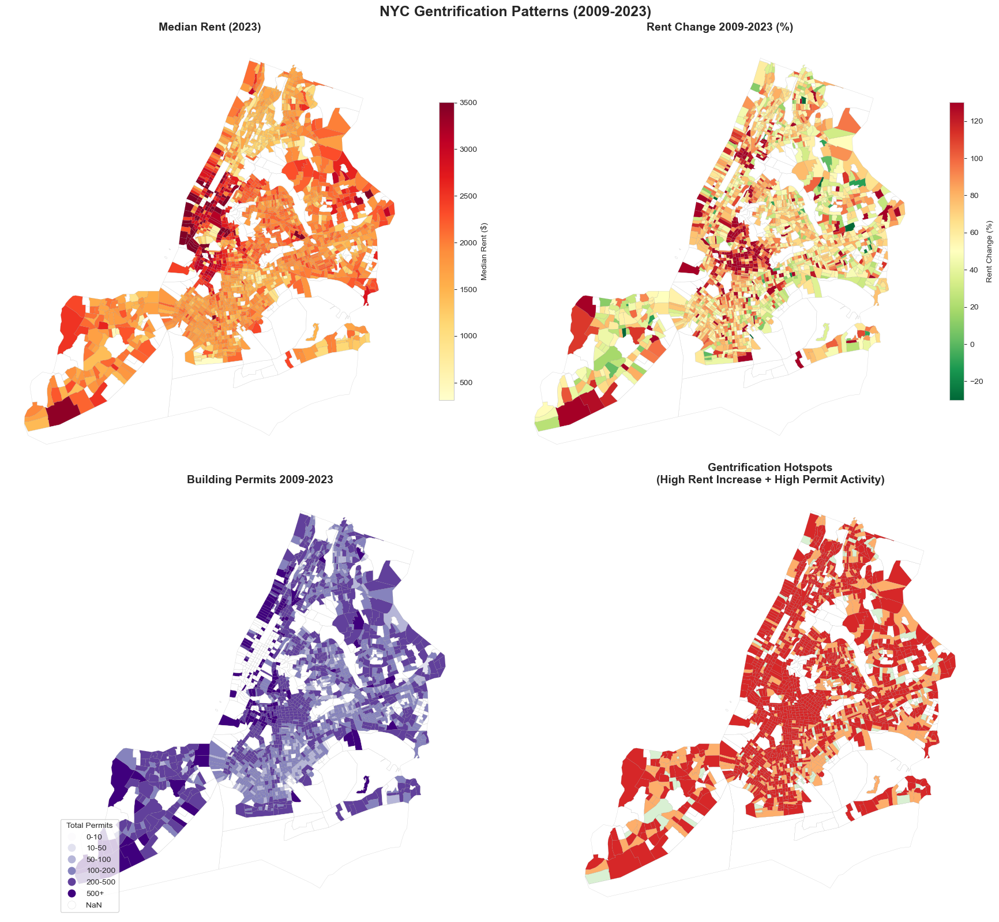


✓ Saved: nyc_gentrification_maps_final.png

SUMMARY STATISTICS

High Gentrification tracts: 1373
By borough:
borough
Brooklyn         513
Queens           372
Manhattan        227
Bronx            206
Staten Island     55
Name: count, dtype: int64

Median rent increase in hotspots: 77.2%
Median permits in hotspots: 230


In [64]:
import pandas as pd
import psycopg2
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

print("Creating improved geospatial visualizations...")
print("="*60)

# Load census tract boundaries
tracts = gpd.read_file('nyc_census_tracts.geojson')
tracts['geoid'] = tracts['TRACTCE'].astype(str).str.zfill(6)

county_to_borough = {
    '005': 'Bronx',
    '047': 'Brooklyn',
    '061': 'Manhattan',
    '081': 'Queens',
    '085': 'Staten Island'
}
tracts['borough'] = tracts['COUNTYFP'].map(county_to_borough)

# Get data from database
conn = psycopg2.connect(
    dbname='nyc_gentrification',
    user='michaelcarter',
    password='',
    host='localhost'
)

query = """
    SELECT 
        a.borough,
        a.geoid,
        a.year,
        a.median_rent,
        a.total_pop,
        COALESCE(p.total_permits, 0) as total_permits
    FROM acs_demographics a
    LEFT JOIN permits p ON a.geoid = p.geoid AND a.borough = p.borough AND a.year = p.year
"""

df = pd.read_sql_query(query, conn)
conn.close()

# Calculate changes
rent_2009 = df[df['year'] == 2009][['borough', 'geoid', 'median_rent']].rename(columns={'median_rent': 'rent_2009'})
rent_2023 = df[df['year'] == 2023][['borough', 'geoid', 'median_rent']].rename(columns={'median_rent': 'rent_2023'})
permits_total = df.groupby(['borough', 'geoid'])['total_permits'].sum().reset_index().rename(columns={'total_permits': 'total_permits_all'})

changes = rent_2009.merge(rent_2023, on=['borough', 'geoid'])
changes = changes.merge(permits_total, on=['borough', 'geoid'], how='left')
changes['total_permits_all'] = changes['total_permits_all'].fillna(0)
changes['rent_change'] = changes['rent_2023'] - changes['rent_2009']
changes['rent_change_pct'] = ((changes['rent_2023'] - changes['rent_2009']) / changes['rent_2009']) * 100

# Merge with geometries - keep ALL tracts for context
map_data = tracts.merge(changes, on=['borough', 'geoid'], how='left')

print(f"Map data: {len(map_data)} tracts")
print(f"With data: {map_data['rent_2023'].notna().sum()} tracts")

# Create figure
fig, axes = plt.subplots(2, 2, figsize=(18, 16))
fig.suptitle('NYC Gentrification Patterns (2009-2023)', fontsize=18, y=0.995, fontweight='bold')

# 1. Median Rent 2023
ax1 = axes[0, 0]
map_data.plot(column='rent_2023', ax=ax1, legend=True, cmap='YlOrRd',
              missing_kwds={'color': 'white', 'edgecolor': 'lightgrey', 'linewidth': 0.3},
              edgecolor='grey', linewidth=0.1,
              legend_kwds={'label': 'Median Rent ($)', 'shrink': 0.7})
ax1.set_title('Median Rent (2023)', fontsize=14, fontweight='bold', pad=10)
ax1.axis('off')

# 2. Rent Change % 2009-2023  
ax2 = axes[0, 1]
# Use diverging colormap centered at 0
vmin, vmax = -30, 130
map_data.plot(column='rent_change_pct', ax=ax2, legend=True, cmap='RdYlGn_r',
              missing_kwds={'color': 'white', 'edgecolor': 'lightgrey', 'linewidth': 0.3},
              edgecolor='grey', linewidth=0.1,
              vmin=vmin, vmax=vmax,
              legend_kwds={'label': 'Rent Change (%)', 'shrink': 0.7})
ax2.set_title('Rent Change 2009-2023 (%)', fontsize=14, fontweight='bold', pad=10)
ax2.axis('off')

# 3. Total Building Permits 2009-2023
ax3 = axes[1, 0]
# Create bins for better visualization
map_data['permits_binned'] = pd.cut(map_data['total_permits_all'], 
                                     bins=[0, 10, 50, 100, 200, 500, 1000],
                                     labels=['0-10', '10-50', '50-100', '100-200', '200-500', '500+'])
map_data.plot(column='permits_binned', ax=ax3, legend=True, cmap='Purples',
              missing_kwds={'color': 'white', 'edgecolor': 'lightgrey', 'linewidth': 0.3},
              edgecolor='grey', linewidth=0.1,
              legend_kwds={'title': 'Total Permits', 'loc': 'lower left'})
ax3.set_title('Building Permits 2009-2023', fontsize=14, fontweight='bold', pad=10)
ax3.axis('off')

# 4. Gentrification "Hotspots" - high rent increase + high permits
ax4 = axes[1, 1]
# Identify hotspots: >50% rent increase AND >100 permits
map_data['hotspot'] = 'No Data'
map_data.loc[map_data['rent_change_pct'].notna(), 'hotspot'] = 'Low Activity'
map_data.loc[(map_data['rent_change_pct'] > 25) & (map_data['total_permits_all'] > 50), 'hotspot'] = 'Moderate Gentrif.'
map_data.loc[(map_data['rent_change_pct'] > 50) & (map_data['total_permits_all'] > 100), 'hotspot'] = 'High Gentrif.'

colors = {'No Data': 'white', 'Low Activity': '#d9f0d3', 'Moderate Gentrif.': '#fdae6b', 'High Gentrif.': '#d62728'}
map_data['color'] = map_data['hotspot'].map(colors)

map_data.plot(color=map_data['color'], ax=ax4, edgecolor='grey', linewidth=0.1,
              categorical=True, legend=True,
              legend_kwds={'title': 'Gentrification Level', 'loc': 'lower left'})
ax4.set_title('Gentrification Hotspots\n(High Rent Increase + High Permit Activity)', 
              fontsize=14, fontweight='bold', pad=10)
ax4.axis('off')

plt.tight_layout()
plt.savefig('nyc_gentrification_maps_final.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Saved: nyc_gentrification_maps_final.png")

# Summary stats
print("\n" + "="*60)
print("SUMMARY STATISTICS")
print("="*60)

hotspots = map_data[map_data['hotspot'] == 'High Gentrif.']
print(f"\nHigh Gentrification tracts: {len(hotspots)}")
print(f"By borough:")
print(hotspots['borough'].value_counts())

print(f"\nMedian rent increase in hotspots: {hotspots['rent_change_pct'].median():.1f}%")
print(f"Median permits in hotspots: {hotspots['total_permits_all'].median():.0f}")

Creating complete NYC maps with all tracts...
Total NYC tracts: 2327
Map data: 2327 tracts
With data: 2087 tracts
Without data (parks, airports, etc.): 240 tracts


/var/folders/x1/fr8rvs151fngmxrvmv6brw_m0000gp/T/ipykernel_62727/717531464.py:44: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql_query(query, conn)


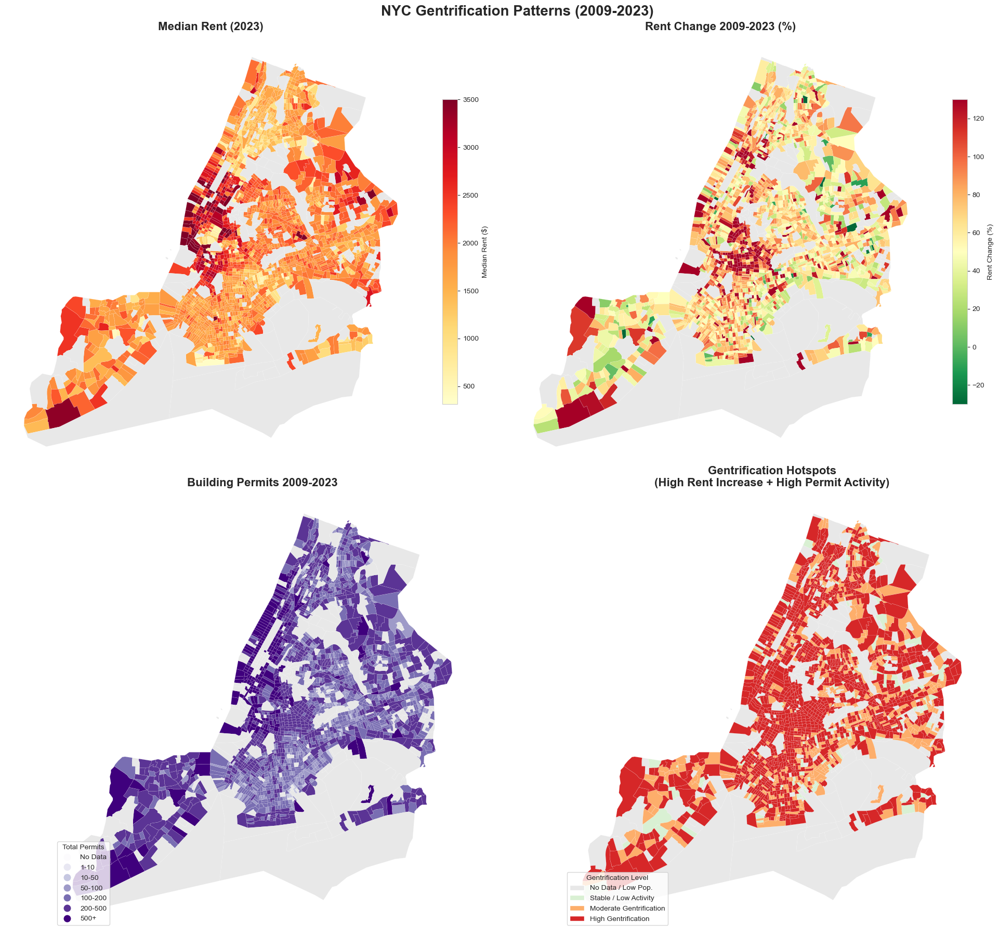


✓ Saved: nyc_gentrification_maps_complete.png

SUMMARY

High Gentrification tracts: 1373
By borough:
borough
Bronx            206
Brooklyn         513
Manhattan        227
Queens           372
Staten Island     55
Name: count, dtype: int64

Median rent increase in hotspots: 77.2%
Median permits in hotspots: 230


In [65]:
import pandas as pd
import psycopg2
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

print("Creating complete NYC maps with all tracts...")
print("="*60)

# Load ALL census tract boundaries (no filtering)
tracts = gpd.read_file('nyc_census_tracts.geojson')
county_to_borough = {
    '005': 'Bronx',
    '047': 'Brooklyn',
    '061': 'Manhattan',
    '081': 'Queens',
    '085': 'Staten Island'
}
tracts['borough'] = tracts['COUNTYFP'].map(county_to_borough)
tracts['geoid'] = tracts['TRACTCE'].astype(str).str.zfill(6)

print(f"Total NYC tracts: {len(tracts)}")

# Get data from database
conn = psycopg2.connect(
    dbname='nyc_gentrification',
    user='michaelcarter',
    password='',
    host='localhost'
)

query = """
    SELECT 
        a.borough,
        a.geoid,
        a.year,
        a.median_rent,
        a.total_pop,
        COALESCE(p.total_permits, 0) as total_permits
    FROM acs_demographics a
    LEFT JOIN permits p ON a.geoid = p.geoid AND a.borough = p.borough AND a.year = p.year
"""

df = pd.read_sql_query(query, conn)
conn.close()

# Calculate changes
rent_2009 = df[df['year'] == 2009][['borough', 'geoid', 'median_rent']].rename(columns={'median_rent': 'rent_2009'})
rent_2023 = df[df['year'] == 2023][['borough', 'geoid', 'median_rent']].rename(columns={'median_rent': 'rent_2023'})
permits_total = df.groupby(['borough', 'geoid'])['total_permits'].sum().reset_index().rename(columns={'total_permits': 'total_permits_all'})

changes = rent_2009.merge(rent_2023, on=['borough', 'geoid'])
changes = changes.merge(permits_total, on=['borough', 'geoid'], how='left')
changes['total_permits_all'] = changes['total_permits_all'].fillna(0)
changes['rent_change'] = changes['rent_2023'] - changes['rent_2009']
changes['rent_change_pct'] = ((changes['rent_2023'] - changes['rent_2009']) / changes['rent_2009']) * 100

# Merge with ALL tracts
map_data = tracts.merge(changes, on=['borough', 'geoid'], how='left')

print(f"Map data: {len(map_data)} tracts")
print(f"With data: {map_data['rent_2023'].notna().sum()} tracts")
print(f"Without data (parks, airports, etc.): {map_data['rent_2023'].isna().sum()} tracts")

# Create figure
fig, axes = plt.subplots(2, 2, figsize=(20, 18))
fig.suptitle('NYC Gentrification Patterns (2009-2023)', fontsize=20, y=0.995, fontweight='bold')

# 1. Median Rent 2023
ax1 = axes[0, 0]
# Plot data tracts
map_data[map_data['rent_2023'].notna()].plot(
    column='rent_2023', ax=ax1, legend=True, cmap='YlOrRd',
    edgecolor='white', linewidth=0.1,
    legend_kwds={'label': 'Median Rent ($)', 'shrink': 0.7}
)
# Plot no-data tracts in light grey
map_data[map_data['rent_2023'].isna()].plot(
    ax=ax1, color='#e8e8e8', edgecolor='white', linewidth=0.1
)
ax1.set_title('Median Rent (2023)', fontsize=16, fontweight='bold', pad=10)
ax1.axis('off')

# 2. Rent Change % 2009-2023  
ax2 = axes[0, 1]
vmin, vmax = -30, 130
# Plot data tracts
map_data[map_data['rent_change_pct'].notna()].plot(
    column='rent_change_pct', ax=ax2, legend=True, cmap='RdYlGn_r',
    edgecolor='white', linewidth=0.1,
    vmin=vmin, vmax=vmax,
    legend_kwds={'label': 'Rent Change (%)', 'shrink': 0.7}
)
# Plot no-data tracts in light grey
map_data[map_data['rent_change_pct'].isna()].plot(
    ax=ax2, color='#e8e8e8', edgecolor='white', linewidth=0.1
)
ax2.set_title('Rent Change 2009-2023 (%)', fontsize=16, fontweight='bold', pad=10)
ax2.axis('off')

# 3. Total Building Permits 2009-2023
ax3 = axes[1, 0]
# Create bins for better visualization
map_data['permits_binned'] = pd.cut(map_data['total_permits_all'], 
                                     bins=[-1, 0, 10, 50, 100, 200, 500, 2000],
                                     labels=['No Data', '1-10', '10-50', '50-100', '100-200', '200-500', '500+'])

# Plot with categorical legend
map_data[map_data['permits_binned'].notna()].plot(
    column='permits_binned', ax=ax3, legend=True, 
    cmap='Purples', categorical=True,
    edgecolor='white', linewidth=0.1,
    legend_kwds={'title': 'Total Permits', 'loc': 'lower left'}
)
# Plot true no-data tracts in light grey
map_data[map_data['permits_binned'].isna()].plot(
    ax=ax3, color='#e8e8e8', edgecolor='white', linewidth=0.1
)
ax3.set_title('Building Permits 2009-2023', fontsize=16, fontweight='bold', pad=10)
ax3.axis('off')

# 4. Gentrification "Hotspots"
ax4 = axes[1, 1]
map_data['hotspot'] = 'No Data / Low Pop.'
map_data.loc[map_data['rent_change_pct'].notna(), 'hotspot'] = 'Stable / Low Activity'
map_data.loc[(map_data['rent_change_pct'] > 25) & (map_data['total_permits_all'] > 50), 'hotspot'] = 'Moderate Gentrification'
map_data.loc[(map_data['rent_change_pct'] > 50) & (map_data['total_permits_all'] > 100), 'hotspot'] = 'High Gentrification'

from matplotlib.patches import Patch
colors = {
    'No Data / Low Pop.': '#e8e8e8',
    'Stable / Low Activity': '#d9f0d3',
    'Moderate Gentrification': '#fdae6b',
    'High Gentrification': '#d62728'
}

for category, color in colors.items():
    map_data[map_data['hotspot'] == category].plot(
        ax=ax4, color=color, edgecolor='white', linewidth=0.1
    )

legend_elements = [Patch(facecolor=color, label=cat) for cat, color in colors.items()]
ax4.legend(handles=legend_elements, title='Gentrification Level', 
          loc='lower left', fontsize=10)
ax4.set_title('Gentrification Hotspots\n(High Rent Increase + High Permit Activity)', 
              fontsize=16, fontweight='bold', pad=10)
ax4.axis('off')

plt.tight_layout()
plt.savefig('nyc_gentrification_maps_complete.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Saved: nyc_gentrification_maps_complete.png")

# Summary
print("\n" + "="*60)
print("SUMMARY")
print("="*60)

hotspots = map_data[map_data['hotspot'] == 'High Gentrification']
print(f"\nHigh Gentrification tracts: {len(hotspots)}")
print(f"By borough:")
print(hotspots['borough'].value_counts().sort_index())

print(f"\nMedian rent increase in hotspots: {hotspots['rent_change_pct'].median():.1f}%")
print(f"Median permits in hotspots: {hotspots['total_permits_all'].median():.0f}")

Creating maps with NYC-focused base layer...
NYC bounds: [-74.258843  40.476578 -73.700169  40.917705]
Loading and clipping base map...
Clipped base map: 190 features


/var/folders/x1/fr8rvs151fngmxrvmv6brw_m0000gp/T/ipykernel_62727/1053576826.py:66: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql_query(query, conn)


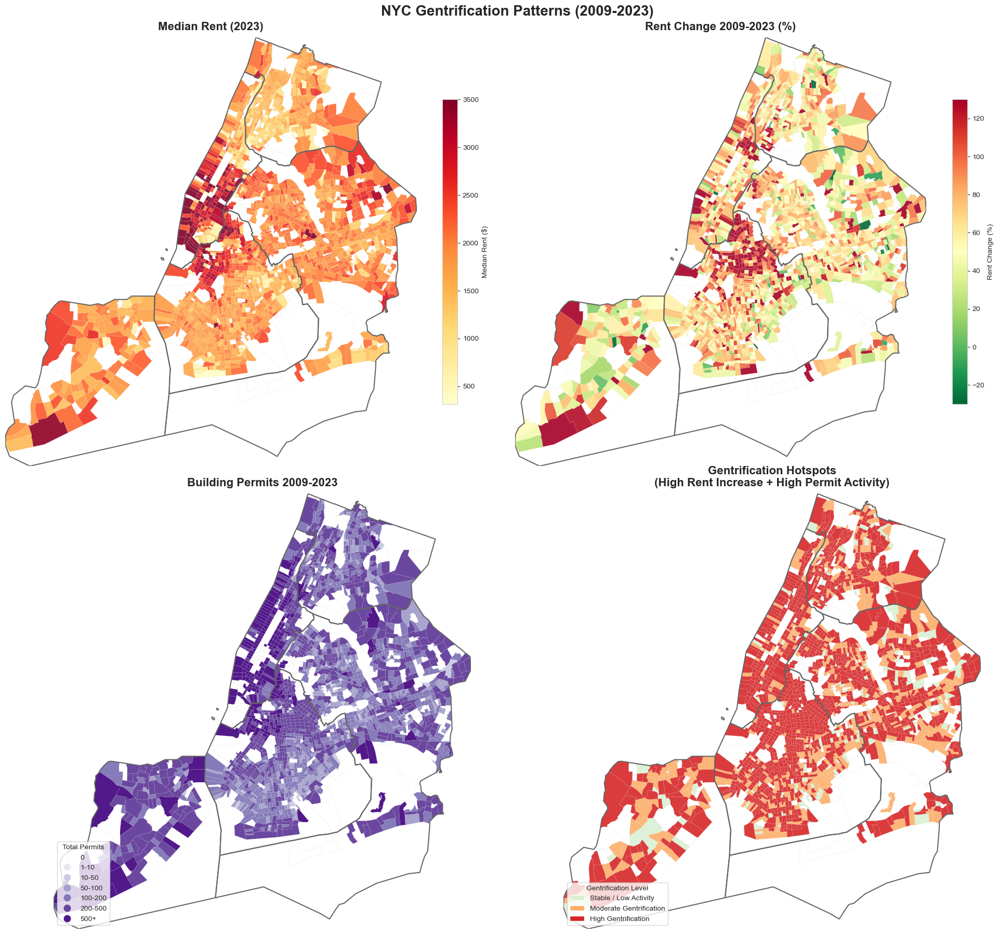


✓ Saved: nyc_gentrification_maps_final.png


In [67]:
import pandas as pd
import psycopg2
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

print("Creating maps with NYC-focused base layer...")
print("="*60)

# Load census tracts first to get NYC bounds
tracts = gpd.read_file('nyc_census_tracts.geojson')
county_to_borough = {
    '005': 'Bronx',
    '047': 'Brooklyn',
    '061': 'Manhattan',
    '081': 'Queens',
    '085': 'Staten Island'
}
tracts['borough'] = tracts['COUNTYFP'].map(county_to_borough)
tracts['geoid'] = tracts['TRACTCE'].astype(str).str.zfill(6)

# Get NYC bounding box
nyc_bounds = tracts.total_bounds
print(f"NYC bounds: {nyc_bounds}")

# Load base map and clip to NYC
print("Loading and clipping base map...")
base_map = gpd.read_file('zip://shapefile_all_counties.zip')
nyc_counties = ['005', '047', '061', '081', '085']
county_col = [c for c in base_map.columns if 'COUNTY' in c.upper()][0]
base_map = base_map[base_map[county_col].isin(nyc_counties)]

if base_map.crs != tracts.crs:
    base_map = base_map.to_crs(tracts.crs)

# Clip to NYC bounds with small buffer
from shapely.geometry import box
buffer = 5000  # meters
nyc_box = box(nyc_bounds[0]-buffer, nyc_bounds[1]-buffer, 
              nyc_bounds[2]+buffer, nyc_bounds[3]+buffer)
base_map = base_map.clip(nyc_box)

print(f"Clipped base map: {len(base_map)} features")

# Get data from database
conn = psycopg2.connect(
    dbname='nyc_gentrification',
    user='michaelcarter',
    password='',
    host='localhost'
)

query = """
    SELECT 
        a.borough,
        a.geoid,
        a.year,
        a.median_rent,
        a.total_pop,
        COALESCE(p.total_permits, 0) as total_permits
    FROM acs_demographics a
    LEFT JOIN permits p ON a.geoid = p.geoid AND a.borough = p.borough AND a.year = p.year
"""

df = pd.read_sql_query(query, conn)
conn.close()

# Calculate changes
rent_2009 = df[df['year'] == 2009][['borough', 'geoid', 'median_rent']].rename(columns={'median_rent': 'rent_2009'})
rent_2023 = df[df['year'] == 2023][['borough', 'geoid', 'median_rent']].rename(columns={'median_rent': 'rent_2023'})
permits_total = df.groupby(['borough', 'geoid'])['total_permits'].sum().reset_index().rename(columns={'total_permits': 'total_permits_all'})

changes = rent_2009.merge(rent_2023, on=['borough', 'geoid'])
changes = changes.merge(permits_total, on=['borough', 'geoid'], how='left')
changes['total_permits_all'] = changes['total_permits_all'].fillna(0)
changes['rent_change'] = changes['rent_2023'] - changes['rent_2009']
changes['rent_change_pct'] = ((changes['rent_2023'] - changes['rent_2009']) / changes['rent_2009']) * 100

# Merge with tracts
map_data = tracts.merge(changes, on=['borough', 'geoid'], how='left')

# Create figure
fig, axes = plt.subplots(2, 2, figsize=(20, 18))
fig.suptitle('NYC Gentrification Patterns (2009-2023)', fontsize=20, y=0.995, fontweight='bold')

# 1. Median Rent 2023
ax1 = axes[0, 0]
base_map.boundary.plot(ax=ax1, color='#666666', linewidth=1.5)
tracts.plot(ax=ax1, color='white', edgecolor='#cccccc', linewidth=0.1)
map_data[map_data['rent_2023'].notna()].plot(
    column='rent_2023', ax=ax1, legend=True, cmap='YlOrRd',
    edgecolor='white', linewidth=0.1, alpha=0.9,
    legend_kwds={'label': 'Median Rent ($)', 'shrink': 0.7}
)
ax1.set_xlim(nyc_bounds[0], nyc_bounds[2])
ax1.set_ylim(nyc_bounds[1], nyc_bounds[3])
ax1.set_title('Median Rent (2023)', fontsize=16, fontweight='bold', pad=10)
ax1.axis('off')

# 2. Rent Change % 2009-2023  
ax2 = axes[0, 1]
base_map.boundary.plot(ax=ax2, color='#666666', linewidth=1.5)
tracts.plot(ax=ax2, color='white', edgecolor='#cccccc', linewidth=0.1)
vmin, vmax = -30, 130
map_data[map_data['rent_change_pct'].notna()].plot(
    column='rent_change_pct', ax=ax2, legend=True, cmap='RdYlGn_r',
    edgecolor='white', linewidth=0.1, alpha=0.9,
    vmin=vmin, vmax=vmax,
    legend_kwds={'label': 'Rent Change (%)', 'shrink': 0.7}
)
ax2.set_xlim(nyc_bounds[0], nyc_bounds[2])
ax2.set_ylim(nyc_bounds[1], nyc_bounds[3])
ax2.set_title('Rent Change 2009-2023 (%)', fontsize=16, fontweight='bold', pad=10)
ax2.axis('off')

# 3. Total Building Permits 2009-2023
ax3 = axes[1, 0]
base_map.boundary.plot(ax=ax3, color='#666666', linewidth=1.5)
tracts.plot(ax=ax3, color='white', edgecolor='#cccccc', linewidth=0.1)

map_data['permits_binned'] = pd.cut(map_data['total_permits_all'], 
                                     bins=[-1, 0, 10, 50, 100, 200, 500, 2000],
                                     labels=['0', '1-10', '10-50', '50-100', '100-200', '200-500', '500+'])

map_data[map_data['total_permits_all'] > 0].plot(
    column='permits_binned', ax=ax3, legend=True, 
    cmap='Purples', categorical=True,
    edgecolor='white', linewidth=0.1, alpha=0.9,
    legend_kwds={'title': 'Total Permits', 'loc': 'lower left'}
)
ax3.set_xlim(nyc_bounds[0], nyc_bounds[2])
ax3.set_ylim(nyc_bounds[1], nyc_bounds[3])
ax3.set_title('Building Permits 2009-2023', fontsize=16, fontweight='bold', pad=10)
ax3.axis('off')

# 4. Gentrification "Hotspots"
ax4 = axes[1, 1]
base_map.boundary.plot(ax=ax4, color='#666666', linewidth=1.5)
tracts.plot(ax=ax4, color='white', edgecolor='#cccccc', linewidth=0.1)

map_data['hotspot'] = 'No Data'
map_data.loc[map_data['rent_change_pct'].notna(), 'hotspot'] = 'Stable / Low Activity'
map_data.loc[(map_data['rent_change_pct'] > 25) & (map_data['total_permits_all'] > 50), 'hotspot'] = 'Moderate Gentrification'
map_data.loc[(map_data['rent_change_pct'] > 50) & (map_data['total_permits_all'] > 100), 'hotspot'] = 'High Gentrification'

colors = {
    'Stable / Low Activity': '#d9f0d3',
    'Moderate Gentrification': '#fdae6b',
    'High Gentrification': '#d62728'
}

for category, color in colors.items():
    subset = map_data[map_data['hotspot'] == category]
    if len(subset) > 0:
        subset.plot(ax=ax4, color=color, edgecolor='white', linewidth=0.1, alpha=0.9)

legend_elements = [Patch(facecolor=color, label=cat) for cat, color in colors.items()]
ax4.legend(handles=legend_elements, title='Gentrification Level', 
          loc='lower left', fontsize=10)
ax4.set_xlim(nyc_bounds[0], nyc_bounds[2])
ax4.set_ylim(nyc_bounds[1], nyc_bounds[3])
ax4.set_title('Gentrification Hotspots\n(High Rent Increase + High Permit Activity)', 
              fontsize=16, fontweight='bold', pad=10)
ax4.axis('off')

plt.tight_layout()
plt.savefig('nyc_gentrification_maps_final.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Saved: nyc_gentrification_maps_final.png")

Creating maps with water overlay...
Creating water mask...
✓ Water mask created


/var/folders/x1/fr8rvs151fngmxrvmv6brw_m0000gp/T/ipykernel_62727/3900470794.py:67: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql_query(query, conn)


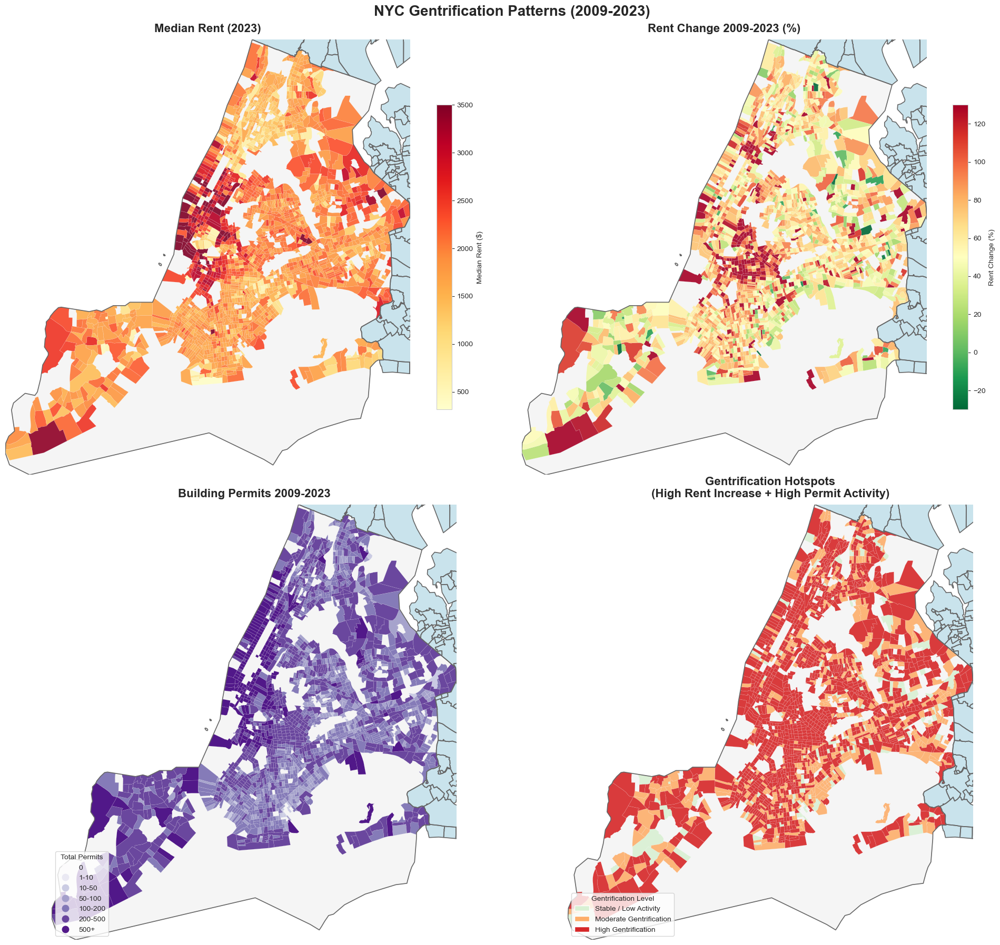


✓ Saved: nyc_gentrification_maps_final.png
Water features now visible on top of data!


In [70]:
import pandas as pd
import psycopg2
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch
from shapely.ops import unary_union
from shapely.geometry import box

print("Creating maps with water overlay...")
print("="*60)

# Load Places basemap
places = gpd.read_file('zip://shapefile_2025_place.zip')

# Load census tracts
tracts = gpd.read_file('nyc_census_tracts.geojson')
county_to_borough = {
    '005': 'Bronx',
    '047': 'Brooklyn',
    '061': 'Manhattan',
    '081': 'Queens',
    '085': 'Staten Island'
}
tracts['borough'] = tracts['COUNTYFP'].map(county_to_borough)
tracts['geoid'] = tracts['TRACTCE'].astype(str).str.zfill(6)
nyc_bounds = tracts.total_bounds

# Align CRS
if places.crs != tracts.crs:
    places = places.to_crs(tracts.crs)

# Clip places to NYC area
buffer = 5000
nyc_box = box(nyc_bounds[0]-buffer, nyc_bounds[1]-buffer, 
              nyc_bounds[2]+buffer, nyc_bounds[3]+buffer)
places = places.clip(nyc_box)

# Create water mask: Places boundary MINUS tract union
print("Creating water mask...")
places_union = unary_union(places.geometry)
tracts_union = unary_union(tracts.geometry)
water = places_union.difference(tracts_union)
water_gdf = gpd.GeoDataFrame([{'geometry': water}], crs=tracts.crs)
print(f"✓ Water mask created")

# Get data from database
conn = psycopg2.connect(
    dbname='nyc_gentrification',
    user='michaelcarter',
    password='',
    host='localhost'
)

query = """
    SELECT 
        a.borough,
        a.geoid,
        a.year,
        a.median_rent,
        a.total_pop,
        COALESCE(p.total_permits, 0) as total_permits
    FROM acs_demographics a
    LEFT JOIN permits p ON a.geoid = p.geoid AND a.borough = p.borough AND a.year = p.year
"""

df = pd.read_sql_query(query, conn)
conn.close()

# Calculate changes
rent_2009 = df[df['year'] == 2009][['borough', 'geoid', 'median_rent']].rename(columns={'median_rent': 'rent_2009'})
rent_2023 = df[df['year'] == 2023][['borough', 'geoid', 'median_rent']].rename(columns={'median_rent': 'rent_2023'})
permits_total = df.groupby(['borough', 'geoid'])['total_permits'].sum().reset_index().rename(columns={'total_permits': 'total_permits_all'})

changes = rent_2009.merge(rent_2023, on=['borough', 'geoid'])
changes = changes.merge(permits_total, on=['borough', 'geoid'], how='left')
changes['total_permits_all'] = changes['total_permits_all'].fillna(0)
changes['rent_change'] = changes['rent_2023'] - changes['rent_2009']
changes['rent_change_pct'] = ((changes['rent_2023'] - changes['rent_2009']) / changes['rent_2009']) * 100

# Merge with tracts
map_data = tracts.merge(changes, on=['borough', 'geoid'], how='left')

# Create figure
fig, axes = plt.subplots(2, 2, figsize=(20, 18))
fig.suptitle('NYC Gentrification Patterns (2009-2023)', fontsize=20, y=0.995, fontweight='bold')

# 1. Median Rent 2023
ax1 = axes[0, 0]
places.plot(ax=ax1, color='#f5f5f5', edgecolor='none')
map_data[map_data['rent_2023'].notna()].plot(
    column='rent_2023', ax=ax1, legend=True, cmap='YlOrRd',
    edgecolor='white', linewidth=0.1, alpha=0.9,
    legend_kwds={'label': 'Median Rent ($)', 'shrink': 0.7}
)
water_gdf.plot(ax=ax1, color='lightblue', alpha=0.6, edgecolor='none')  # Water on top
places.boundary.plot(ax=ax1, color='#666666', linewidth=1.2)  # Border on top
ax1.set_xlim(nyc_bounds[0], nyc_bounds[2])
ax1.set_ylim(nyc_bounds[1], nyc_bounds[3])
ax1.set_title('Median Rent (2023)', fontsize=16, fontweight='bold', pad=10)
ax1.axis('off')

# 2. Rent Change % 2009-2023  
ax2 = axes[0, 1]
places.plot(ax=ax2, color='#f5f5f5', edgecolor='none')
vmin, vmax = -30, 130
map_data[map_data['rent_change_pct'].notna()].plot(
    column='rent_change_pct', ax=ax2, legend=True, cmap='RdYlGn_r',
    edgecolor='white', linewidth=0.1, alpha=0.9,
    vmin=vmin, vmax=vmax,
    legend_kwds={'label': 'Rent Change (%)', 'shrink': 0.7}
)
water_gdf.plot(ax=ax2, color='lightblue', alpha=0.6, edgecolor='none')
places.boundary.plot(ax=ax2, color='#666666', linewidth=1.2)
ax2.set_xlim(nyc_bounds[0], nyc_bounds[2])
ax2.set_ylim(nyc_bounds[1], nyc_bounds[3])
ax2.set_title('Rent Change 2009-2023 (%)', fontsize=16, fontweight='bold', pad=10)
ax2.axis('off')

# 3. Total Building Permits 2009-2023
ax3 = axes[1, 0]
places.plot(ax=ax3, color='#f5f5f5', edgecolor='none')

map_data['permits_binned'] = pd.cut(map_data['total_permits_all'], 
                                     bins=[-1, 0, 10, 50, 100, 200, 500, 2000],
                                     labels=['0', '1-10', '10-50', '50-100', '100-200', '200-500', '500+'])

map_data[map_data['total_permits_all'] > 0].plot(
    column='permits_binned', ax=ax3, legend=True, 
    cmap='Purples', categorical=True,
    edgecolor='white', linewidth=0.1, alpha=0.9,
    legend_kwds={'title': 'Total Permits', 'loc': 'lower left'}
)
water_gdf.plot(ax=ax3, color='lightblue', alpha=0.6, edgecolor='none')
places.boundary.plot(ax=ax3, color='#666666', linewidth=1.2)
ax3.set_xlim(nyc_bounds[0], nyc_bounds[2])
ax3.set_ylim(nyc_bounds[1], nyc_bounds[3])
ax3.set_title('Building Permits 2009-2023', fontsize=16, fontweight='bold', pad=10)
ax3.axis('off')

# 4. Gentrification "Hotspots"
ax4 = axes[1, 1]
places.plot(ax=ax4, color='#f5f5f5', edgecolor='none')

map_data['hotspot'] = 'No Data'
map_data.loc[map_data['rent_change_pct'].notna(), 'hotspot'] = 'Stable / Low Activity'
map_data.loc[(map_data['rent_change_pct'] > 25) & (map_data['total_permits_all'] > 50), 'hotspot'] = 'Moderate Gentrification'
map_data.loc[(map_data['rent_change_pct'] > 50) & (map_data['total_permits_all'] > 100), 'hotspot'] = 'High Gentrification'

colors = {
    'Stable / Low Activity': '#d9f0d3',
    'Moderate Gentrification': '#fdae6b',
    'High Gentrification': '#d62728'
}

for category, color in colors.items():
    subset = map_data[map_data['hotspot'] == category]
    if len(subset) > 0:
        subset.plot(ax=ax4, color=color, edgecolor='white', linewidth=0.1, alpha=0.9)

water_gdf.plot(ax=ax4, color='lightblue', alpha=0.6, edgecolor='none')
places.boundary.plot(ax=ax4, color='#666666', linewidth=1.2)

legend_elements = [Patch(facecolor=color, label=cat) for cat, color in colors.items()]
ax4.legend(handles=legend_elements, title='Gentrification Level', 
          loc='lower left', fontsize=10)
ax4.set_xlim(nyc_bounds[0], nyc_bounds[2])
ax4.set_ylim(nyc_bounds[1], nyc_bounds[3])
ax4.set_title('Gentrification Hotspots\n(High Rent Increase + High Permit Activity)', 
              fontsize=16, fontweight='bold', pad=10)
ax4.axis('off')

plt.tight_layout()
plt.savefig('nyc_gentrification_maps_final.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Saved: nyc_gentrification_maps_final.png")
print("Water features now visible on top of data!")

In [71]:
import geopandas as gpd
import requests
import zipfile
import io

print("Downloading Census water features...")
print("="*60)

# Download water features for NYC counties from Census TIGER
# Area Water features show actual water bodies

nyc_counties = {
    '005': 'Bronx',
    '047': 'Kings', 
    '061': 'New York',
    '081': 'Queens',
    '085': 'Richmond'
}

water_gdfs = []

for county_code, county_name in nyc_counties.items():
    url = f"https://www2.census.gov/geo/tiger/TIGER2023/AREAWATER/tl_2023_36{county_code}_areawater.zip"
    print(f"\nDownloading water features for {county_name} County...")
    
    try:
        response = requests.get(url)
        response.raise_for_status()
        
        # Save temporarily
        with open(f'water_{county_code}.zip', 'wb') as f:
            f.write(response.content)
        
        # Load shapefile
        water = gpd.read_file(f'zip://water_{county_code}.zip')
        water_gdfs.append(water)
        print(f"  ✓ Loaded {len(water)} water features")
        
    except Exception as e:
        print(f"  ✗ Error: {e}")

if water_gdfs:
    # Combine all water features
    water_all = gpd.GeoDataFrame(pd.concat(water_gdfs, ignore_index=True))
    
    # Convert to same CRS as tracts
    tracts = gpd.read_file('nyc_census_tracts.geojson')
    water_all = water_all.to_crs(tracts.crs)
    
    # Save for future use
    water_all.to_file('nyc_water_features.geojson', driver='GeoJSON')
    
    print(f"\n✓ Combined water features: {len(water_all)} features")
    print(f"✓ Saved to: nyc_water_features.geojson")
    
    # Show sample
    print(f"\nSample water features:")
    print(water_all[['FULLNAME', 'AWATER']].head(10))
else:
    print("\n✗ No water features downloaded")


  ✓ Loaded 25 water features

  ✓ Loaded 38 water features

  ✓ Loaded 13 water features

  ✓ Loaded 71 water features

  ✓ Loaded 152 water features

✓ Combined water features: 299 features
✓ Saved to: nyc_water_features.geojson

Sample water features:
            FULLNAME    AWATER
0         Hudson Riv   3094534
1   Harlem River Bhl      1662
2  Long Island Sound  14702215
3         Harlem Riv      2916
4   Harlem River Bhl      1925
5         Harlem Riv     17989
6          Bronx Riv     39710
7         Harlem Riv     27111
8     Hutchinson Riv      5140
9        Hammond Crk    497388


Creating refined maps with adjusted thresholds...


/var/folders/x1/fr8rvs151fngmxrvmv6brw_m0000gp/T/ipykernel_62727/4194363018.py:60: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  df = pd.read_sql_query(query, conn)



Analyzing data distributions...
Permits distribution (percentiles):
count    2087.000000
mean      309.491136
std       413.345540
min         6.000000
25%       124.000000
50%       191.000000
75%       319.000000
90%       555.000000
95%      1018.200000
max      4004.000000
Name: total_permits_all, dtype: float64

Rent change % distribution:
count    2087.000000
mean       73.860296
std        41.491825
min       -62.468724
25%        50.525014
50%        69.080235
75%        88.391555
90%       117.882829
95%       144.442610
max       609.570410
Name: rent_change_pct, dtype: float64


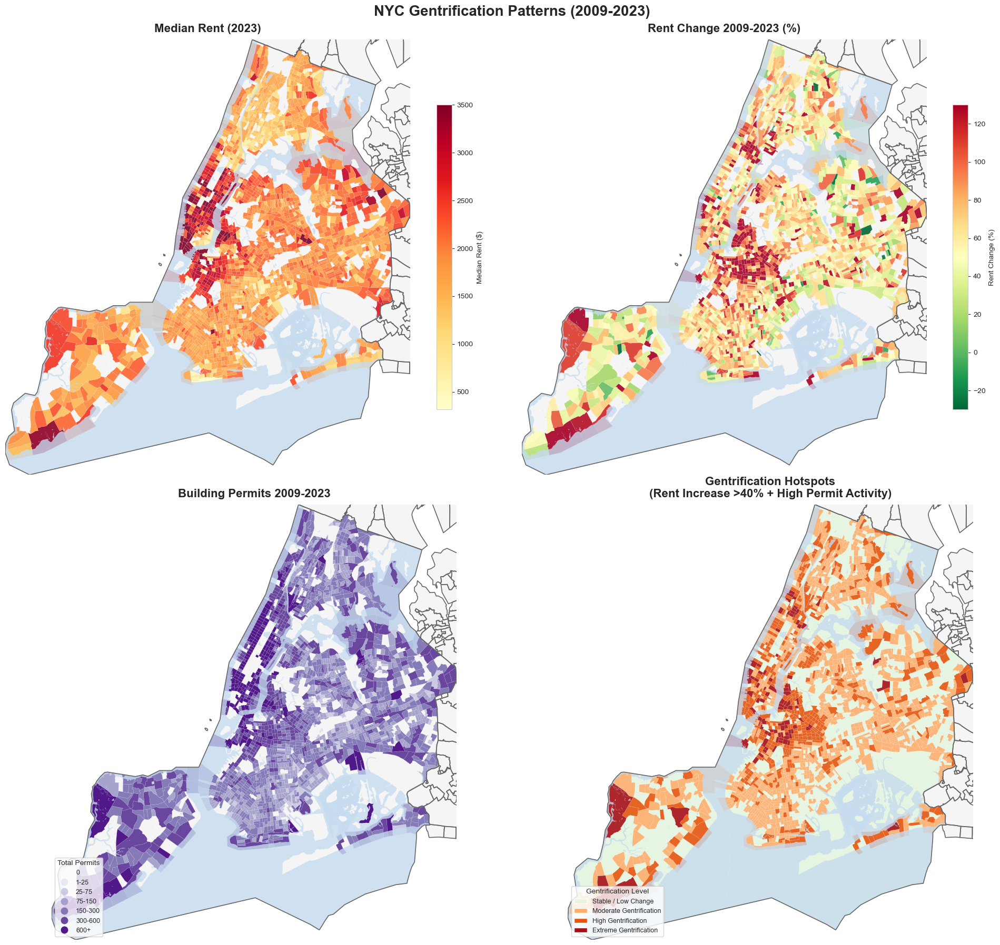


✓ Saved: nyc_gentrification_maps_final.png

GENTRIFICATION CATEGORIES
Stable / Low Change: 664 tracts
Moderate Gentrification: 1104 tracts
High Gentrification: 466 tracts
Extreme Gentrification: 93 tracts

Extreme Gentrification tracts by borough:
borough
Brooklyn         48
Manhattan        34
Staten Island     5
Queens            5
Bronx             1
Name: count, dtype: int64


In [73]:
import pandas as pd
import psycopg2
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch

print("Creating refined maps with adjusted thresholds...")
print("="*60)

# Load all layers
water = gpd.read_file('nyc_water_features.geojson')
places = gpd.read_file('zip://shapefile_2025_place.zip')
tracts = gpd.read_file('nyc_census_tracts.geojson')

county_to_borough = {
    '005': 'Bronx',
    '047': 'Brooklyn',
    '061': 'Manhattan',
    '081': 'Queens',
    '085': 'Staten Island'
}
tracts['borough'] = tracts['COUNTYFP'].map(county_to_borough)
tracts['geoid'] = tracts['TRACTCE'].astype(str).str.zfill(6)
nyc_bounds = tracts.total_bounds

# Align CRS
if places.crs != tracts.crs:
    places = places.to_crs(tracts.crs)
if water.crs != tracts.crs:
    water = water.to_crs(tracts.crs)

# Clip places
from shapely.geometry import box
buffer = 5000
nyc_box = box(nyc_bounds[0]-buffer, nyc_bounds[1]-buffer, 
              nyc_bounds[2]+buffer, nyc_bounds[3]+buffer)
places = places.clip(nyc_box)

# Get data
conn = psycopg2.connect(
    dbname='nyc_gentrification',
    user='michaelcarter',
    password='',
    host='localhost'
)

query = """
    SELECT 
        a.borough,
        a.geoid,
        a.year,
        a.median_rent,
        a.total_pop,
        COALESCE(p.total_permits, 0) as total_permits
    FROM acs_demographics a
    LEFT JOIN permits p ON a.geoid = p.geoid AND a.borough = p.borough AND a.year = p.year
"""

df = pd.read_sql_query(query, conn)
conn.close()

# Calculate changes
rent_2009 = df[df['year'] == 2009][['borough', 'geoid', 'median_rent']].rename(columns={'median_rent': 'rent_2009'})
rent_2023 = df[df['year'] == 2023][['borough', 'geoid', 'median_rent']].rename(columns={'median_rent': 'rent_2023'})
permits_total = df.groupby(['borough', 'geoid'])['total_permits'].sum().reset_index().rename(columns={'total_permits': 'total_permits_all'})

changes = rent_2009.merge(rent_2023, on=['borough', 'geoid'])
changes = changes.merge(permits_total, on=['borough', 'geoid'], how='left')
changes['total_permits_all'] = changes['total_permits_all'].fillna(0)
changes['rent_change'] = changes['rent_2023'] - changes['rent_2009']
changes['rent_change_pct'] = ((changes['rent_2023'] - changes['rent_2009']) / changes['rent_2009']) * 100

# Merge with tracts
map_data = tracts.merge(changes, on=['borough', 'geoid'], how='left')

# Analyze distributions for better thresholds
print("\nAnalyzing data distributions...")
print(f"Permits distribution (percentiles):")
print(map_data[map_data['total_permits_all'] > 0]['total_permits_all'].describe(percentiles=[.25, .5, .75, .90, .95]))

print(f"\nRent change % distribution:")
print(map_data['rent_change_pct'].describe(percentiles=[.25, .5, .75, .90, .95]))

# Create figure
fig, axes = plt.subplots(2, 2, figsize=(20, 18))
fig.suptitle('NYC Gentrification Patterns (2009-2023)', fontsize=20, y=0.995, fontweight='bold')

# 1. Median Rent 2023
ax1 = axes[0, 0]
places.plot(ax=ax1, color='#f5f5f5', edgecolor='none')
map_data[map_data['rent_2023'].notna()].plot(
    column='rent_2023', ax=ax1, legend=True, cmap='YlOrRd',
    edgecolor='white', linewidth=0.1, alpha=0.9,
    legend_kwds={'label': 'Median Rent ($)', 'shrink': 0.7}
)
water.plot(ax=ax1, color='#c6dbef', edgecolor='none', alpha=0.8)
places.boundary.plot(ax=ax1, color='#666666', linewidth=1.2)
ax1.set_xlim(nyc_bounds[0], nyc_bounds[2])
ax1.set_ylim(nyc_bounds[1], nyc_bounds[3])
ax1.set_title('Median Rent (2023)', fontsize=16, fontweight='bold', pad=10)
ax1.axis('off')

# 2. Rent Change % 2009-2023  
ax2 = axes[0, 1]
places.plot(ax=ax2, color='#f5f5f5', edgecolor='none')
vmin, vmax = -30, 130
map_data[map_data['rent_change_pct'].notna()].plot(
    column='rent_change_pct', ax=ax2, legend=True, cmap='RdYlGn_r',
    edgecolor='white', linewidth=0.1, alpha=0.9,
    vmin=vmin, vmax=vmax,
    legend_kwds={'label': 'Rent Change (%)', 'shrink': 0.7}
)
water.plot(ax=ax2, color='#c6dbef', edgecolor='none', alpha=0.8)
places.boundary.plot(ax=ax2, color='#666666', linewidth=1.2)
ax2.set_xlim(nyc_bounds[0], nyc_bounds[2])
ax2.set_ylim(nyc_bounds[1], nyc_bounds[3])
ax2.set_title('Rent Change 2009-2023 (%)', fontsize=16, fontweight='bold', pad=10)
ax2.axis('off')

# 3. Total Building Permits - MORE GRANULAR BINS
ax3 = axes[1, 0]
places.plot(ax=ax3, color='#f5f5f5', edgecolor='none')

# Use more granular bins based on distribution
map_data['permits_binned'] = pd.cut(map_data['total_permits_all'], 
                                     bins=[-1, 0, 25, 75, 150, 300, 600, 2000],
                                     labels=['0', '1-25', '25-75', '75-150', '150-300', '300-600', '600+'])

map_data[map_data['total_permits_all'] > 0].plot(
    column='permits_binned', ax=ax3, legend=True, 
    cmap='Purples', categorical=True,
    edgecolor='white', linewidth=0.1, alpha=0.9,
    legend_kwds={'title': 'Total Permits', 'loc': 'lower left', 'fontsize': 9}
)
water.plot(ax=ax3, color='#c6dbef', edgecolor='none', alpha=0.8)
places.boundary.plot(ax=ax3, color='#666666', linewidth=1.2)
ax3.set_xlim(nyc_bounds[0], nyc_bounds[2])
ax3.set_ylim(nyc_bounds[1], nyc_bounds[3])
ax3.set_title('Building Permits 2009-2023', fontsize=16, fontweight='bold', pad=10)
ax3.axis('off')

# 4. Gentrification "Hotspots" - STRICTER THRESHOLDS
ax4 = axes[1, 1]
places.plot(ax=ax4, color='#f5f5f5', edgecolor='none')

# Much stricter criteria for gentrification
map_data['hotspot'] = 'Stable / Low Change'
map_data.loc[(map_data['rent_change_pct'] > 40) & (map_data['total_permits_all'] > 75), 'hotspot'] = 'Moderate Gentrification'
map_data.loc[(map_data['rent_change_pct'] > 70) & (map_data['total_permits_all'] > 200), 'hotspot'] = 'High Gentrification'
map_data.loc[(map_data['rent_change_pct'] > 100) & (map_data['total_permits_all'] > 400), 'hotspot'] = 'Extreme Gentrification'

colors = {
    'Stable / Low Change': '#e5f5e0',
    'Moderate Gentrification': '#fdae6b',
    'High Gentrification': '#e6550d',
    'Extreme Gentrification': '#a50f15'
}

for category, color in colors.items():
    subset = map_data[map_data['hotspot'] == category]
    if len(subset) > 0:
        subset.plot(ax=ax4, color=color, edgecolor='white', linewidth=0.1, alpha=0.9)

water.plot(ax=ax4, color='#c6dbef', edgecolor='none', alpha=0.8)
places.boundary.plot(ax=ax4, color='#666666', linewidth=1.2)

legend_elements = [Patch(facecolor=color, label=cat) for cat, color in colors.items()]
ax4.legend(handles=legend_elements, title='Gentrification Level', 
          loc='lower left', fontsize=9)
ax4.set_xlim(nyc_bounds[0], nyc_bounds[2])
ax4.set_ylim(nyc_bounds[1], nyc_bounds[3])
ax4.set_title('Gentrification Hotspots\n(Rent Increase >40% + High Permit Activity)', 
              fontsize=16, fontweight='bold', pad=10)
ax4.axis('off')

plt.tight_layout()
plt.savefig('nyc_gentrification_maps_final.png', dpi=300, bbox_inches='tight')
plt.show()

print("\n✓ Saved: nyc_gentrification_maps_final.png")

# Print statistics
print("\n" + "="*60)
print("GENTRIFICATION CATEGORIES")
print("="*60)
for category in ['Stable / Low Change', 'Moderate Gentrification', 'High Gentrification', 'Extreme Gentrification']:
    count = len(map_data[map_data['hotspot'] == category])
    print(f"{category}: {count} tracts")
    
extreme = map_data[map_data['hotspot'] == 'Extreme Gentrification']
if len(extreme) > 0:
    print(f"\nExtreme Gentrification tracts by borough:")
    print(extreme['borough'].value_counts())